#

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df=pd.read_csv('/content/capsicum_food_final.csv')

In [ ]:
df.head(20)

,user_review_no,rating,time_ago,comment_likes,user_text,Service,Vegetarian offerings,Wheelchair accessibility,Kid-friendliness,Price per person,...,Vegetarian options,Unnamed: 12,Meal type,Parking space,Dietary restrictions,Parking options,Parking,Recommendation for vegetarians,Recommended dishes,Food
0,24 reviews,5 stars,a week ago,NaN,Capsicum - A Must-Visit in Varanasi!\n\nRating...,5,Menu is all vegetarian,NaN,NaN,₹200–400,...,NaN,NaN,Dinner,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce Pasta, Veg Pasta, Paratha, Hakka N...",5.0
1,7 reviews,1 star,a month ago,NaN,This place is just overhyped. Nothing tastes.\...,1,NaN,NaN,NaN,₹600–800,...,NaN,NaN,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2,20 photos,5 stars,4 months ago,2.0,I eat here plenty of times during my stay in V...,5,Large vegetarian selection,NaN,NaN,₹1–200,...,NaN,NaN,Dinner,NaN,NaN,NaN,NaN,Highly recommend,NaN,5.0
3,83 reviews,5 stars,a month ago,2.0,I'd give this pizza joint a 4 out of 5 stars. ...,4,NaN,NaN,NaN,₹200–400,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
4,1 photo,1 star,a month ago,NaN,Today I took chilli paneer and lacha paratha w...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
5,83 reviews,4 stars,a week ago,NaN,Overall the experience is very good nd food ar...,4,NaN,NaN,NaN,₹400–600,...,NaN,NaN,Other,Difficult to find parking,NaN,Parking is unavailable,NaN,NaN,Masala Dosa,5.0
6,8 reviews,5 stars,3 weeks ago,NaN,This is one of my favourite restaurant in vara...,5,Menu is all vegetarian,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce, Masala Dosa, Paneer Butter Masala...",5.0
7,275 reviews,4 stars,7 months ago,NaN,Better for Bdy celebration. I have tried here ...,5,"Menu is all vegetarian, Large vegetarian selec...",NaN,NaN,₹200–400,...,NaN,NaN,Lunch,NaN,NaN,NaN,NaN,NaN,NaN,5.0
8,24 reviews,3 stars,2 months ago,NaN,Food is less than average except for 1 or 2 di...,2,NaN,NaN,NaN,₹200–400,...,NaN,NaN,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,3.0
9,1 photo,1 star,a month ago,NaN,"Worst restaurant one can ever go to, there is ...",Dine in,NaN,NaN,NaN,"₹800–1,000",...,NaN,NaN,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   user_review_no                  584 non-null    object 
 1   rating                          800 non-null    object 
 2   time_ago                        800 non-null    object 
 3   comment_likes                   111 non-null    float64
 4   user_text                       418 non-null    object 
 5   Service                         453 non-null    object 
 6   Vegetarian offerings            47 non-null     object 
 7   Wheelchair accessibility        4 non-null      object 
 8   Kid-friendliness                3 non-null      object 
 9   Price per person                223 non-null    object 
 10  Atmosphere                      426 non-null    float64
 11  Vegetarian options              16 non-null     object 
 12  Unnamed: 12                     0 no

In [ ]:
df.isnull().sum()

,0
user_review_no,216
rating,0
time_ago,0
comment_likes,689
user_text,382
Service,347
Vegetarian offerings,753
Wheelchair accessibility,796
Kid-friendliness,797
Price per person,577


In [ ]:
df.describe()


,comment_likes,Atmosphere,Unnamed: 12,Food
count,111.000000,426.000000,0.0,433.000000
mean,1.909910,3.924883,NaN,4.117783
std,1.654468,1.187777,NaN,1.161689
min,1.000000,1.000000,NaN,1.000000
25%,1.000000,3.000000,NaN,4.000000
50%,1.000000,4.000000,NaN,4.000000
75%,2.000000,5.000000,NaN,5.000000
max,10.000000,5.000000,NaN,5.000000


In [ ]:
df.duplicated().sum()

44

In [ ]:
df=df.drop_duplicates()

# Make each Column Suitable for analysis(DATA CLEANING)

In [ ]:
df['user_review_no'] = df['user_review_no'].str.extract('(\d+)').fillna(0).astype(int)


In [ ]:
df['rating'] = df['rating'].str.extract('(\d+)').fillna(0).astype(int)

In [ ]:
df['comment_likes'] = df['comment_likes'].fillna(0).astype(int)

In [ ]:
df['Food'] = df['Food'].astype(pd.Int64Dtype())

In [ ]:
df['Atmosphere'] = df['Atmosphere'].astype(pd.Int64Dtype())

In [ ]:
df[['Lower_Limit_per_person', 'Upper_Limit_per_person']] = df['Price per person'].str.extract(r'₹(\d+)–(\d+)')

# Convert extracted strings to integers
df[['Lower_Limit_per_person', 'Upper_Limit_per_person']] = df[['Lower_Limit_per_person', 'Upper_Limit_per_person']].astype(pd.Int64Dtype())

In [ ]:
df['Service'] = df['Service'].str.extract('(\d+)').astype(pd.Int64Dtype())


In [ ]:
df.head(50)

,user_review_no,rating,time_ago,comment_likes,user_text,Service,Vegetarian offerings,Wheelchair accessibility,Kid-friendliness,Price per person,...,Meal type,Parking space,Dietary restrictions,Parking options,Parking,Recommendation for vegetarians,Recommended dishes,Food,Lower_Limit_per_person,Upper_Limit_per_person
0,24,5,a week ago,0,Capsicum - A Must-Visit in Varanasi!\n\nRating...,5,Menu is all vegetarian,NaN,NaN,₹200–400,...,Dinner,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce Pasta, Veg Pasta, Paratha, Hakka N...",5,200,400
1,7,1,a month ago,0,This place is just overhyped. Nothing tastes.\...,1,NaN,NaN,NaN,₹600–800,...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,1,600,800
2,20,5,4 months ago,2,I eat here plenty of times during my stay in V...,5,Large vegetarian selection,NaN,NaN,₹1–200,...,Dinner,NaN,NaN,NaN,NaN,Highly recommend,NaN,5,1,200
3,83,5,a month ago,2,I'd give this pizza joint a 4 out of 5 stars. ...,4,NaN,NaN,NaN,₹200–400,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,200,400
4,1,1,a month ago,0,Today I took chilli paneer and lacha paratha w...,<NA>,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,<NA>,<NA>
5,83,4,a week ago,0,Overall the experience is very good nd food ar...,4,NaN,NaN,NaN,₹400–600,...,Other,Difficult to find parking,NaN,Parking is unavailable,NaN,NaN,Masala Dosa,5,400,600
6,8,5,3 weeks ago,0,This is one of my favourite restaurant in vara...,5,Menu is all vegetarian,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce, Masala Dosa, Paneer Butter Masala...",5,<NA>,<NA>
7,275,4,7 months ago,0,Better for Bdy celebration. I have tried here ...,5,"Menu is all vegetarian, Large vegetarian selec...",NaN,NaN,₹200–400,...,Lunch,NaN,NaN,NaN,NaN,NaN,NaN,5,200,400
8,24,3,2 months ago,0,Food is less than average except for 1 or 2 di...,2,NaN,NaN,NaN,₹200–400,...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,3,200,400
9,1,1,a month ago,0,"Worst restaurant one can ever go to, there is ...",<NA>,NaN,NaN,NaN,"₹800–1,000",...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,800,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 756 entries, 0 to 798
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   user_review_no                  756 non-null    int64  
 1   rating                          756 non-null    int64  
 2   time_ago                        756 non-null    object 
 3   comment_likes                   756 non-null    int64  
 4   user_text                       418 non-null    object 
 5   Service                         410 non-null    Int64  
 6   Vegetarian offerings            47 non-null     object 
 7   Wheelchair accessibility        4 non-null      object 
 8   Kid-friendliness                3 non-null      object 
 9   Price per person                223 non-null    object 
 10  Atmosphere                      402 non-null    Int64  
 11  Vegetarian options              16 non-null     object 
 12  Unnamed: 12                     0 non-nul

# Cheaking  [Parking,Parking options,Parking space,Wheelchair accessibility ,Kid-friendliness ] Column

In [ ]:
df['Parking'].dropna().index

Index([16, 48, 63, 237], dtype='int64')

In [ ]:
df['Parking'][df['Parking'].dropna().index].apply(print)

Parking maybe an issue as they don't have their own parking you have to park in the side of the road
Parking for bike are somewhat available but for car it is not
Parking is very difficult , only option is to park on Road which have maximum sure chances of being cause of roadside parking Challan.
They do not provide any parking you can park your vehicle on the roadside.


,Parking
16,None
48,None
63,None
237,None


In [ ]:
df['Parking space'].dropna().index

Index([5, 16, 33, 34, 48, 63, 80, 95, 110, 159, 234, 337, 470, 645, 649, 658], dtype='int64')

In [ ]:
df['Parking space'][df['Parking space'].dropna().index].apply(print)

Difficult to find parking
Difficult to find parking
Somewhat difficult to find parking
Difficult to find parking
Somewhat difficult to find parking
Somewhat difficult to find parking
Somewhat difficult to find parking
Difficult to find parking
Somewhat difficult to find parking
Difficult to find parking
Somewhat difficult to find parking
Somewhat difficult to find parking
Difficult to find parking
Plenty of parking
Somewhat difficult to find parking
Somewhat difficult to find parking


,Parking space
5,None
16,None
33,None
34,None
48,None
63,None
80,None
95,None
110,None
159,None


In [ ]:
df['Parking options'].dropna().index

Index([5, 16, 34, 48, 63, 95, 110, 159, 234, 237, 337, 470, 645, 658], dtype='int64')

In [ ]:
df['Parking options'][df['Parking options'].dropna().index]

,Parking options
5,Parking is unavailable
16,"Free street parking, Parking is unavailable"
34,Parking is unavailable
48,Parking is unavailable
63,Parking is unavailable
95,Parking is unavailable
110,Free street parking
159,Parking is unavailable
234,Free street parking
237,"Free street parking, Parking is unavailable"


In [ ]:
df['Wheelchair accessibility'][df['Wheelchair accessibility'].dropna().index].apply(print)

No wheelchair accessibility
No wheelchair accessbilty
Disappointing for differently abled, please avoid going.
There is no wheelchair accessibility


,Wheelchair accessibility
16,None
63,None
152,None
237,None


In [ ]:
df['Kid-friendliness'][df['Kid-friendliness'].dropna().index].apply(print)

You can spend good time with you family here.
Kids can also go there.
Dessert 🎂


,Kid-friendliness
98,None
237,None
331,None


# Cheaking  [Vegetarian offerings   ,Vegetarian options ,Dietary restrictions, Recommendation for vegetarians,Recommended dishes] Column

In [ ]:
df['Dietary restrictions'][df['Dietary restrictions'].dropna().index].apply(print)

No there is no such dietary restrictions followed.
In hygienic 5 out of 5
based on taste it's 5 out of 5
On the basis of environment 5 out of 4
On the basis of service 5 out of 5


,Dietary restrictions
237,None
240,None


In [ ]:
df['Vegetarian options'][df['Vegetarian options'].dropna().index].apply(print)

Capsicum offers both veg and non veg options both cooked separately in two kitchens located in two separate floors.
There is everything veg.
Good option for vegitarian
100%veg
Lots uf vegetarian option is available
They serve good vegetarian foods.
God for veg people.
North Indian, Chinese Continental, south Indian
It's a vegetarian restaurant
Completely vegetarian
Plenty options
Good for vegetarian..
Hygienic food available
It's a complete vegetarian place
Everything which is in menu is vegitarian.
Baby corn


,Vegetarian options
14,None
56,None
63,None
88,None
90,None
98,None
132,None
152,None
156,None
190,None


In [ ]:
df['Vegetarian offerings'][df['Vegetarian offerings'].dropna().index].apply(print)

Menu is all vegetarian
Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian, Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian
Large vegetarian selection
Menu is all vegetarian, Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian, Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian
Large vegetarian selection
Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian
Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian, Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Large vegetarian selection
Menu is all vegetarian
Menu is all vegetarian
Large vegetarian selection
Large vegetarian selection
Clearly labeled vegetarian dishes
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian
Menu is all vegetarian, Vegetarian menu 

,Vegetarian offerings
0,None
2,None
6,None
7,None
11,None
17,None
25,None
48,None
52,None
56,None


In [ ]:
df['Recommendation for vegetarians'][df['Recommendation for vegetarians'].dropna().index].value_counts()

,count
Recommendation for vegetarians,
Highly recommend,39
Somewhat recommend,9
Would not recommend,1


In [ ]:
 df['Recommended dishes'][df['Recommended dishes'].dropna().index].apply(print)

White Sauce Pasta, Veg Pasta, Paratha, Hakka Noodles, Fried, Mushroom Rolls, Spring Roll Dosa
Masala Dosa
White Sauce, Masala Dosa, Paneer Butter Masala, White Sauce Pasta, Veg Pasta, Paratha, Hakka Noodles, Fried, Chhole Bhature, Veg Roll
White Sauce Pasta
Jugalbandi Pizza, Masala Dosa, White Sauce Pasta, Veg Pasta, Paneer Paratha Choley, Cheesy Tacos, Hakka Noodles, Chilli Garlic Noodles, Chhole Bhature, Veg Noodles
Crispy Baby Corn, White Sauce Pasta, Hakka Noodles
Crispy Baby Corn, Masala Dosa, White Sauce Pasta, Chhole Bhature
Paneer Butter Masala, White Sauce Pasta, Hakka Noodles, Chilli Garlic Noodles
Mushroom Rolls
Paneer Butter Masala, Mushroom Rolls, Veg Roll, Cheese Burst Pizza
Paneer Butter Masala, Pav Bhaji, Chilli Garlic Noodles, Chhole Bhature, Cheese Burst Pizza
Hakka Noodles
White Sauce Pasta, Chilli Garlic Noodles, Veg Roll, Cheese Burst Pizza
Paneer Butter Masala, Pav Bhaji, Cheese Burst Pizza
Pav Bhaji, Chilli Garlic Noodles
Masala Dosa, Paneer Butter Masala, Pav Bh

,Recommended dishes
0,None
5,None
6,None
13,None
14,None
...,...
763,None
778,None
783,None
789,None


In [ ]:
df['Recommended dishes'] = df['Recommended dishes'].fillna('').apply(lambda x: x.split(','))



In [ ]:
df['Recommended dishes']

,Recommended dishes
0,"[White Sauce Pasta, Veg Pasta, Paratha, Hak..."
1,[]
2,[]
3,[]
4,[]
...,...
792,[Cheese Rolls]
794,[]
796,[]
797,[]


In [ ]:
len(df['comment_likes'])

756

In [ ]:
df.iloc[755]['comment_likes']

0

In [ ]:
df['Recommended dishes'][200]

['']

In [ ]:
dishs=[]
for i in range(0,len(df['Recommended dishes'])):
    weight=df.iloc[i]['comment_likes']+1
    for j in df.iloc[i]['Recommended dishes']:
        if len(j)!=0:
            for k in range(0,weight):
                dishs.append(j)

In [ ]:
dishs

['White Sauce Pasta',
 ' Veg Pasta',
 ' Paratha',
 ' Hakka Noodles',
 ' Fried',
 ' Mushroom Rolls',
 ' Spring Roll Dosa',
 'Masala Dosa',
 'White Sauce',
 ' Masala Dosa',
 ' Paneer Butter Masala',
 ' White Sauce Pasta',
 ' Veg Pasta',
 ' Paratha',
 ' Hakka Noodles',
 ' Fried',
 ' Chhole Bhature',
 ' Veg Roll',
 'White Sauce Pasta',
 'Jugalbandi Pizza',
 ' Masala Dosa',
 ' White Sauce Pasta',
 ' Veg Pasta',
 ' Paneer Paratha Choley',
 ' Cheesy Tacos',
 ' Hakka Noodles',
 ' Chilli Garlic Noodles',
 ' Chhole Bhature',
 ' Veg Noodles',
 'Crispy Baby Corn',
 ' White Sauce Pasta',
 ' Hakka Noodles',
 'Crispy Baby Corn',
 ' Masala Dosa',
 ' White Sauce Pasta',
 ' Chhole Bhature',
 'Paneer Butter Masala',
 ' White Sauce Pasta',
 ' Hakka Noodles',
 ' Chilli Garlic Noodles',
 'Mushroom Rolls',
 'Paneer Butter Masala',
 ' Mushroom Rolls',
 ' Veg Roll',
 ' Cheese Burst Pizza',
 'Paneer Butter Masala',
 ' Pav Bhaji',
 ' Chilli Garlic Noodles',
 ' Chhole Bhature',
 ' Cheese Burst Pizza',
 'Hakka Noo

In [ ]:
from collections import Counter

# Count the frequency of each item in the list
frequency = Counter(dishs)
sort_freq=sorted(frequency.items(), key=lambda x: x[1], reverse=True)

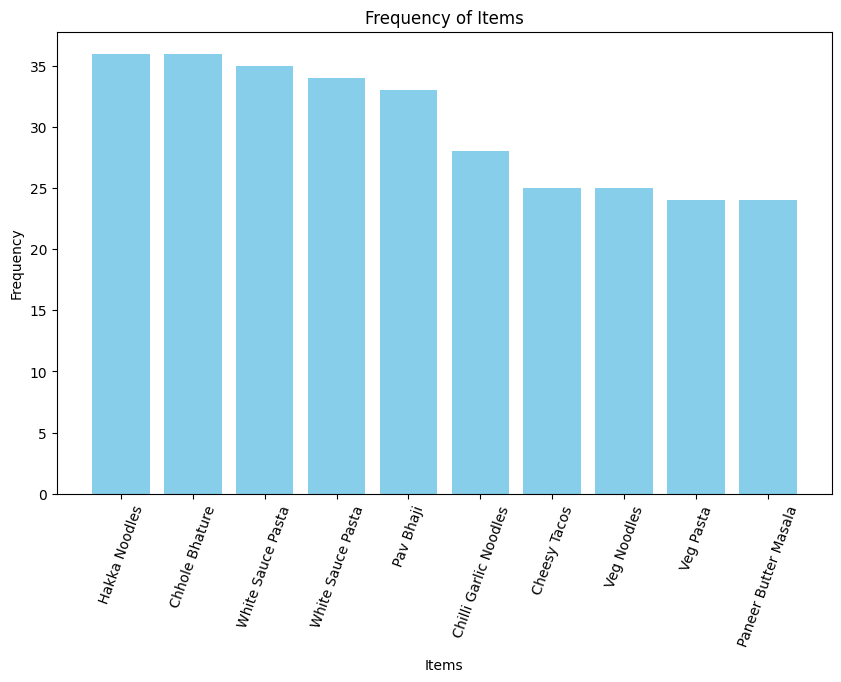

In [ ]:
import matplotlib.pyplot as plt
top_n_items = sort_freq[:10]
# Unzip the sorted items into separate lists
items, counts = zip(*top_n_items)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(items, counts, color='skyblue')
plt.xlabel('Items')
plt.ylabel('Frequency')
plt.title('Frequency of Items')
plt.xticks(rotation=70)
plt.show()

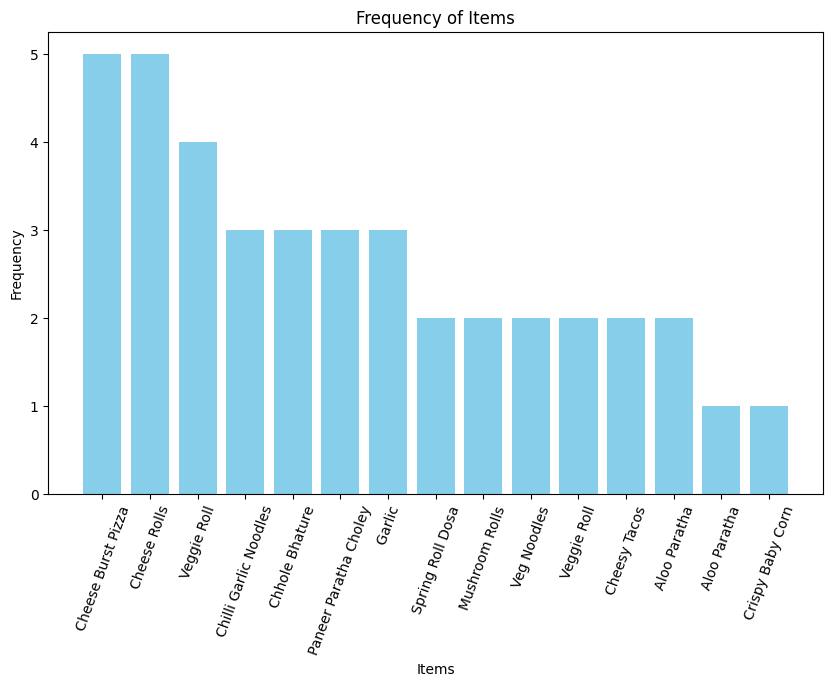

In [ ]:
import matplotlib.pyplot as plt
last_n_items = sort_freq[-15:]
# Unzip the sorted items into separate lists
items, counts = zip(*last_n_items)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(items, counts, color='skyblue')
plt.xlabel('Items')
plt.ylabel('Frequency')
plt.title('Frequency of Items')
plt.xticks(rotation=70)
plt.show()

## Cheaking [Service,Lower_Limit_per_person,Upper_Limit_per_person,Atmosphere,Food,rating] column

In [ ]:
df['Service'].info()

<class 'pandas.core.series.Series'>
Index: 756 entries, 0 to 798
Series name: Service
Non-Null Count  Dtype
--------------  -----
410 non-null    Int64
dtypes: Int64(1)
memory usage: 28.7 KB


In [ ]:
test=df[['Service','rating']].dropna(how='any')

In [ ]:
test

,Service,rating
0,5,5
1,1,1
2,5,5
3,4,5
5,4,4
...,...,...
788,4,5
789,4,4
790,5,4
794,3,4


<Axes: xlabel='Service', ylabel='count'>

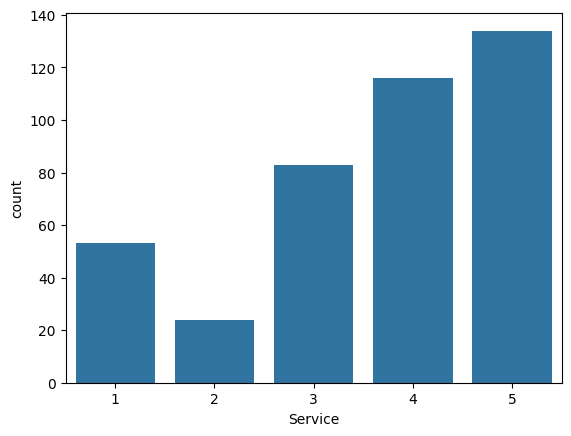

In [ ]:
import seaborn as sns
sns.countplot(test,x="Service")

<Axes: xlabel='rating', ylabel='count'>

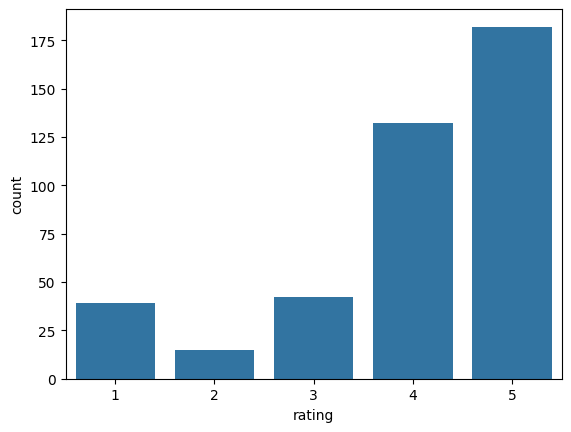

In [ ]:
import seaborn as sns
sns.countplot(test,x="rating")

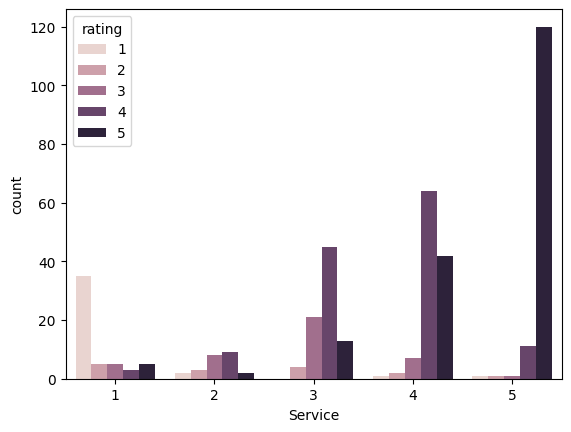

In [ ]:
sns.countplot(test,x="Service",hue='rating')
plt.show()

In [ ]:
test.corr()

,Service,rating
Service,1.000000,0.746367
rating,0.746367,1.000000


In [ ]:
test1=df[['Atmosphere','rating']].dropna(how='any')

<Axes: xlabel='Atmosphere', ylabel='count'>

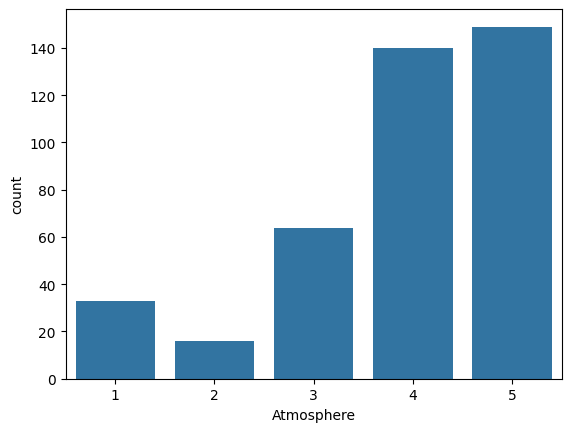

In [ ]:
import seaborn as sns
sns.countplot(test1,x="Atmosphere")

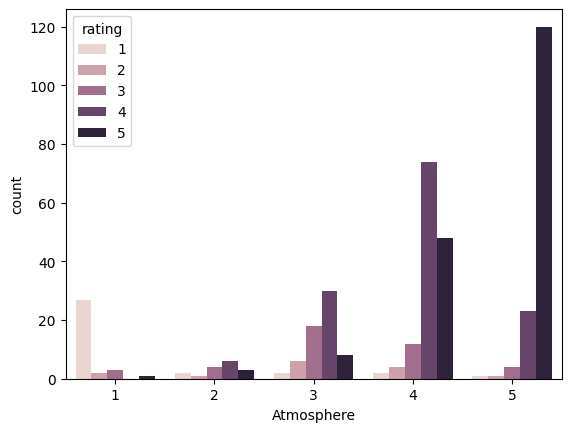

In [ ]:
sns.countplot(test1,x="Atmosphere",hue='rating')
plt.show()

In [ ]:
test1.corr()

,Atmosphere,rating
Atmosphere,1.000000,0.727831
rating,0.727831,1.000000


In [ ]:
test2=df[['Food','rating']].dropna(how='any')

<Axes: xlabel='Food', ylabel='count'>

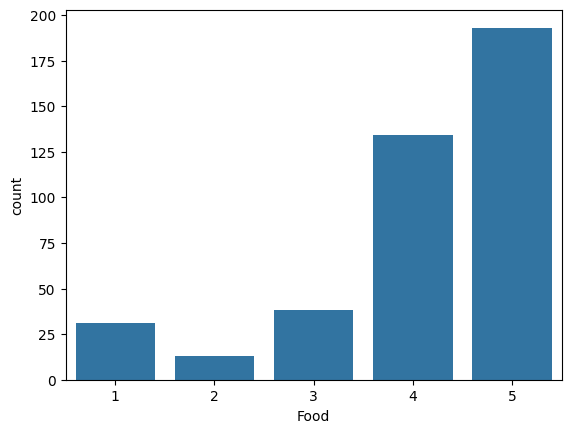

In [ ]:
import seaborn as sns
sns.countplot(test2,x="Food")

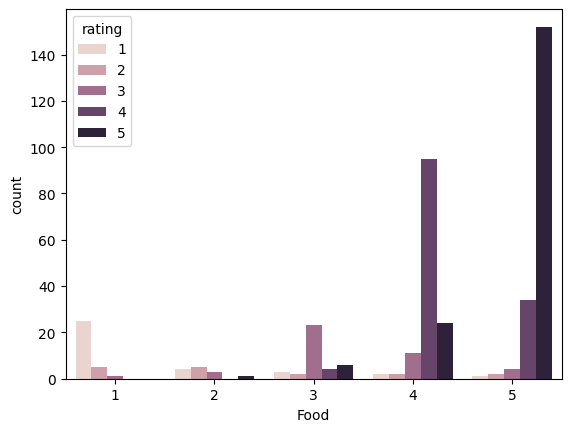

In [ ]:
sns.countplot(test2,x="Food",hue='rating')
plt.show()

In [ ]:
test2.corr()

,Food,rating
Food,1.000000,0.820452
rating,0.820452,1.000000


In [ ]:
test3=df[['Lower_Limit_per_person','Upper_Limit_per_person','Price per person','rating']].dropna(how='any')

<Axes: xlabel='Lower_Limit_per_person', ylabel='count'>

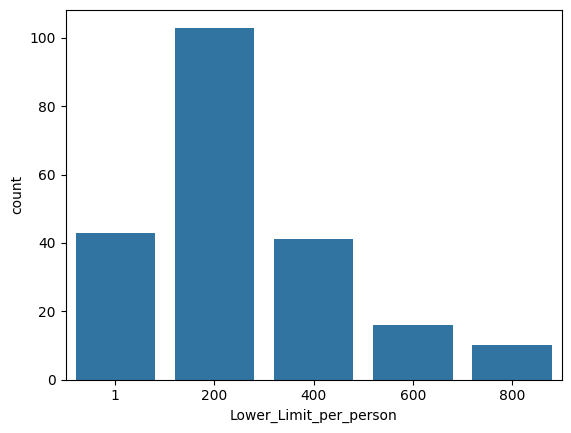

In [ ]:
sns.countplot(test3,x="Lower_Limit_per_person")

<Axes: xlabel='Upper_Limit_per_person', ylabel='count'>

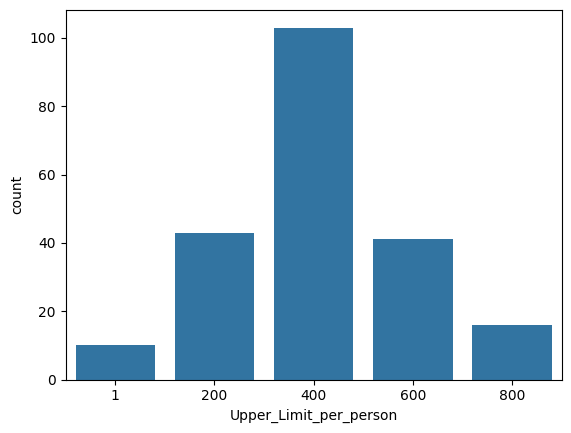

In [ ]:
sns.countplot(test3,x="Upper_Limit_per_person")

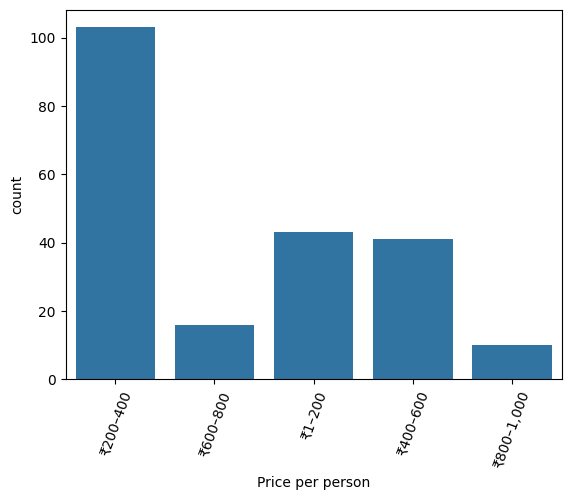

In [ ]:
sns.countplot(test3,x="Price per person")
plt.xticks(rotation=70)
plt.show()

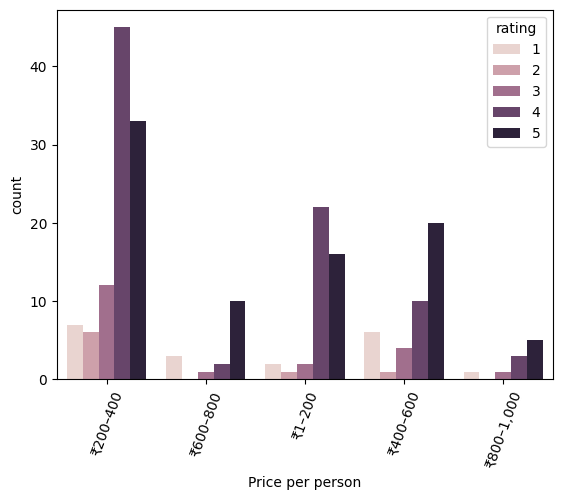

In [ ]:
sns.countplot(test3,x="Price per person",hue='rating')
plt.xticks(rotation=70)
plt.show()

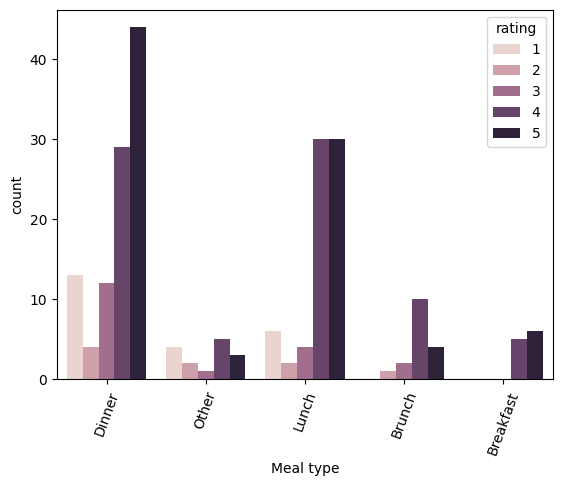

In [ ]:
sns.countplot(df,x="Meal type",hue='rating')
plt.xticks(rotation=70)
plt.show()

#  NLP

In [ ]:
df.head(10)

,user_review_no,rating,time_ago,comment_likes,user_text,Service,Vegetarian offerings,Wheelchair accessibility,Kid-friendliness,Price per person,...,Meal type,Parking space,Dietary restrictions,Parking options,Parking,Recommendation for vegetarians,Recommended dishes,Food,Lower_Limit_per_person,Upper_Limit_per_person
0,24,5,a week ago,0,Capsicum - A Must-Visit in Varanasi!\n\nRating...,5,Menu is all vegetarian,NaN,NaN,₹200–400,...,Dinner,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce Pasta, Veg Pasta, Paratha, Hakka N...",5,200,400
1,7,1,a month ago,0,This place is just overhyped. Nothing tastes.\...,1,NaN,NaN,NaN,₹600–800,...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,1,600,800
2,20,5,4 months ago,2,I eat here plenty of times during my stay in V...,5,Large vegetarian selection,NaN,NaN,₹1–200,...,Dinner,NaN,NaN,NaN,NaN,Highly recommend,NaN,5,1,200
3,83,5,a month ago,2,I'd give this pizza joint a 4 out of 5 stars. ...,4,NaN,NaN,NaN,₹200–400,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,200,400
4,1,1,a month ago,0,Today I took chilli paneer and lacha paratha w...,<NA>,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,<NA>,<NA>
5,83,4,a week ago,0,Overall the experience is very good nd food ar...,4,NaN,NaN,NaN,₹400–600,...,Other,Difficult to find parking,NaN,Parking is unavailable,NaN,NaN,Masala Dosa,5,400,600
6,8,5,3 weeks ago,0,This is one of my favourite restaurant in vara...,5,Menu is all vegetarian,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Highly recommend,"White Sauce, Masala Dosa, Paneer Butter Masala...",5,<NA>,<NA>
7,275,4,7 months ago,0,Better for Bdy celebration. I have tried here ...,5,"Menu is all vegetarian, Large vegetarian selec...",NaN,NaN,₹200–400,...,Lunch,NaN,NaN,NaN,NaN,NaN,NaN,5,200,400
8,24,3,2 months ago,0,Food is less than average except for 1 or 2 di...,2,NaN,NaN,NaN,₹200–400,...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,3,200,400
9,1,1,a month ago,0,"Worst restaurant one can ever go to, there is ...",<NA>,NaN,NaN,NaN,"₹800–1,000",...,Dinner,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,800,1


In [ ]:
df['cleaned']=df.loc[:,'user_text']

In [ ]:
df['cleaned'].isnull().sum()

338

In [ ]:
df=df.dropna(subset=['cleaned'])

In [ ]:
df['cleaned']

,cleaned
0,Capsicum - A Must-Visit in Varanasi!\n\nRating...
1,This place is just overhyped. Nothing tastes.\...
2,I eat here plenty of times during my stay in V...
3,I'd give this pizza joint a 4 out of 5 stars. ...
4,Today I took chilli paneer and lacha paratha w...
...,...
457,Okk
484,V nice
491,Nic
568,Mediam


In [ ]:
import re

def preprocess(q):

    q = str(q).lower().strip()

    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')

    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')

    # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)

    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = {
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")


    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()


    return q

In [ ]:
df['cleaned']=df['cleaned'].apply(lambda x:preprocess(x))

In [ ]:
print(df['user_text'][1])
print('\n')
print(df['cleaned'][1])

This place is just overhyped. Nothing tastes.
We ordered Afghani momo bc it looked like it was served straight out of the freezer. Menchurian is also no taste not baked properly. Also, when you order rice, it looks like you have vegetable pulao there along with whole turmeric.
709₹ What splash in water 💦
My time was wasted after waiting for 1 hour 💦


this place is just overhyped  nothing tastes  we ordered afghani momo bc it looked like it was served straight out of the freezer  menchurian is also no taste not baked properly  also  when you order rice  it looks like you have vegetable pulao there along with whole turmeric  709 rupee what splash in water   my time was wasted after waiting for 1 hour


In [ ]:
def regularex(text):
    import re
    # Pattern to remove colons  between the words, extra spaces, single-character words, and two-character words,line break(\n)
    reg = re.compile(r':|\b\w{1,2}\b|\s{2,}|\n')

    # Applying the regex substitution to each element in the cleaned text column
    text = reg.sub(' ', text).strip()
    return text

#removing of numerical values
def remove_num(text):
    reg=re.compile('\d')
    text=reg.sub('',text)
    return text

# needed to remove extra spaces
def extraspace(text):
    import re
    # Pattern to remove extra spaces
    reg = re.compile(r'\s{2,}')

    # Applying the regex substitution to each element in the cleaned text column
    text = reg.sub(' ', text).strip()
    return text

In [ ]:
df['cleaned1']=df['cleaned'].apply(lambda x:remove_num(x))
df['cleaned1']=df['cleaned1'].apply(lambda x:regularex(x))
df['cleaned1']=df['cleaned1'].apply(lambda x:extraspace(x))

In [ ]:
print(df['user_text'][4])
print('\n')
print(df['cleaned1'][4])

Today I took chilli paneer and lacha paratha which made a dam of 3rd quality. Gave it a test of chilli paneer and lacha paratha which made a dam which was very heavy.


today took chilli paneer and lacha paratha which made dam quality gave test chilli paneer and lacha paratha which made dam which was very heavy


In [ ]:
df.head()

,user_review_no,rating,time_ago,comment_likes,user_text,Service,Vegetarian offerings,Wheelchair accessibility,Kid-friendliness,Price per person,...,Dietary restrictions,Parking options,Parking,Recommendation for vegetarians,Recommended dishes,Food,Lower_Limit_per_person,Upper_Limit_per_person,cleaned,cleaned1
0,24,5,a week ago,0,Capsicum - A Must-Visit in Varanasi!\n\nRating...,5,Menu is all vegetarian,NaN,NaN,₹200–400,...,NaN,NaN,NaN,Highly recommend,"White Sauce Pasta, Veg Pasta, Paratha, Hakka N...",5,200,400,capsicum a must visit in varanasi rating 5...,capsicum must visit varanasi rating review tuc...
1,7,1,a month ago,0,This place is just overhyped. Nothing tastes.\...,1,NaN,NaN,NaN,₹600–800,...,NaN,NaN,NaN,NaN,NaN,1,600,800,this place is just overhyped nothing tastes ...,this place just overhyped nothing tastes order...
2,20,5,4 months ago,2,I eat here plenty of times during my stay in V...,5,Large vegetarian selection,NaN,NaN,₹1–200,...,NaN,NaN,NaN,Highly recommend,NaN,5,1,200,i eat here plenty of times during my stay in v...,eat here plenty times during stay varanasi and...
3,83,5,a month ago,2,I'd give this pizza joint a 4 out of 5 stars. ...,4,NaN,NaN,NaN,₹200–400,...,NaN,NaN,NaN,NaN,NaN,5,200,400,i would give this pizza joint a 4 out of 5 sta...,would give this pizza joint out stars the pizz...
4,1,1,a month ago,0,Today I took chilli paneer and lacha paratha w...,<NA>,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1,<NA>,<NA>,today i took chilli paneer and lacha paratha w...,today took chilli paneer and lacha paratha whi...


In [ ]:
!pip install emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.4/431.4 kB 9.2 MB/s eta 0:00:00


In [ ]:
pip install --upgrade typing_extensions

In [ ]:
#removing text with their meaning
import emoji
df['cleaned1']=df['cleaned1'].apply(lambda x:emoji.demojize(x))

In [ ]:
df.head()

,user_review_no,rating,time_ago,comment_likes,user_text,Service,Vegetarian offerings,Wheelchair accessibility,Kid-friendliness,Price per person,...,Dietary restrictions,Parking options,Parking,Recommendation for vegetarians,Recommended dishes,Food,Lower_Limit_per_person,Upper_Limit_per_person,cleaned,cleaned1
0,24,5,a week ago,0,Capsicum - A Must-Visit in Varanasi!\n\nRating...,5,Menu is all vegetarian,NaN,NaN,₹200–400,...,NaN,NaN,NaN,Highly recommend,"White Sauce Pasta, Veg Pasta, Paratha, Hakka N...",5,200,400,capsicum a must visit in varanasi rating 5...,capsicum must visit varanasi rating review tuc...
1,7,1,a month ago,0,This place is just overhyped. Nothing tastes.\...,1,NaN,NaN,NaN,₹600–800,...,NaN,NaN,NaN,NaN,NaN,1,600,800,this place is just overhyped nothing tastes ...,this place just overhyped nothing tastes order...
2,20,5,4 months ago,2,I eat here plenty of times during my stay in V...,5,Large vegetarian selection,NaN,NaN,₹1–200,...,NaN,NaN,NaN,Highly recommend,NaN,5,1,200,i eat here plenty of times during my stay in v...,eat here plenty times during stay varanasi and...
3,83,5,a month ago,2,I'd give this pizza joint a 4 out of 5 stars. ...,4,NaN,NaN,NaN,₹200–400,...,NaN,NaN,NaN,NaN,NaN,5,200,400,i would give this pizza joint a 4 out of 5 sta...,would give this pizza joint out stars the pizz...
4,1,1,a month ago,0,Today I took chilli paneer and lacha paratha w...,<NA>,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1,<NA>,<NA>,today i took chilli paneer and lacha paratha w...,today took chilli paneer and lacha paratha whi...


In [ ]:
import string
string.punctuation

exclude=string.punctuation

In [ ]:
# def remove_punc(text):
#     for char in exclude:
#         text=text.replace(char,'')
#     return text

def remove_punc1(text):
    return text.translate(str.maketrans('','',exclude))

In [ ]:
df['cleaned1']=df['cleaned1'].apply(lambda x:remove_punc1(x))

In [ ]:
print(df['user_text'][0])
print('\n')
print(df['cleaned1'][0])

Capsicum - A Must-Visit in Varanasi!

Rating: 5/5

Review:

Tucked away in the heart of Varanasi, Capsicum is a hidden gem that will delight your taste buds and leave you craving for more! This casual dining outlet is a treasure trove of flavors, offering an extensive menu that spans across the globe, from Indian to Chinese, Italian, Mexican, and American cuisines.

Ambiance:
The moment you step into Capsicum, you'll be enveloped in a warm and welcoming atmosphere that instantly puts you at ease. The comfortable seating and soothing decor create the perfect setting for a leisurely meal with friends and family.

Food:
The menu is a masterclass in diversity, with dishes carefully crafted to cater to various tastes and dietary preferences. Standout dishes like the Maharaja Platter, Platters, Paneer Roll, Veg Roll, White Sauce Pasta, and Crispy Baby Corn are a testament to the chef's creativity and expertise. The portions are generous, and the prices are incredibly reasonable, making it an

In [ ]:
!pip install nltk

In [ ]:
from nltk.corpus import stopwords


In [ ]:
def remove_stopwords(text):
    new_text = []

    for word in text.split():
        if word in stopwords.words('english'):
            new_text.append('')
        else:
            new_text.append(word)
    x = new_text[:]
    new_text.clear()
    return " ".join(x)

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
df['cleaned1']=df['cleaned1'].apply(lambda x:remove_stopwords(x))

In [ ]:
print(df['user_text'][0])
print('\n')
print(df['cleaned1'][0])
print('\n')
print(df['user_text'][1])
print('\n')
print(df['cleaned1'][1])
print('\n')
print(df['user_text'][2])
print('\n')
print(df['cleaned1'][2])
print('\n')
print(df['user_text'][3])
print('\n')
print(df['cleaned1'][3])
print('\n')

Capsicum - A Must-Visit in Varanasi!

Rating: 5/5

Review:

Tucked away in the heart of Varanasi, Capsicum is a hidden gem that will delight your taste buds and leave you craving for more! This casual dining outlet is a treasure trove of flavors, offering an extensive menu that spans across the globe, from Indian to Chinese, Italian, Mexican, and American cuisines.

Ambiance:
The moment you step into Capsicum, you'll be enveloped in a warm and welcoming atmosphere that instantly puts you at ease. The comfortable seating and soothing decor create the perfect setting for a leisurely meal with friends and family.

Food:
The menu is a masterclass in diversity, with dishes carefully crafted to cater to various tastes and dietary preferences. Standout dishes like the Maharaja Platter, Platters, Paneer Roll, Veg Roll, White Sauce Pasta, and Crispy Baby Corn are a testament to the chef's creativity and expertise. The portions are generous, and the prices are incredibly reasonable, making it an

In [ ]:
# Install spaCy and download the language model
!pip install spacy
!python -m spacy download en_core_web_sm

# Import necessary libraries
import spacy
import pandas as pd

# Load the spaCy model
nlp = spacy.load("en_core_web_sm")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 36.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:

# Define a function to lemmatize text
def lemmatize_text(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc])

# Apply the lemmatization function to the DataFrame
df['cleaned1'] = df['cleaned1'].apply(lemmatize_text)

# Display the DataFrame
print(df)


     user_review_no  rating      time_ago  comment_likes  \
0                24       5    a week ago              0   
1                 7       1   a month ago              0   
2                20       5  4 months ago              2   
3                83       5   a month ago              2   
4                 1       1   a month ago              0   
..              ...     ...           ...            ...   
457              14       4   2 years ago              0   
484               2       5   2 years ago              0   
491              96       5   2 years ago              1   
568               3       3   2 years ago              0   
572              33       3   2 years ago              0   

                                             user_text  Service  \
0    Capsicum - A Must-Visit in Varanasi!\n\nRating...        5   
1    This place is just overhyped. Nothing tastes.\...        1   
2    I eat here plenty of times during my stay in V...        5   
3    I'd gi

In [ ]:
print(df['user_text'][0])
print('\n')
print(df['cleaned1'][0])
print('\n')
print(df['user_text'][1])
print('\n')
print(df['cleaned1'][1])
print('\n')
print(df['user_text'][2])
print('\n')
print(df['cleaned1'][2])
print('\n')
print(df['user_text'][3])
print('\n')
print(df['cleaned1'][3])
print('\n')

Capsicum - A Must-Visit in Varanasi!

Rating: 5/5

Review:

Tucked away in the heart of Varanasi, Capsicum is a hidden gem that will delight your taste buds and leave you craving for more! This casual dining outlet is a treasure trove of flavors, offering an extensive menu that spans across the globe, from Indian to Chinese, Italian, Mexican, and American cuisines.

Ambiance:
The moment you step into Capsicum, you'll be enveloped in a warm and welcoming atmosphere that instantly puts you at ease. The comfortable seating and soothing decor create the perfect setting for a leisurely meal with friends and family.

Food:
The menu is a masterclass in diversity, with dishes carefully crafted to cater to various tastes and dietary preferences. Standout dishes like the Maharaja Platter, Platters, Paneer Roll, Veg Roll, White Sauce Pasta, and Crispy Baby Corn are a testament to the chef's creativity and expertise. The portions are generous, and the prices are incredibly reasonable, making it an

In [ ]:
df[['user_text','cleaned1','rating']].head()

,user_text,cleaned1,rating
0,Capsicum - A Must-Visit in Varanasi!\n\nRating...,capsicum must visit varanasi rating review tuc...,5
1,This place is just overhyped. Nothing tastes.\...,place overhype nothing taste order afghani...,1
2,I eat here plenty of times during my stay in V...,eat plenty time stay varanasi ever get ...,5
3,I'd give this pizza joint a 4 out of 5 stars. ...,would give pizza joint star pizza taste ...,5
4,Today I took chilli paneer and lacha paratha w...,today take chilli paneer lacha paratha mak...,1


In [ ]:
df['cleaned'][400]

'바라나시에 9박10일정도 있으면서 4 5번이상 방문한 식당 정말 맛있는 음식들과 합리적인 가격의 음식  친절한 종업원  무료와이파이와 시원한 에어컨 모든게 완벽했던 식당'

In [ ]:
df=df.drop(index=400)

 # Word cloud of unigram bigram trigram with the rating

In [ ]:
mask1=df['rating']==5
mask1

,rating
0,True
1,False
2,True
3,True
4,False
...,...
457,False
484,True
491,True
568,False


In [ ]:
mask2 =~df['user_text'].isnull()
mask2

,user_text
0,True
1,True
2,True
3,True
4,True
...,...
457,True
484,True
491,True
568,True


In [ ]:
joined_text =' '.join(df['cleaned1'][mask1 & mask2])

In [ ]:
joined_text_normal =' '.join(df['cleaned'][mask1 & mask2])

In [ ]:
print(joined_text)

capsicum must visit varanasi rating review tuck away   heart varanasi capsicum hide gem    delight   taste bud   leave   craving     casual dining outlet treasure trove flavor offer extensive menu   span across   globe   indian chinese italian mexican   american cuisine ambiance   moment   step   capsicum    envelop warm   welcoming atmosphere   instantly put   ease   comfortable seat   soothe decor create   perfect set   leisurely meal   friend   family food   menu masterclass diversity   dish carefully craft cater various taste   dietary preference standout dish like   maharaja platter platter paneer roll veg roll white sauce pasta   crispy baby corn   testament   chef creativity   expertise   portion   generous    price   incredibly reasonable make excellent value   money service   staff capsicum   friendly attentive   knowledgeable ensuring    dining experience seamless   enjoyable   take   time explain   menu offer recommendation   cater special request   smile additional highligh

In [ ]:
print(joined_text_normal)

capsicum   a must visit in varanasi  rating  5 5 review  tucked away in the heart of varanasi  capsicum is a hidden gem that will delight your taste buds and leave you craving for more  this casual dining outlet is a treasure trove of flavors  offering an extensive menu that spans across the globe  from indian to chinese  italian  mexican  and american cuisines  ambiance  the moment you step into capsicum  you will be enveloped in a warm and welcoming atmosphere that instantly puts you at ease  the comfortable seating and soothing decor create the perfect setting for a leisurely meal with friends and family  food  the menu is a masterclass in diversity  with dishes carefully crafted to cater to various tastes and dietary preferences  standout dishes like the maharaja platter  platters  paneer roll  veg roll  white sauce pasta  and crispy baby corn are a testament to the chef s creativity and expertise  the portions are generous  and the prices are incredibly reasonable  making it an ex

In [ ]:
len(joined_text)

19501

In [ ]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# Tokenizing the text
tokens = word_tokenize(joined_text)
print(tokens)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


['capsicum', 'must', 'visit', 'varanasi', 'rating', 'review', 'tuck', 'away', 'heart', 'varanasi', 'capsicum', 'hide', 'gem', 'delight', 'taste', 'bud', 'leave', 'craving', 'casual', 'dining', 'outlet', 'treasure', 'trove', 'flavor', 'offer', 'extensive', 'menu', 'span', 'across', 'globe', 'indian', 'chinese', 'italian', 'mexican', 'american', 'cuisine', 'ambiance', 'moment', 'step', 'capsicum', 'envelop', 'warm', 'welcoming', 'atmosphere', 'instantly', 'put', 'ease', 'comfortable', 'seat', 'soothe', 'decor', 'create', 'perfect', 'set', 'leisurely', 'meal', 'friend', 'family', 'food', 'menu', 'masterclass', 'diversity', 'dish', 'carefully', 'craft', 'cater', 'various', 'taste', 'dietary', 'preference', 'standout', 'dish', 'like', 'maharaja', 'platter', 'platter', 'paneer', 'roll', 'veg', 'roll', 'white', 'sauce', 'pasta', 'crispy', 'baby', 'corn', 'testament', 'chef', 'creativity', 'expertise', 'portion', 'generous', 'price', 'incredibly', 'reasonable', 'make', 'excellent', 'value', 'm

In [ ]:
freq=nltk.FreqDist(tokens)

In [ ]:
most_common=freq.most_common(100)

In [ ]:
most_common

[('good', 121),
 ('food', 120),
 ('place', 59),
 ('service', 40),
 ('taste', 35),
 ('restaurant', 32),
 ('price', 31),
 ('order', 30),
 ('also', 29),
 ('friendly', 23),
 ('visit', 21),
 ('one', 21),
 ('time', 20),
 ('nice', 20),
 ('capsicum', 19),
 ('like', 18),
 ('staff', 18),
 ('get', 18),
 ('court', 18),
 ('must', 17),
 ('varanasi', 17),
 ('dish', 17),
 ('lanka', 17),
 ('quality', 17),
 ('self', 17),
 ('try', 16),
 ('love', 16),
 ('well', 15),
 ('indian', 14),
 ('available', 14),
 ('delicious', 14),
 ('great', 14),
 ('family', 13),
 ('roll', 13),
 ('veg', 13),
 ('eat', 13),
 ('amazing', 13),
 ('affordable', 13),
 ('chinese', 12),
 ('experience', 12),
 ('serve', 12),
 ('menu', 11),
 ('friend', 11),
 ('everything', 11),
 ('budget', 11),
 ('reasonable', 10),
 ('option', 10),
 ('bhu', 10),
 ('wait', 10),
 ('clean', 10),
 ('environment', 10),
 ('noodle', 10),
 ('tasty', 10),
 ('dining', 9),
 ('platter', 9),
 ('paneer', 9),
 ('sauce', 9),
 ('pasta', 9),
 ('take', 9),
 ('vegetarian', 9),
 

In [ ]:
reg=re.compile(r'capsicum|varanasi|lanka')
working_text=reg.sub('',joined_text)

print(working_text)

 must visit  rating review tuck away   heart   hide gem    delight   taste bud   leave   craving     casual dining outlet treasure trove flavor offer extensive menu   span across   globe   indian chinese italian mexican   american cuisine ambiance   moment   step       envelop warm   welcoming atmosphere   instantly put   ease   comfortable seat   soothe decor create   perfect set   leisurely meal   friend   family food   menu masterclass diversity   dish carefully craft cater various taste   dietary preference standout dish like   maharaja platter platter paneer roll veg roll white sauce pasta   crispy baby corn   testament   chef creativity   expertise   portion   generous    price   incredibly reasonable make excellent value   money service   staff    friendly attentive   knowledgeable ensuring    dining experience seamless   enjoyable   take   time explain   menu offer recommendation   cater special request   smile additional highlight vegetarian   vegan option available catering s

In [ ]:
# Remove single-character words
result = re.sub(r'\b\w\b', '', working_text)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result = re.sub(r'\s+', ' ', result).strip()



print(result)

must visit rating review tuck away heart hide gem delight taste bud leave craving casual dining outlet treasure trove flavor offer extensive menu span across globe indian chinese italian mexican american cuisine ambiance moment step envelop warm welcoming atmosphere instantly put ease comfortable seat soothe decor create perfect set leisurely meal friend family food menu masterclass diversity dish carefully craft cater various taste dietary preference standout dish like maharaja platter platter paneer roll veg roll white sauce pasta crispy baby corn testament chef creativity expertise portion generous price incredibly reasonable make excellent value money service staff friendly attentive knowledgeable ensuring dining experience seamless enjoyable take time explain menu offer recommendation cater special request smile additional highlight vegetarian vegan option available catering service special occasion digital payment accept average cost rupee two people approx conclusion culinary of

In [ ]:
!pip install wordcloud
from wordcloud import WordCloud

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from collections import Counter
from nltk import ngrams
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
def generate_ngrams(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return Counter(n_grams)



In [ ]:
def frequency_plot(ngram_freq,top_n):
    common_ngrams = ngram_freq.most_common(top_n)

    # Separate the n-grams and their frequencies for plotting
    ngrams, frequencies = zip(*common_ngrams)

    # Plotting the frequency graph
    plt.figure(figsize=(10, 5))
    plt.barh(ngrams, frequencies, color='skyblue')
    plt.xlabel('Frequency')
    plt.ylabel('N-Grams')
    plt.xticks(rotation=70)
    plt.title(f'Top {top_n} Most Frequent N-Grams')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most frequent at the top
    plt.show()

In [ ]:
unigram=generate_ngrams(result,1)
for i,j in unigram.items():
    print(i,":",j)
    print("\n")

must : 17


visit : 21


rating : 1


review : 2


tuck : 1


away : 1


heart : 1


hide : 1


gem : 1


delight : 3


taste : 35


bud : 4


leave : 4


craving : 5


casual : 2


dining : 9


outlet : 2


treasure : 1


trove : 1


flavor : 6


offer : 7


extensive : 2


menu : 11


span : 1


across : 1


globe : 1


indian : 14


chinese : 12


italian : 3


mexican : 1


american : 1


cuisine : 7


ambiance : 4


moment : 1


step : 1


envelop : 1


warm : 2


welcoming : 1


atmosphere : 7


instantly : 1


put : 1


ease : 1


comfortable : 4


seat : 2


soothe : 1


decor : 1


create : 1


perfect : 4


set : 1


leisurely : 2


meal : 8


friend : 11


family : 13


food : 120


masterclass : 1


diversity : 1


dish : 17


carefully : 1


craft : 2


cater : 4


various : 2


dietary : 1


preference : 2


standout : 1


like : 18


maharaja : 3


platter : 9


paneer : 9


roll : 13


veg : 13


white : 8


sauce : 9


pasta : 9


crispy : 4


baby : 7


corn : 7


tes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
bigram=generate_ngrams(result,2)
for i,j in bigram.items():
    print(i,":",j)
    print("\n")

Streaming output truncated to the last 5000 lines.


thali_one : 1


good_beg : 1


beg_restaurant : 1


restaurant_whole : 1


whole_veg : 1


roll_famous : 1


famous_also : 1


also_available : 3


available_zomato : 1


zomato_swiggy : 2


swiggy_try : 1


try_chinese : 2


chinese_food : 1


food_south : 1


south_indian : 7


indian_food : 2


food_veg : 1


veg_thalis : 1


thalis_many : 1


many_time : 2


time_favourite : 1


restaurant_vegetarian : 1


vegetarian_place : 1


place_self : 2


self_service : 16


service_wait : 2


wait_order : 2


order_least : 1


least_min : 1


min_hurry : 1


hurry_eat : 1


eat_footpath : 1


footpath_would : 1


would_suggest : 1


suggest_rest : 1


rest_everything : 1


quality_taste : 2


taste_budget : 1


friendly_family : 2


family_restaurant : 1


restaurant_floor : 1


floor_staff : 1


staff_serve : 1


serve_water : 2


water_tell : 1


tell_order : 1


order_ready : 2


ready_okay : 1


okay_good : 1


good_coz : 1


coz_frie

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
trigram=generate_ngrams(result,3)
for i,j in trigram.items():
    print(i,":",j)
    print("\n")

Streaming output truncated to the last 5000 lines.


service_available_good : 1


available_good_dish : 1


good_dish_banarsi : 1


dish_banarsi_platter : 1


banarsi_platter_available : 1


platter_available_would : 1


available_would_recommend : 1


would_recommend_everyone : 1


recommend_everyone_that : 1


everyone_that_visit : 1


that_visit_anytime : 1


visit_anytime_resturent : 1


anytime_resturent_eat : 1


resturent_eat_delicious : 1


eat_delicious_dish : 1


delicious_dish_wide : 1


dish_wide_range : 1


wide_range_fast : 1


range_fast_food : 1


fast_food_mughlai : 1


food_mughlai_chinese : 1


mughlai_chinese_continental : 1


chinese_continental_crispy : 1


continental_crispy_baby : 1


baby_corn_garlic : 1


corn_garlic_noodle : 1


garlic_noodle_one : 1


noodle_one_tasty : 1


one_tasty_food : 1


tasty_food_offere : 1


food_offere_white : 1


offere_white_sauce : 1


white_sauce_jugalbandi : 1


sauce_jugalbandi_pizza : 1


jugalbandi_pizza_masala : 1


pizza

In [ ]:
fourgram=generate_ngrams(result,4)
for i,j in fourgram.items():
    print(i,":",j)
    print("\n")

Streaming output truncated to the last 5000 lines.


veg_pasta_pav_bhaji : 1


pasta_pav_bhaji_crispy : 1


pav_bhaji_crispy_baby : 1


bhaji_crispy_baby_corn : 1


crispy_baby_corn_aloo : 1


baby_corn_aloo_paratha : 1


corn_aloo_paratha_chhole : 1


aloo_paratha_chhole_paratha : 1


paratha_chhole_paratha_cheesy : 1


chhole_paratha_cheesy_tacos : 1


paratha_cheesy_tacos_hakka : 1


cheesy_tacos_hakka_noodles : 1


tacos_hakka_noodles_chilli : 1


hakka_noodles_chilli_garlic : 1


noodles_chilli_garlic_noodle : 1


chilli_garlic_noodle_fry : 1


garlic_noodle_fry_chinese : 1


noodle_fry_chinese_bhel : 1


fry_chinese_bhel_gulab : 1


chinese_bhel_gulab_jamun : 1


bhel_gulab_jamun_veg : 1


gulab_jamun_veg_roll : 1


jamun_veg_roll_mushroom : 1


veg_roll_mushroom_roll : 1


roll_mushroom_roll_chhole : 1


mushroom_roll_chhole_bhature : 1


roll_chhole_bhature_veg : 1


chhole_bhature_veg_noodle : 1


bhature_veg_noodle_locate : 1


veg_noodle_locate_near : 1


noodle_locate_near_

In [ ]:
def create_wordcloud(ngrams_counts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(ngrams_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(title)
    plt.show()


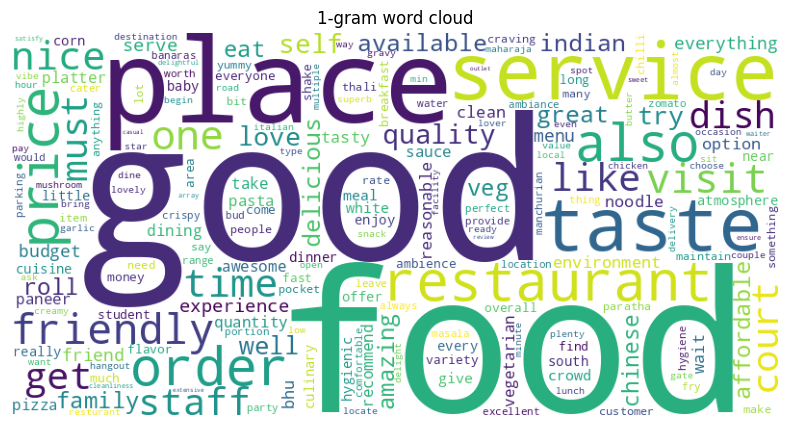

In [ ]:
create_wordcloud(unigram,'1-gram word cloud')

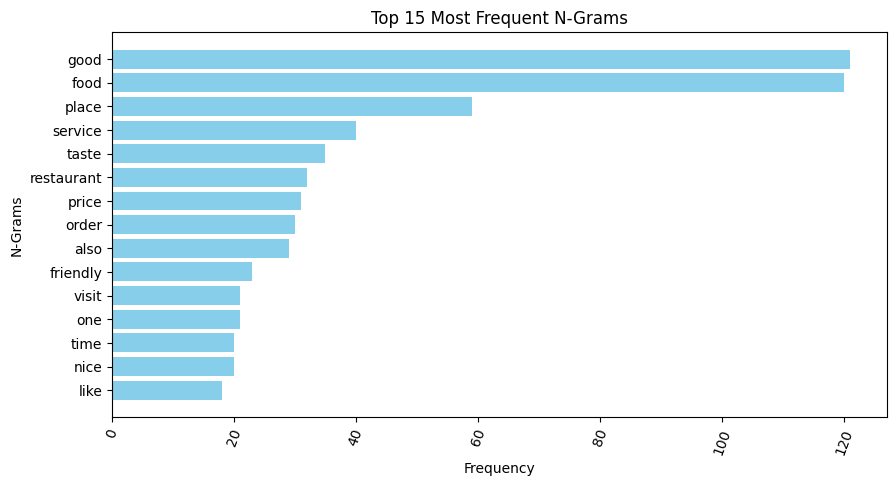

In [ ]:
frequency_plot(unigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


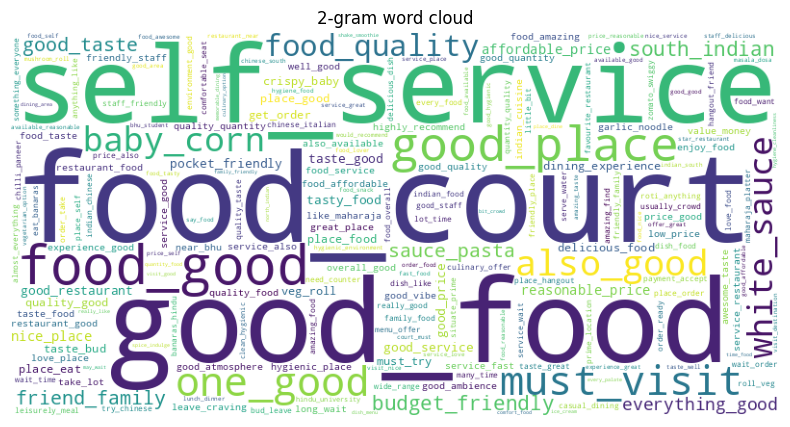

In [ ]:
create_wordcloud(bigram,'2-gram word cloud')

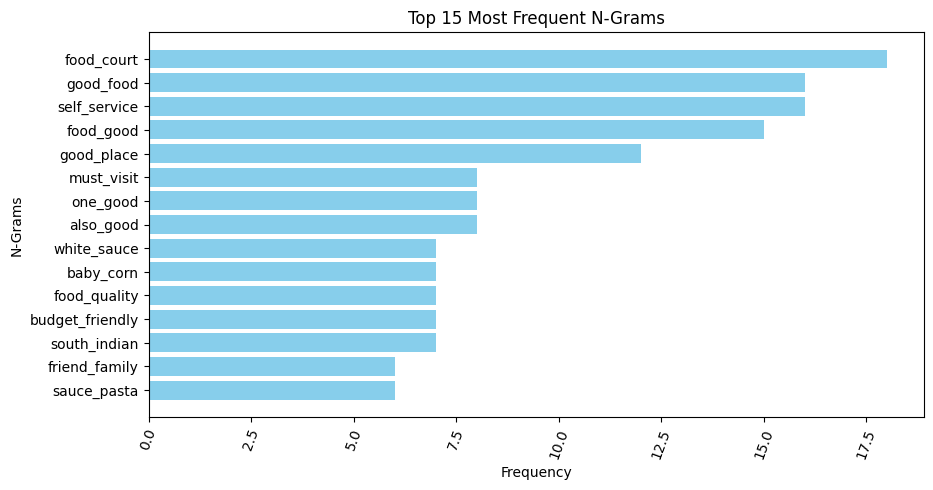

In [ ]:
frequency_plot(bigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


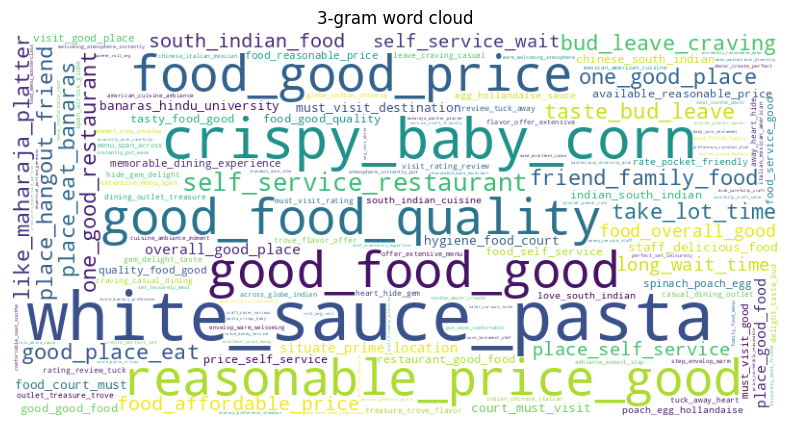

In [ ]:
create_wordcloud(trigram,'3-gram word cloud')

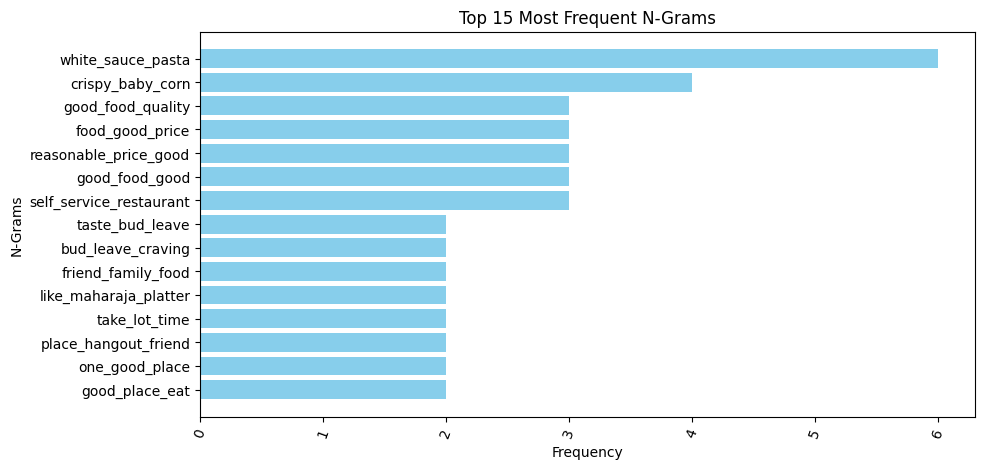

In [ ]:
frequency_plot(trigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


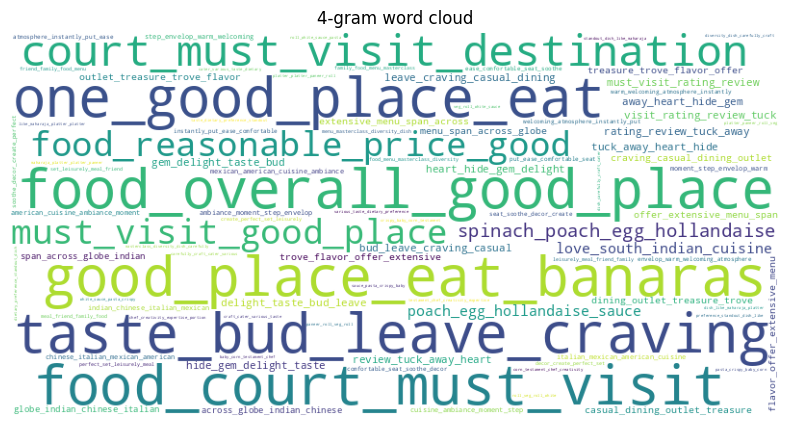

In [ ]:
create_wordcloud(fourgram,'4-gram word cloud')

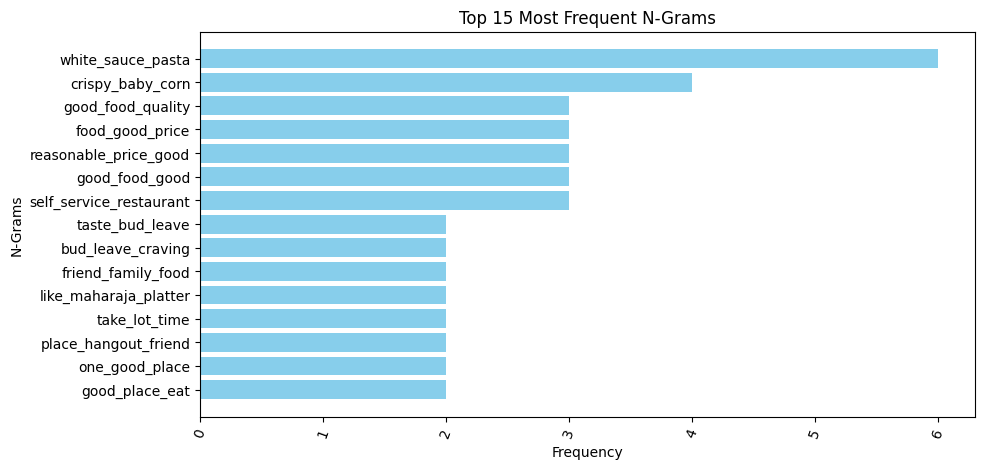

In [ ]:
frequency_plot(trigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
allgram= unigram+bigram+trigram+fourgram

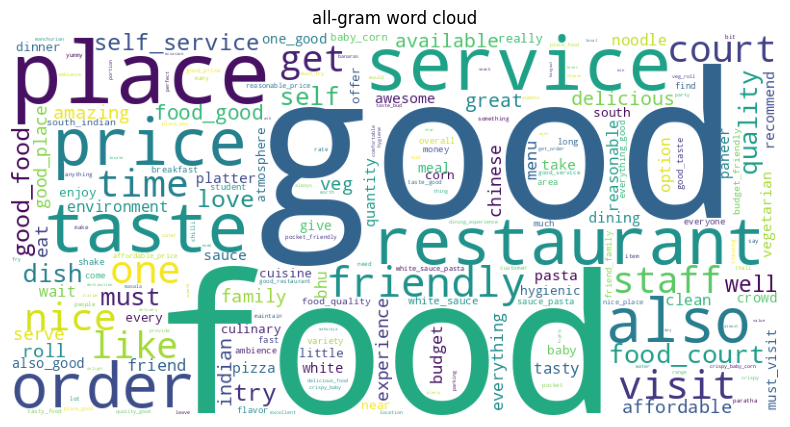

In [ ]:
create_wordcloud(allgram,'all-gram word cloud')

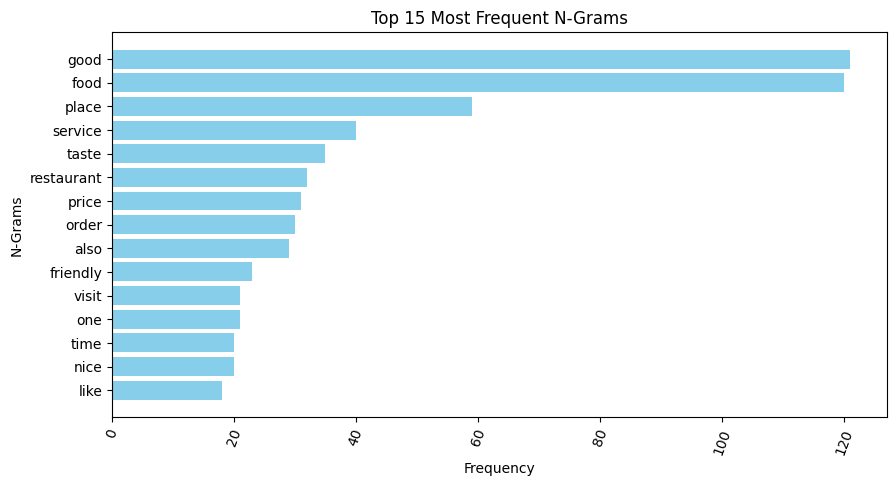

In [ ]:
frequency_plot(allgram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Performing LDA

In [ ]:
# Gensim
!pip install gensim
!pip install spacy

import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import  simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

In [ ]:
result

'must visit rating review tuck away heart hide gem delight taste bud leave craving casual dining outlet treasure trove flavor offer extensive menu span across globe indian chinese italian mexican american cuisine ambiance moment step envelop warm welcoming atmosphere instantly put ease comfortable seat soothe decor create perfect set leisurely meal friend family food menu masterclass diversity dish carefully craft cater various taste dietary preference standout dish like maharaja platter platter paneer roll veg roll white sauce pasta crispy baby corn testament chef creativity expertise portion generous price incredibly reasonable make excellent value money service staff friendly attentive knowledgeable ensuring dining experience seamless enjoyable take time explain menu offer recommendation cater special request smile additional highlight vegetarian vegan option available catering service special occasion digital payment accept average cost rupee two people approx conclusion culinary o

In [ ]:
#converting string into list
def convert(string):
    li = list(string.split(" "))
    return li

text_final=convert(result)

In [ ]:
text_final

['must',
 'visit',
 'rating',
 'review',
 'tuck',
 'away',
 'heart',
 'hide',
 'gem',
 'delight',
 'taste',
 'bud',
 'leave',
 'craving',
 'casual',
 'dining',
 'outlet',
 'treasure',
 'trove',
 'flavor',
 'offer',
 'extensive',
 'menu',
 'span',
 'across',
 'globe',
 'indian',
 'chinese',
 'italian',
 'mexican',
 'american',
 'cuisine',
 'ambiance',
 'moment',
 'step',
 'envelop',
 'warm',
 'welcoming',
 'atmosphere',
 'instantly',
 'put',
 'ease',
 'comfortable',
 'seat',
 'soothe',
 'decor',
 'create',
 'perfect',
 'set',
 'leisurely',
 'meal',
 'friend',
 'family',
 'food',
 'menu',
 'masterclass',
 'diversity',
 'dish',
 'carefully',
 'craft',
 'cater',
 'various',
 'taste',
 'dietary',
 'preference',
 'standout',
 'dish',
 'like',
 'maharaja',
 'platter',
 'platter',
 'paneer',
 'roll',
 'veg',
 'roll',
 'white',
 'sauce',
 'pasta',
 'crispy',
 'baby',
 'corn',
 'testament',
 'chef',
 'creativity',
 'expertise',
 'portion',
 'generous',
 'price',
 'incredibly',
 'reasonable',
 'm

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text.lower()) for text in text_final]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]


[(0,
  '0.057*"also" + 0.042*"love" + 0.033*"great" + 0.022*"everything" + '
  '0.021*"lot" + 0.018*"clean" + 0.017*"quality" + 0.017*"quantity" + '
  '0.015*"shake" + 0.015*"wait"'),
 (1,
  '0.142*"food" + 0.103*"place" + 0.044*"service" + 0.034*"visit" + '
  '0.034*"staff" + 0.025*"family" + 0.024*"budget" + 0.019*"indian" + '
  '0.016*"friend" + 0.015*"court"'),
 (2,
  '0.062*"nice" + 0.061*"taste" + 0.041*"price" + 0.036*"well" + '
  '0.035*"environment" + 0.033*"serve" + 0.025*"self" + 0.024*"order" + '
  '0.022*"hygienic" + 0.021*"near"'),
 (3,
  '0.142*"good" + 0.043*"friendly" + 0.043*"restaurant" + 0.038*"time" + '
  '0.024*"eat" + 0.022*"crowd" + 0.019*"one" + 0.019*"take" + 0.017*"get" + '
  '0.015*"resturant"')]


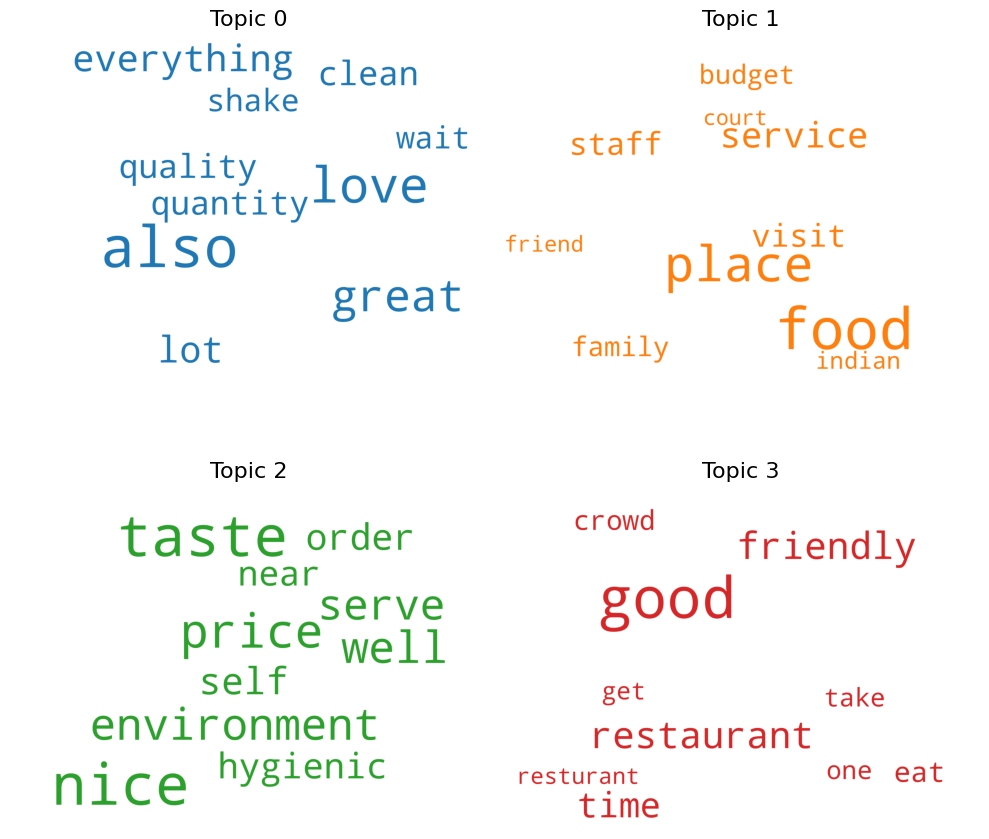

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=None,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
def generate_ngrams_lda(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return n_grams


In [ ]:
bigram_words_lda=generate_ngrams_lda(result,2)

In [ ]:
bigram_words_lda

['must_visit',
 'visit_rating',
 'rating_review',
 'review_tuck',
 'tuck_away',
 'away_heart',
 'heart_hide',
 'hide_gem',
 'gem_delight',
 'delight_taste',
 'taste_bud',
 'bud_leave',
 'leave_craving',
 'craving_casual',
 'casual_dining',
 'dining_outlet',
 'outlet_treasure',
 'treasure_trove',
 'trove_flavor',
 'flavor_offer',
 'offer_extensive',
 'extensive_menu',
 'menu_span',
 'span_across',
 'across_globe',
 'globe_indian',
 'indian_chinese',
 'chinese_italian',
 'italian_mexican',
 'mexican_american',
 'american_cuisine',
 'cuisine_ambiance',
 'ambiance_moment',
 'moment_step',
 'step_envelop',
 'envelop_warm',
 'warm_welcoming',
 'welcoming_atmosphere',
 'atmosphere_instantly',
 'instantly_put',
 'put_ease',
 'ease_comfortable',
 'comfortable_seat',
 'seat_soothe',
 'soothe_decor',
 'decor_create',
 'create_perfect',
 'perfect_set',
 'set_leisurely',
 'leisurely_meal',
 'meal_friend',
 'friend_family',
 'family_food',
 'food_menu',
 'menu_masterclass',
 'masterclass_diversity',

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in bigram_words_lda]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_bigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_bigram.print_topics())
doc_lda_bigram = lda_model_bigram[corpus]


[(0,
  '0.016*"food_good" + 0.014*"budget_friendly" + 0.011*"food_court" + '
  '0.004*"also_good" + 0.004*"also_well" + 0.004*"food_staff" + '
  '0.003*"one_good" + 0.003*"bestt_osm" + 0.003*"mannere_taste" + '
  '0.003*"osm_yammi"'),
 (1,
  '0.017*"self_service" + 0.014*"place_eat" + 0.010*"good_place" + '
  '0.010*"south_indian" + 0.008*"friend_family" + 0.005*"baby_corn" + '
  '0.004*"good_price" + 0.003*"also_well" + 0.003*"food_staff" + '
  '0.003*"good_restaurant"'),
 (2,
  '0.012*"good_food" + 0.006*"take_lot" + 0.006*"food_quality" + '
  '0.005*"hygienic_place" + 0.005*"everything_good" + 0.005*"nice_place" + '
  '0.004*"reasonable_price" + 0.004*"also_well" + 0.004*"food_staff" + '
  '0.004*"lot_time"'),
 (3,
  '0.005*"place_good" + 0.005*"hygienic_place" + 0.004*"good_taste" + '
  '0.004*"food_staff" + 0.004*"also_well" + 0.004*"friendly_staff" + '
  '0.004*"usually_crowd" + 0.003*"friendly_lovely" + 0.003*"lovely_food" + '
  '0.003*"environment_budget"')]


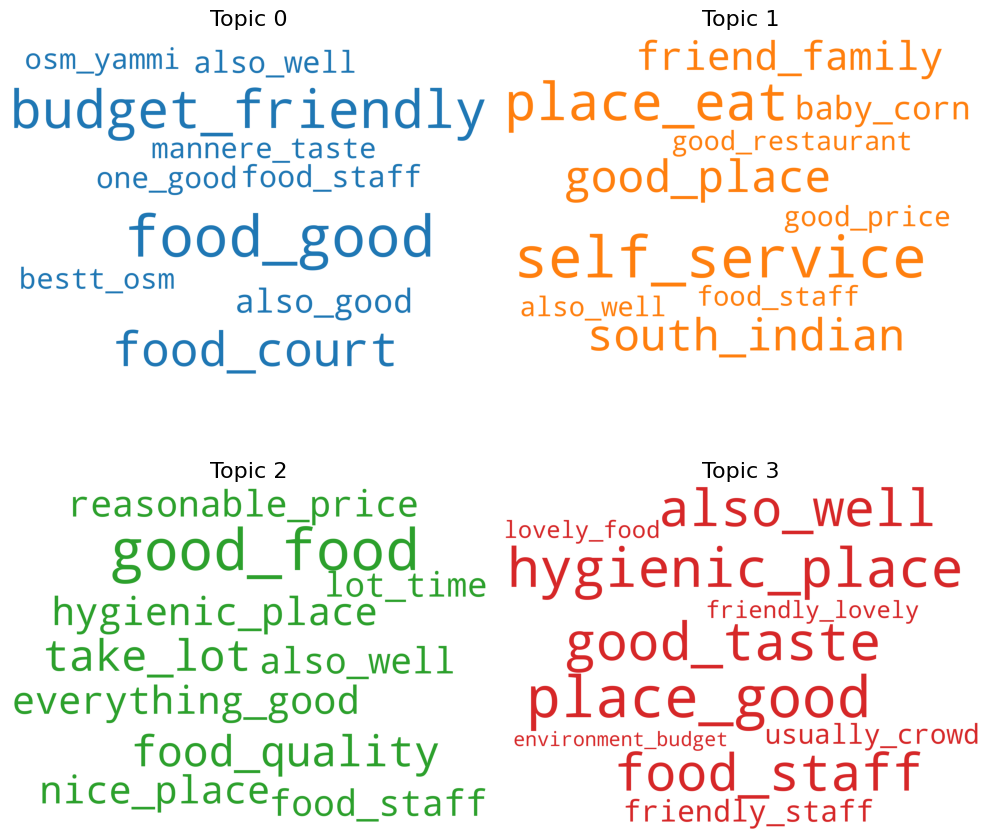

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=None,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model_bigram.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
trigram_words_lda=generate_ngrams_lda(result,3)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in trigram_words_lda]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_trigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_trigram.print_topics())
doc_lda_trigram = lda_model_trigram[corpus]


[(0,
  '0.003*"take_lot_time" + 0.003*"friendly_lovely_food" + '
  '0.003*"resturant_nice_nic" + 0.003*"serve_usually_crowd" + '
  '0.003*"restaurant_bestt_osm" + 0.003*"great_visit_near" + '
  '0.003*"yammi_nice_resturant" + 0.003*"crowd_restaurant_bestt" + '
  '0.003*"place_eat_food" + 0.003*"mannere_taste_great"'),
 (1,
  '0.003*"environment_budget_friendly" + 0.003*"good_environment_budget" + '
  '0.003*"taste_hygienic_place" + 0.003*"near_take_lot" + '
  '0.003*"mannere_taste_great" + 0.003*"eat_food_staff" + '
  '0.003*"also_well_mannere" + 0.003*"lovely_food_lovely" + '
  '0.003*"taste_great_visit" + 0.003*"great_visit_near"'),
 (2,
  '0.003*"lovely_taste_hygienic" + 0.003*"nice_resturant_nice" + '
  '0.003*"environment_budget_friendly" + 0.003*"taste_hygienic_place" + '
  '0.003*"resturant_nice_nic" + 0.003*"member_also_well" + '
  '0.003*"bestt_osm_yammi" + 0.003*"near_take_lot" + 0.003*"food_lovely_taste" '
  '+ 0.003*"eat_food_staff"'),
 (3,
  '0.003*"well_mannere_taste" + 0

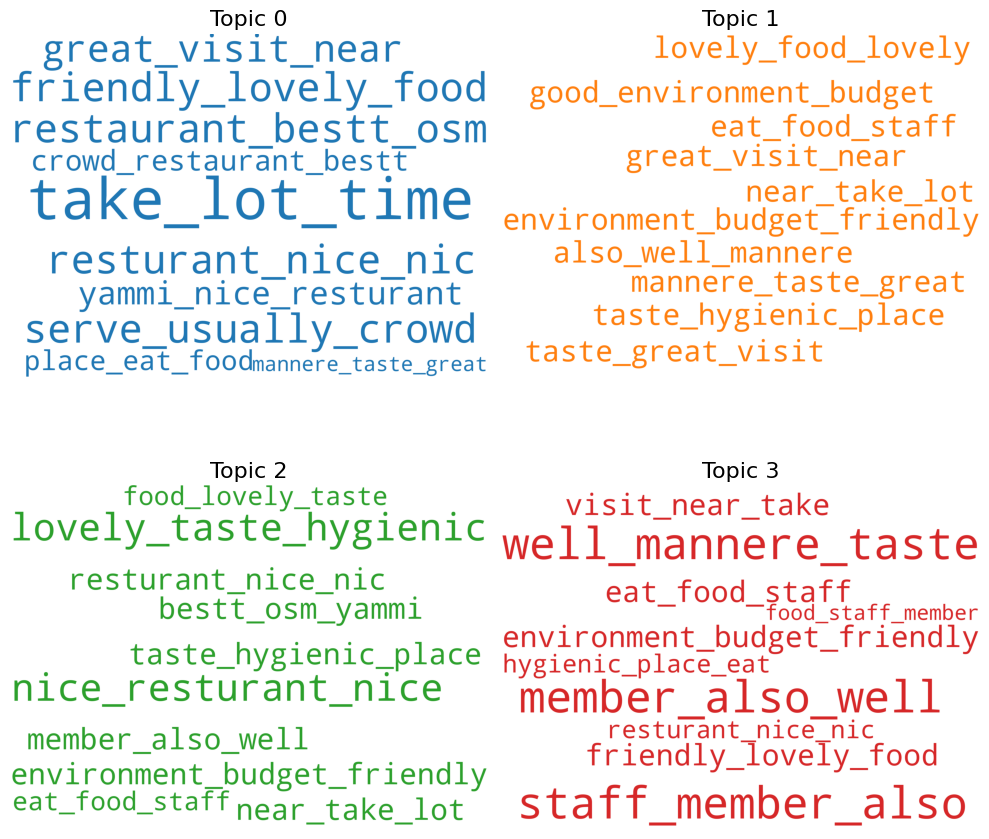

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=None,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model_trigram.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model_trigram, corpus, dictionary=lda_model_trigram.id2word)
vis

NameError: name 'pyLDAvis' is not defined

In [ ]:
fourgram_words_lda=generate_ngrams_lda(result,4)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in fourgram_words_lda]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_fourgram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_fourgram.print_topics())
doc_lda_fourgram = lda_model_fourgram[corpus]


[(0,
  '0.003*"serve_usually_crowd_restaurant" + 0.003*"osm_yammi_nice_resturant" + '
  '0.003*"friendly_lovely_food_lovely" + 0.003*"food_lovely_taste_hygienic" + '
  '0.003*"great_visit_near_take" + 0.003*"good_environment_budget_friendly" + '
  '0.003*"well_mannere_taste_great" + 0.003*"budget_friendly_lovely_food" + '
  '0.003*"nice_resturant_nice_nic" + 0.003*"time_serve_usually_crowd"'),
 (1,
  '0.003*"friendly_lovely_food_lovely" + 0.003*"mannere_taste_great_visit" + '
  '0.003*"take_lot_time_serve" + 0.003*"usually_crowd_restaurant_bestt" + '
  '0.003*"place_eat_food_staff" + 0.003*"budget_friendly_lovely_food" + '
  '0.003*"lovely_food_lovely_taste" + 0.003*"staff_member_also_well" + '
  '0.003*"bestt_osm_yammi_nice" + 0.003*"hygienic_place_eat_food"'),
 (2,
  '0.003*"lot_time_serve_usually" + 0.003*"environment_budget_friendly_lovely" '
  '+ 0.003*"food_staff_member_also" + 0.003*"place_eat_food_staff" + '
  '0.003*"food_lovely_taste_hygienic" + '
  '0.003*"good_environment_b

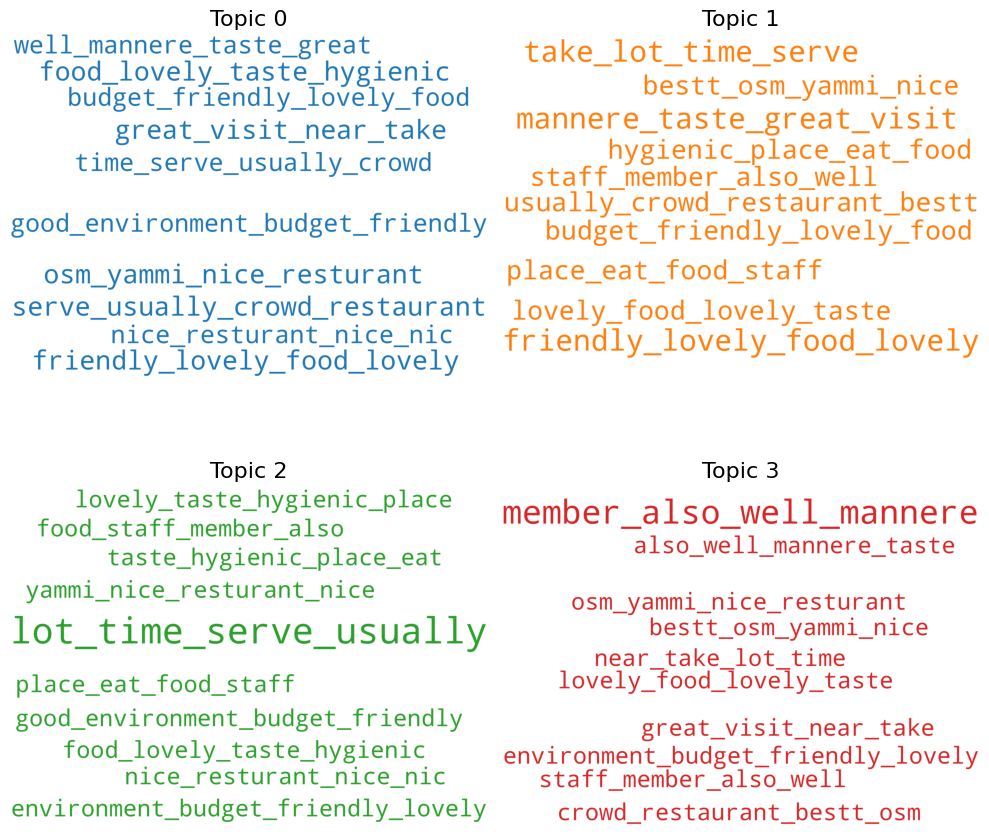

In [ ]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=None,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model_fourgram.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
!pip install pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 40.7 MB/s eta 0:00:00


In [ ]:
import pyLDAvis.gensim


In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model_fourgram, corpus, dictionary=lda_model_fourgram.id2word)
vis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
1     -0.000422  0.0       1        1  30.116974
0      0.000040 -0.0       2        1  23.955372
2      0.000042  0.0       3        1  23.922403
3      0.000339 -0.0       4        1  22.005252, topic_info=                                    Term      Freq     Total Category  \
2502            member_also_well_mannere  8.000000  8.000000  Default   
2494          food_lovely_taste_hygienic  8.000000  8.000000  Default   
2511              lot_time_serve_usually  8.000000  8.000000  Default   
2490  environment_budget_friendly_lovely  8.000000  8.000000  Default   
2507               great_visit_near_take  8.000000  8.000000  Default   
...                                  ...       ...       ...      ...   
2520             nice_resturant_nice_nic  1.735949  8.252904   Topic4   
2498                place_eat_food_staff  1.735935  8.252932   Topic4   
2500              food_staff_member_also  1.735924  8.252921   Topic4   
2519           yammi_nice_resturant_nice  1.735882  8.252931   Topic4   
2492         friendly_lovely_food_lovely  1.735791  8.252976   Topic4   

      logprob  loglift  
2502  30.0000  30.0000  
2494  29.0000  29.0000  
2511  28.0000  28.0000  
2490  27.0000  27.0000  
2507  26.0000  26.0000  
...       ...      ...  
2520  -5.7713  -0.0451  
2498  -5.7713  -0.0451  
2500  -5.7713  -0.0451  
2519  -5.7714  -0.0452  
2492  -5.7714  -0.0452  

[251 rows x 6 columns], token_table=      Topic      Freq                       Term
term                                            
2503      1  0.363509    also_well_mannere_taste
2503      2  0.242339    also_well_mannere_taste
2503      3  0.242339    also_well_mannere_taste
2503      4  0.242339    also_well_mannere_taste
2517      1  0.363508       bestt_osm_yammi_nice
...     ...       ...                        ...
2504      4  0.242338   well_mannere_taste_great
2519      1  0.363507  yammi_nice_resturant_nice
2519      2  0.242338  yammi_nice_resturant_nice
2519      3  0.242338  yammi_nice_resturant_nice
2519      4  0.242338  yammi_nice_resturant_nice

[137 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3, 4])

# 4 star

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
mask1=df['rating']==4
mask1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,rating
0,False
1,False
2,False
3,False
4,False
...,...
457,True
484,False
491,False
568,False


In [ ]:
mask2 =~df['user_text'].isnull()
mask2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,user_text
0,True
1,True
2,True
3,True
4,True
...,...
457,True
484,True
491,True
568,True


In [ ]:
joined_text1 =' '.join(df['cleaned1'][mask1 & mask2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
joined_text1_NORMAL =' '.join(df['cleaned'][mask1 & mask2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
joined_text1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'overall   experience   good food   also delicious tasty well   bdy celebration   try   cheese dosa   mysore rawa dosa    taste    good staff behaviour   also good   try kheer also    go two person   dinner   expense   least    cheap price sone item   costly   ordering would   wait miniute environment   good food delicious   well serve like   packaging    helpful   liberal     takeaway   offer quantity   quality maximum since every food item serve large quantity sometimes get difficult finish       offer wrap   leftover food    take   home without charge   extra cost ambience little crowd   need little clean   hygienic good restaurant   self service restaurant mean    pick   order    counter   food quality good   guess service cab become   well taste   good yummy delicious   service system   lazy    one thing first   order    take atleast min waste time otherwise proper hygienic place   good food   also affordable price   good place   meal shake etc near lanka chauraha     literally ma

In [ ]:
print(joined_text1_NORMAL)

overall the experience is very good nd food are also delicious nd tasty better for bdy celebration  i have tried here cheese dosa and mysore rawa dosa  both of the taste was too good  staff behaviour was also good  and tried kheer also  if you are going two persons for dinner then expense will be 400 at least  not very cheap price  sone items is very costly  after ordering u would have to wait 20 30 miniutes  environment is too good food is delicious and well served  i liked their packaging and how helpful and liberal they are with takeaway  they offer quantity and quality to maximum  since every food item served in a large quantity it sometimes gets difficult to finish it all  for that too they offer to wrap the leftover food for you to take it your home without charging any extra cost  ambience is little crowded and needs to be little clean and hygienic it is a good restaurant but it is a self service restaurant means you have to pick your order from the counter   the food quality is

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
len(joined_text1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


15267

In [ ]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# Tokenizing the text
tokens = word_tokenize(joined_text1)
print(tokens)

['overall', 'experience', 'good', 'food', 'also', 'delicious', 'tasty', 'well', 'bdy', 'celebration', 'try', 'cheese', 'dosa', 'mysore', 'rawa', 'dosa', 'taste', 'good', 'staff', 'behaviour', 'also', 'good', 'try', 'kheer', 'also', 'go', 'two', 'person', 'dinner', 'expense', 'least', 'cheap', 'price', 'sone', 'item', 'costly', 'ordering', 'would', 'wait', 'miniute', 'environment', 'good', 'food', 'delicious', 'well', 'serve', 'like', 'packaging', 'helpful', 'liberal', 'takeaway', 'offer', 'quantity', 'quality', 'maximum', 'since', 'every', 'food', 'item', 'serve', 'large', 'quantity', 'sometimes', 'get', 'difficult', 'finish', 'offer', 'wrap', 'leftover', 'food', 'take', 'home', 'without', 'charge', 'extra', 'cost', 'ambience', 'little', 'crowd', 'need', 'little', 'clean', 'hygienic', 'good', 'restaurant', 'self', 'service', 'restaurant', 'mean', 'pick', 'order', 'counter', 'food', 'quality', 'good', 'guess', 'service', 'cab', 'become', 'well', 'taste', 'good', 'yummy', 'delicious', 's

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
freq=nltk.FreqDist(tokens)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
most_common=freq.most_common(100)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
most_common

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[('good', 126),
 ('food', 108),
 ('place', 55),
 ('service', 47),
 ('price', 35),
 ('also', 30),
 ('restaurant', 27),
 ('taste', 26),
 ('order', 26),
 ('quality', 24),
 ('family', 24),
 ('self', 23),
 ('time', 20),
 ('like', 19),
 ('one', 18),
 ('nice', 17),
 ('tasty', 16),
 ('affordable', 16),
 ('friendly', 16),
 ('delicious', 15),
 ('wait', 15),
 ('student', 15),
 ('get', 14),
 ('take', 14),
 ('bhu', 14),
 ('visit', 14),
 ('well', 13),
 ('crowd', 13),
 ('veg', 13),
 ('friend', 13),
 ('try', 12),
 ('serve', 12),
 ('great', 12),
 ('overall', 11),
 ('quantity', 11),
 ('cheese', 10),
 ('thing', 10),
 ('budget', 10),
 ('experience', 9),
 ('staff', 9),
 ('ambience', 9),
 ('meal', 9),
 ('lanka', 9),
 ('really', 9),
 ('must', 9),
 ('chinese', 8),
 ('even', 8),
 ('capsicum', 8),
 ('court', 8),
 ('variety', 8),
 ('paneer', 8),
 ('hour', 8),
 ('pizza', 8),
 ('offer', 7),
 ('reasonable', 7),
 ('different', 7),
 ('varanasi', 7),
 ('cuisine', 7),
 ('bit', 7),
 ('slow', 7),
 ('always', 7),
 ('veget

In [ ]:
reg=re.compile(r'capsicum|varanasi|lanka')
working_text=reg.sub('',joined_text1)

print(working_text)

overall   experience   good food   also delicious tasty well   bdy celebration   try   cheese dosa   mysore rawa dosa    taste    good staff behaviour   also good   try kheer also    go two person   dinner   expense   least    cheap price sone item   costly   ordering would   wait miniute environment   good food delicious   well serve like   packaging    helpful   liberal     takeaway   offer quantity   quality maximum since every food item serve large quantity sometimes get difficult finish       offer wrap   leftover food    take   home without charge   extra cost ambience little crowd   need little clean   hygienic good restaurant   self service restaurant mean    pick   order    counter   food quality good   guess service cab become   well taste   good yummy delicious   service system   lazy    one thing first   order    take atleast min waste time otherwise proper hygienic place   good food   also affordable price   good place   meal shake etc near  chauraha     literally maintain

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Remove single-character words
result = re.sub(r'\b\w\b', '', working_text)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result = re.sub(r'\s+', ' ', result).strip()



print(result)

overall experience good food also delicious tasty well bdy celebration try cheese dosa mysore rawa dosa taste good staff behaviour also good try kheer also two person dinner expense least cheap price sone item costly ordering would wait miniute environment good food delicious well serve like packaging helpful liberal takeaway offer quantity quality maximum since every food item serve large quantity sometimes get difficult finish offer wrap leftover food take home without charge extra cost ambience little crowd need little clean hygienic good restaurant self service restaurant mean pick order counter food quality good guess service cab become well taste good yummy delicious service system lazy one thing first order take atleast min waste time otherwise proper hygienic place good food also affordable price good place meal shake etc near chauraha literally maintain quality food north indian chinese quite nice even coffee really appreciable price reasonable staff polite definitely place co

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
!pip install wordcloud
from wordcloud import WordCloud

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from collections import Counter
from nltk import ngrams
from wordcloud import WordCloud
import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def generate_ngrams(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return Counter(n_grams)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def frequency_plot(ngram_freq,top_n):
    common_ngrams = ngram_freq.most_common(top_n)

    # Separate the n-grams and their frequencies for plotting
    ngrams, frequencies = zip(*common_ngrams)

    # Plotting the frequency graph
    plt.figure(figsize=(10, 5))
    plt.barh(ngrams, frequencies, color='skyblue')
    plt.xlabel('Frequency')
    plt.ylabel('N-Grams')
    plt.xticks(rotation=70)
    plt.title(f'Top {top_n} Most Frequent N-Grams')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most frequent at the top
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
unigram=generate_ngrams(result,1)
for i,j in unigram.items():
    print(i,":",j)
    print("\n")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


overall : 11


experience : 9


good : 126


food : 108


also : 30


delicious : 15


tasty : 16


well : 13


bdy : 1


celebration : 2


try : 12


cheese : 10


dosa : 4


mysore : 1


rawa : 1


taste : 26


staff : 9


behaviour : 3


kheer : 1


two : 2


person : 4


dinner : 3


expense : 1


least : 3


cheap : 3


price : 35


sone : 1


item : 4


costly : 3


ordering : 1


would : 2


wait : 15


miniute : 1


environment : 2


serve : 12


like : 19


packaging : 1


helpful : 2


liberal : 1


takeaway : 1


offer : 7


quantity : 11


quality : 24


maximum : 1


since : 2


every : 3


large : 2


sometimes : 5


get : 14


difficult : 1


finish : 1


wrap : 1


leftover : 1


take : 14


home : 2


without : 2


charge : 3


extra : 3


cost : 2


ambience : 9


little : 5


crowd : 13


need : 4


clean : 4


hygienic : 3


restaurant : 27


self : 23


service : 47


mean : 2


pick : 1


order : 26


counter : 6


guess : 1


cab : 1


become : 1


yummy : 1


sy

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
bigram=generate_ngrams(result,2)
for i,j in bigram.items():
    print(i,":",j)
    print("\n")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Streaming output truncated to the last 5000 lines.


least_cheap : 1


cheap_price : 1


price_sone : 1


sone_item : 1


item_costly : 1


costly_ordering : 1


ordering_would : 1


would_wait : 1


wait_miniute : 1


miniute_environment : 1


environment_good : 1


food_delicious : 3


delicious_well : 1


well_serve : 1


serve_like : 1


like_packaging : 1


packaging_helpful : 1


helpful_liberal : 1


liberal_takeaway : 1


takeaway_offer : 1


offer_quantity : 1


quantity_quality : 2


quality_maximum : 1


maximum_since : 1


since_every : 1


every_food : 1


food_item : 1


item_serve : 1


serve_large : 1


large_quantity : 1


quantity_sometimes : 1


sometimes_get : 1


get_difficult : 1


difficult_finish : 1


finish_offer : 1


offer_wrap : 1


wrap_leftover : 1


leftover_food : 1


food_take : 2


take_home : 1


home_without : 1


without_charge : 1


charge_extra : 1


extra_cost : 1


cost_ambience : 1


ambience_little : 1


little_crowd : 1


crowd_need : 1


ne

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
trigram=generate_ngrams(result,3)
for i,j in trigram.items():
    print(i,":",j)
    print("\n")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Streaming output truncated to the last 5000 lines.


price_wise_cool : 1


wise_cool_stuff : 1


cool_stuff_affordable : 1


stuff_affordable_food : 1


affordable_food_quality : 1


food_quality_great : 1


quality_great_recommend : 1


great_recommend_side : 1


recommend_side_patient : 1


side_patient_place : 1


patient_place_good : 1


place_good_mean : 1


good_mean_girl : 1


mean_girl_night : 1


girl_night_without : 1


night_without_prblm : 1


without_prblm_place : 1


prblm_place_full : 1


place_full_family : 1


full_family_friend : 1


family_friend_think : 1


friend_think_bit : 1


think_bit_expensive : 1


bit_expensive_though : 1


expensive_though_order : 1


though_order_masala : 1


order_masala_think : 1


masala_think_okish : 1


think_okish_thing : 1


okish_thing_order : 1


thing_order_tangy : 1


order_tangy_grill : 1


tangy_grill_cheese : 1


grill_cheese_sandwich : 1


cheese_sandwich_cost : 1


sandwich_cost_fill : 1


cost_fill_jalapeno : 1


fill_jala

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
fourgram=generate_ngrams(result,4)
for i,j in fourgram.items():
    print(i,":",j)
    print("\n")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Streaming output truncated to the last 5000 lines.


cheese_good_mohito_great : 1


good_mohito_great_ambience : 1


mohito_great_ambience_good : 1


great_ambience_good_hope : 1


ambience_good_hope_like : 1


good_hope_like_tasty : 1


hope_like_tasty_food : 1


like_tasty_food_staff : 1


tasty_food_staff_also : 1


food_staff_also_good : 1


staff_also_good_also : 1


also_good_also_pack : 1


good_also_pack_leave : 1


also_pack_leave_meal : 1


pack_leave_meal_good : 1


leave_meal_good_family : 1


meal_good_family_price : 1


good_family_price_affordable : 1


family_price_affordable_take : 1


price_affordable_take_time : 1


affordable_take_time_get : 1


take_time_get_food : 1


time_get_food_serve : 1


get_food_serve_experience : 1


food_serve_experience_quite : 1


serve_experience_quite_good : 1


experience_quite_good_food : 1


quite_good_food_affordable : 1


good_food_affordable_tasty : 1


food_affordable_tasty_veg : 1


affordable_tasty_veg_maharaja : 1


tasty_ve

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def create_wordcloud(ngrams_counts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(ngrams_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(title)
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


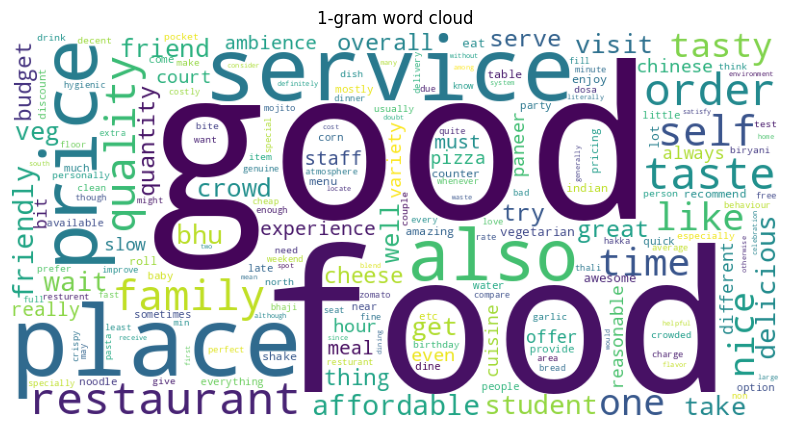

In [ ]:
create_wordcloud(unigram,'1-gram word cloud')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


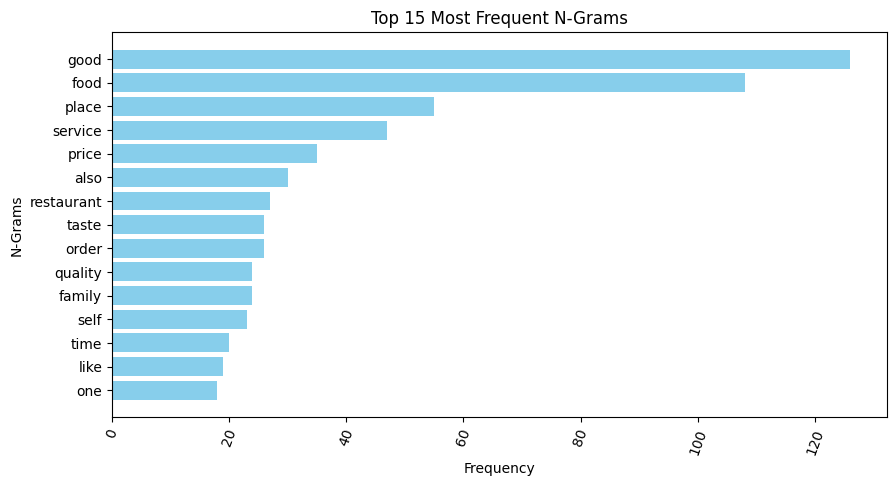

In [ ]:
frequency_plot(unigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


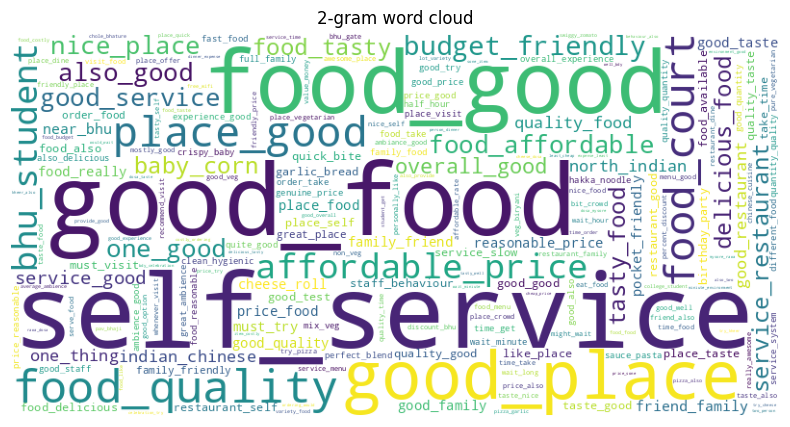

In [ ]:
create_wordcloud(bigram,'2-gram word cloud')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


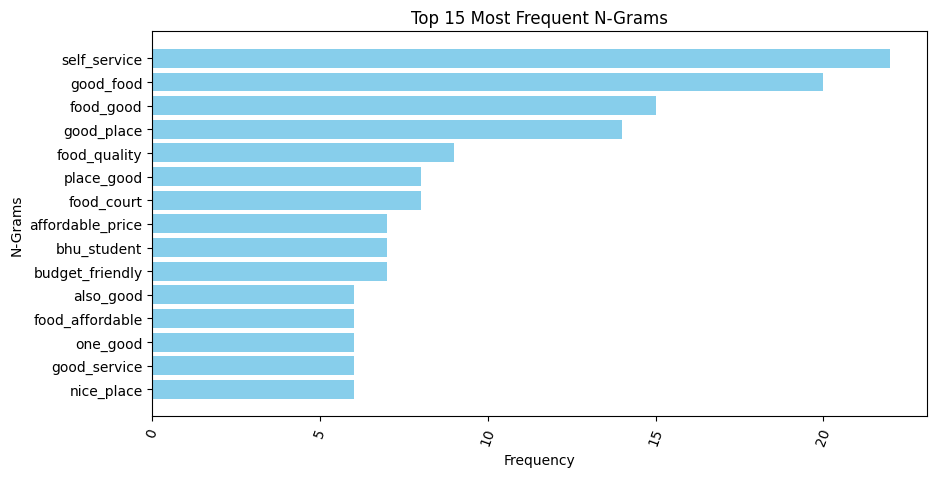

In [ ]:
frequency_plot(bigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


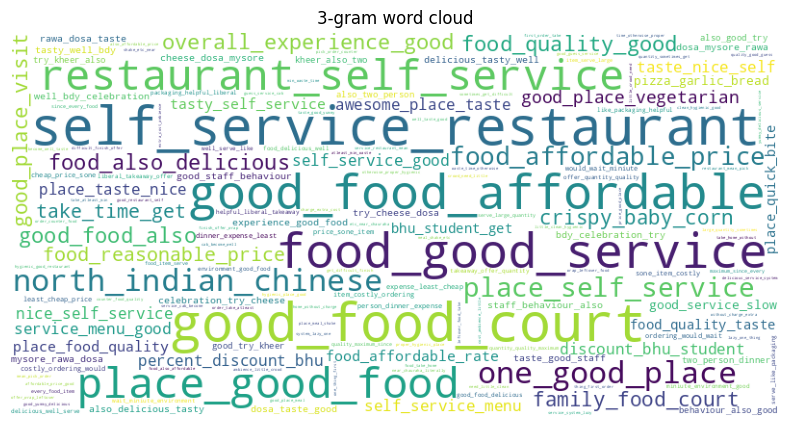

In [ ]:
create_wordcloud(trigram,'3-gram word cloud')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


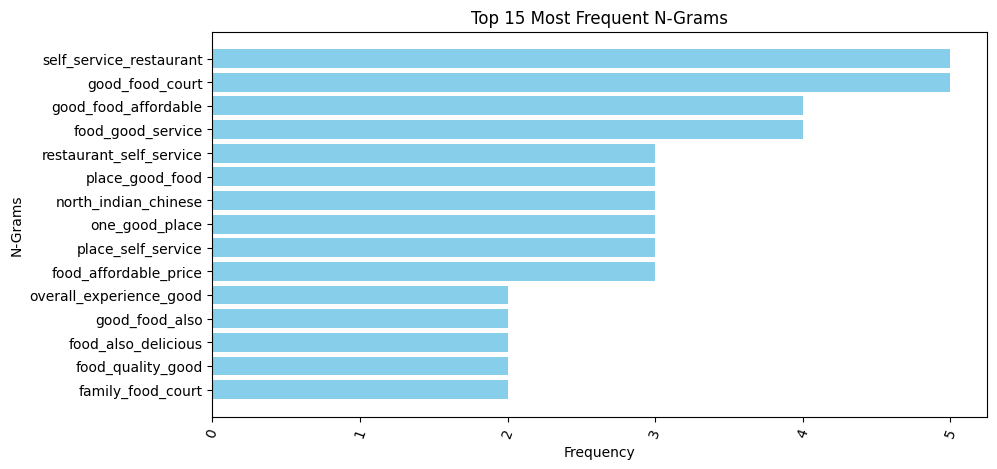

In [ ]:
frequency_plot(trigram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


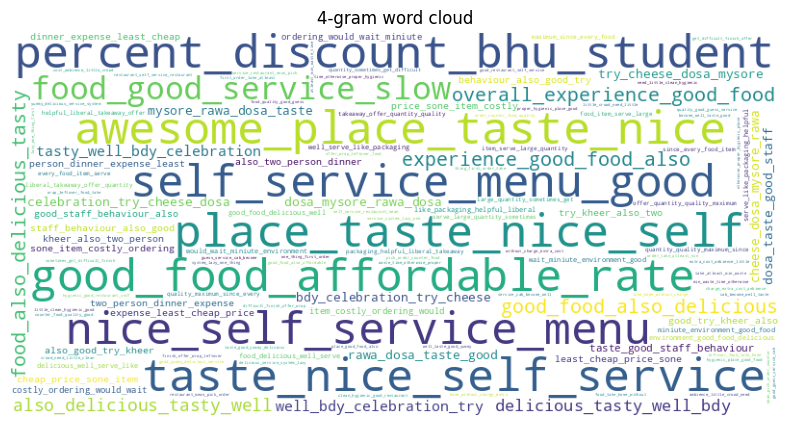

In [ ]:
create_wordcloud(fourgram,'4-gram word cloud')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


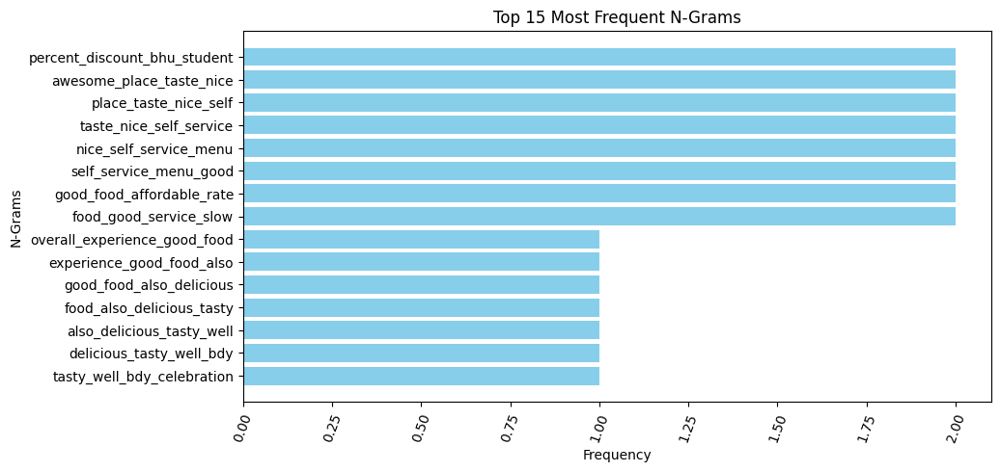

In [ ]:
frequency_plot(fourgram,15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
allgram= unigram+bigram+trigram+fourgram

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


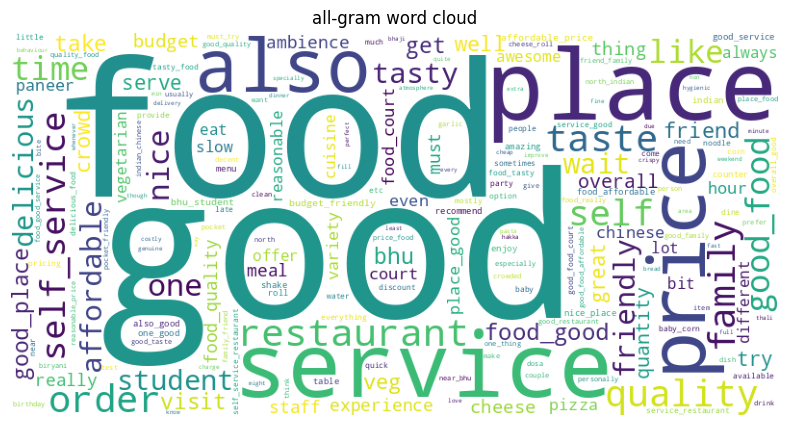

In [ ]:
create_wordcloud(allgram,'all-gram word cloud')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#LDA 4 star


In [ ]:

import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import  simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
joined_text1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'overall   experience   good food   also delicious tasty well   bdy celebration   try   cheese dosa   mysore rawa dosa    taste    good staff behaviour   also good   try kheer also    go two person   dinner   expense   least    cheap price sone item   costly   ordering would   wait miniute environment   good food delicious   well serve like   packaging    helpful   liberal     takeaway   offer quantity   quality maximum since every food item serve large quantity sometimes get difficult finish       offer wrap   leftover food    take   home without charge   extra cost ambience little crowd   need little clean   hygienic good restaurant   self service restaurant mean    pick   order    counter   food quality good   guess service cab become   well taste   good yummy delicious   service system   lazy    one thing first   order    take atleast min waste time otherwise proper hygienic place   good food   also affordable price   good place   meal shake etc near lanka chauraha     literally ma

In [ ]:
result = re.sub(r'\b\w\b', '', joined_text1)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result1 = re.sub(r'\s+', ' ', result).strip()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
#converting string into list
def convert(string):
    li = list(string.split(" "))
    return li

text_final=convert(result1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Step 1: Import necessary libraries


import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text.lower()) for text in text_final]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.225*"good" + 0.080*"service" + 0.050*"order" + 0.029*"tasty" + '
  '0.024*"quick" + 0.017*"much" + 0.016*"table" + 0.015*"quantity" + '
  '0.013*"especially" + 0.011*"pocket"'),
 (1,
  '0.213*"food" + 0.047*"also" + 0.027*"serve" + 0.025*"crowd" + 0.023*"get" + '
  '0.019*"pizza" + 0.017*"experience" + 0.016*"try" + 0.015*"available" + '
  '0.013*"ambience"'),
 (2,
  '0.075*"place" + 0.042*"one" + 0.038*"time" + 0.027*"nice" + 0.026*"quality" '
  '+ 0.026*"affordable" + 0.025*"take" + 0.021*"variety" + 0.018*"lot" + '
  '0.018*"delicious"'),
 (3,
  '0.066*"price" + 0.051*"taste" + 0.036*"friendly" + 0.034*"student" + '
  '0.031*"self" + 0.029*"like" + 0.026*"budget" + 0.025*"restaurant" + '
  '0.022*"well" + 0.020*"awesome"')]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


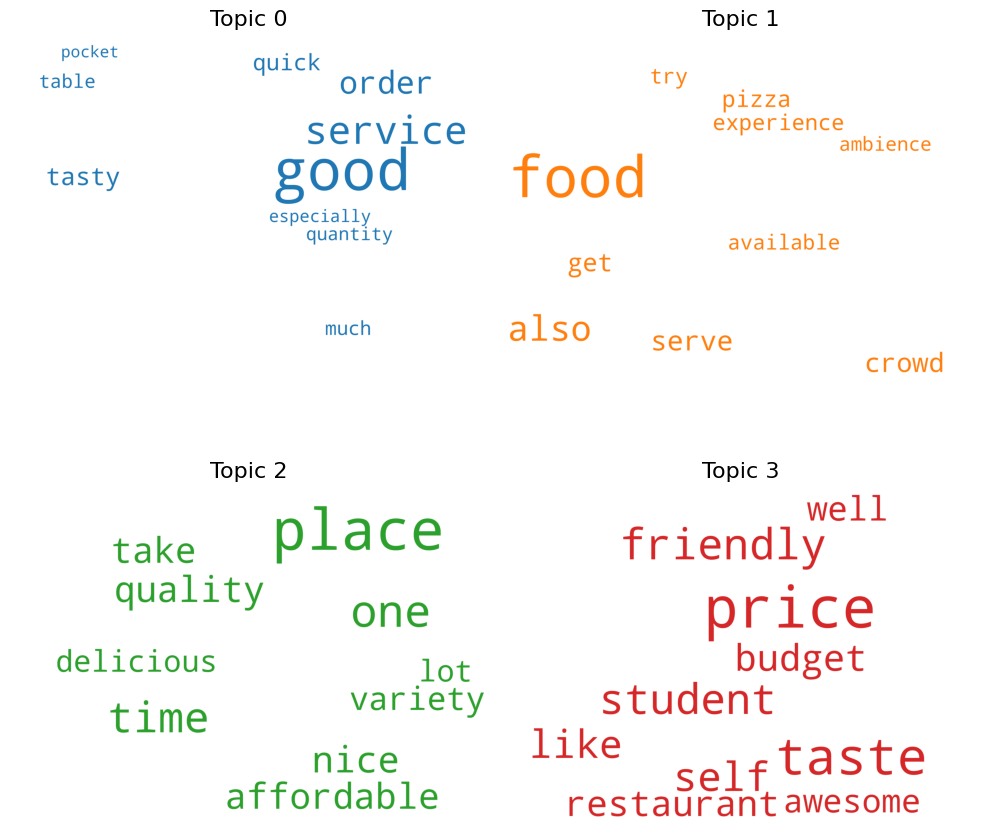

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
bigram_words_lda4=generate_ngrams_lda(result1,2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
bigram_words_lda4

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['overall_experience',
 'experience_good',
 'good_food',
 'food_also',
 'also_delicious',
 'delicious_tasty',
 'tasty_well',
 'well_bdy',
 'bdy_celebration',
 'celebration_try',
 'try_cheese',
 'cheese_dosa',
 'dosa_mysore',
 'mysore_rawa',
 'rawa_dosa',
 'dosa_taste',
 'taste_good',
 'good_staff',
 'staff_behaviour',
 'behaviour_also',
 'also_good',
 'good_try',
 'try_kheer',
 'kheer_also',
 'also_two',
 'two_person',
 'person_dinner',
 'dinner_expense',
 'expense_least',
 'least_cheap',
 'cheap_price',
 'price_sone',
 'sone_item',
 'item_costly',
 'costly_ordering',
 'ordering_would',
 'would_wait',
 'wait_miniute',
 'miniute_environment',
 'environment_good',
 'good_food',
 'food_delicious',
 'delicious_well',
 'well_serve',
 'serve_like',
 'like_packaging',
 'packaging_helpful',
 'helpful_liberal',
 'liberal_takeaway',
 'takeaway_offer',
 'offer_quantity',
 'quantity_quality',
 'quality_maximum',
 'maximum_since',
 'since_every',
 'every_food',
 'food_item',
 'item_serve',
 'serve_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in bigram_words_lda4]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_bigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_bigram.print_topics())
doc_lda_bigram = lda_model_bigram[corpus]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.031*"good_food" + 0.019*"self_service" + 0.013*"affordable_price" + '
  '0.005*"service_restaurant" + 0.003*"food_delicious" + '
  '0.002*"great_ambience" + 0.002*"service_time" + 0.002*"food_costly" + '
  '0.002*"order_food" + 0.002*"lot_variety"'),
 (1,
  '0.013*"food_affordable" + 0.007*"food_tasty" + 0.007*"tasty_food" + '
  '0.006*"good_good" + 0.003*"also_good" + 0.002*"baby_corn" + '
  '0.002*"service_time" + 0.002*"garlic_bread" + 0.002*"food_costly" + '
  '0.002*"variety_food"'),
 (2,
  '0.017*"food_good" + 0.011*"good_service" + 0.009*"bhu_student" + '
  '0.008*"food_quality" + 0.007*"overall_good" + 0.006*"place_food" + '
  '0.005*"delicious_food" + 0.004*"place_taste" + 0.003*"price_food" + '
  '0.002*"service_time"'),
 (3,
  '0.018*"good_place" + 0.012*"one_good" + 0.010*"food_court" + '
  '0.008*"food_really" + 0.008*"budget_friendly" + 0.008*"place_good" + '
  '0.007*"quality_food" + 0.007*"nice_place" + 0.005*"pocket_friendly" + '
  '0.004*"take_time"')]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


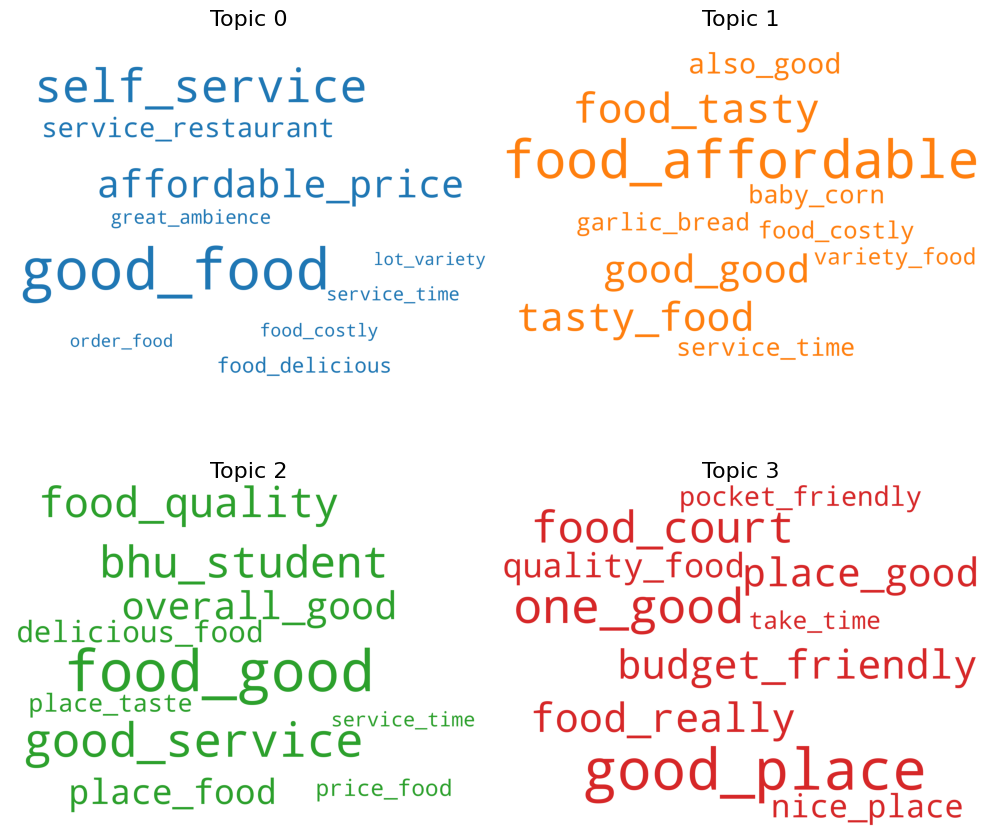

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_bigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

In [ ]:
trigram_words_lda4=generate_ngrams_lda(result1,3)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in trigram_words_lda4]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_trigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_trigram.print_topics())
doc_lda_trigram = lda_model_trigram[corpus]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.002*"good_food_court" + 0.002*"place_quick_bite" + '
  '0.002*"food_affordable_rate" + 0.002*"food_affordable_price" + '
  '0.002*"osm_taste_gud" + 0.002*"ambience_usually_take" + '
  '0.002*"awesome_service_time" + 0.002*"rest_room_product" + '
  '0.002*"great_ambience_usually" + 0.002*"reason_quality_cuisine"'),
 (1,
  '0.005*"self_service_restaurant" + 0.001*"usually_take_half" + '
  '0.001*"food_tasty_hygenic" + 0.001*"slow_place_great" + '
  '0.001*"really_awesome_service" + 0.001*"tasty_hygenic_fast" + '
  '0.001*"way_well_lot" + 0.001*"overall_good_place" + 0.001*"good_food_court" '
  '+ 0.001*"bit_crowd_obvious"'),
 (2,
  '0.002*"good_food_court" + 0.002*"place_quick_bite" + '
  '0.002*"food_affordable_rate" + 0.002*"food_affordable_price" + '
  '0.002*"room_product_good" + 0.002*"ambience_usually_take" + '
  '0.002*"take_much_time" + 0.002*"well_lot_parking" + '
  '0.002*"decent_price_tasty" + 0.002*"affordable_price_overall"'),
 (3,
  '0.009*"good_food_affordable" +

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


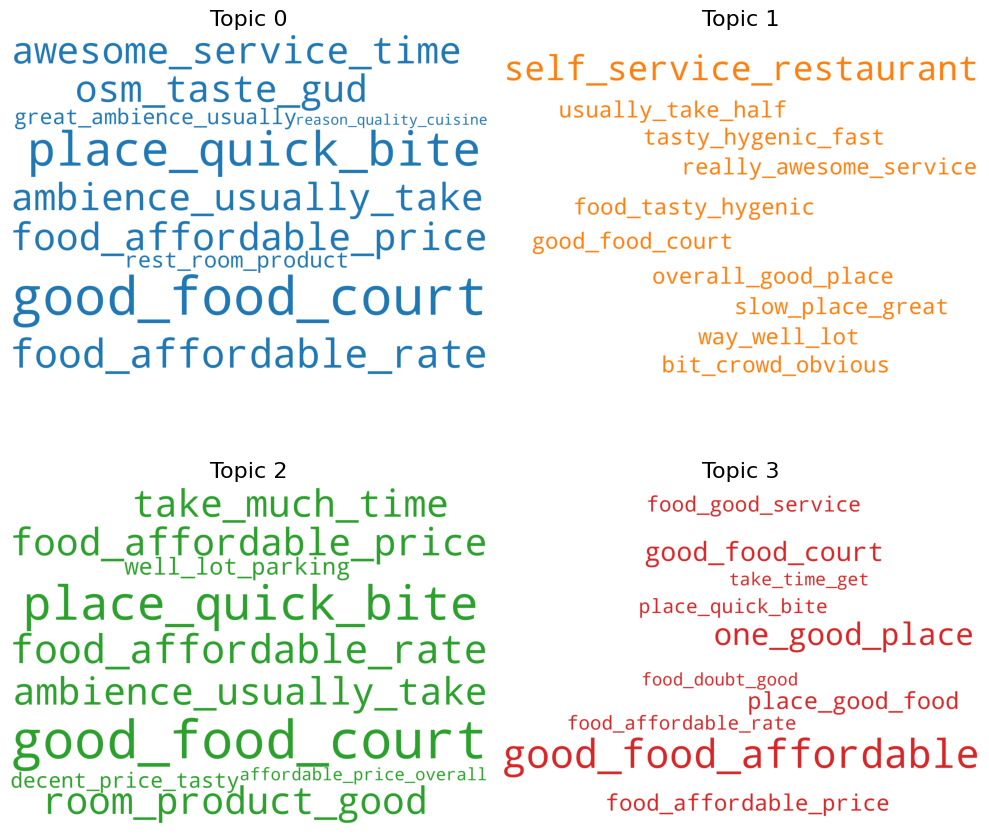

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_trigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 3 STAR RATING

In [ ]:
mask3=df['rating']==3
mask3

,rating
0,False
1,False
2,False
3,False
4,False
...,...
457,False
484,False
491,False
568,True


In [ ]:
mask4 =~df['user_text'].isnull()
mask4

,user_text
0,True
1,True
2,True
3,True
4,True
...,...
457,True
484,True
491,True
568,True


In [ ]:
joined_text3 =' '.join(df['cleaned1'][mask3 & mask4])

In [ ]:
joined_text3_NORMAL =' '.join(df['cleaned'][mask3 & mask4])

In [ ]:
print(joined_text3_NORMAL)

food is less than average except for 1 or 2 dishes  we reached for dinner  and it took us around 10 minutes to find a proper seat  waiting time is at least 45 minutes  so  if you have time  then come here  food is not served at the table  so you must take it from the counter when your token comes  you have to ask the waiter for basic things like water  pickles  and salads  which is the worst thing i ve eaten twice here and both times the food was horrible  the wide selection of items and the food court system of order are both great  but the taste is so bad  either very spicy  too much salt  undercooked or no taste  but the price and amount of food you get is good  the cashier is absolutely no help if you have questions  but the cleaning serving staff are great according to price food was not so tasty   fried rice taste was like normal rice   all the food i ordered was normal and average the great thing is that this place is reasonable  but if we talk about the food taste  it is not up

In [ ]:
len(joined_text3)

8137

In [ ]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
# Tokenizing the text
tokens = word_tokenize(joined_text3)
print(tokens)


['food', 'less', 'average', 'except', 'dish', 'reach', 'dinner', 'take', 'around', 'minute', 'find', 'proper', 'seat', 'wait', 'time', 'least', 'minute', 'time', 'come', 'food', 'serve', 'table', 'must', 'take', 'counter', 'token', 'comes', 'ask', 'waiter', 'basic', 'thing', 'like', 'water', 'pickle', 'salad', 'bad', 'thing', 'eat', 'twice', 'time', 'food', 'horrible', 'wide', 'selection', 'item', 'food', 'court', 'system', 'order', 'great', 'taste', 'bad', 'either', 'spicy', 'much', 'salt', 'undercooked', 'taste', 'price', 'amount', 'food', 'get', 'good', 'cashier', 'absolutely', 'help', 'question', 'clean', 'serve', 'staff', 'great', 'accord', 'price', 'food', 'tasty', 'fried', 'rice', 'taste', 'like', 'normal', 'rice', 'food', 'order', 'normal', 'average', 'great', 'thing', 'place', 'reasonable', 'talk', 'food', 'taste', 'upto', 'mark', 'try', 'almost', 'dish', 'mention', 'menu', 'taste', 'either', 'spicy', 'salty', 'talk', 'shake', 'full', 'ice', 'crumb', 'give', 'star', 'suddenly'

In [ ]:
freq=nltk.FreqDist(tokens)
most_common=freq.most_common(100)
most_common

[('food', 49),
 ('good', 46),
 ('place', 26),
 ('taste', 23),
 ('service', 22),
 ('time', 17),
 ('order', 15),
 ('like', 12),
 ('price', 12),
 ('nice', 10),
 ('restaurant', 10),
 ('take', 9),
 ('wait', 9),
 ('self', 9),
 ('also', 9),
 ('thing', 8),
 ('bad', 8),
 ('much', 8),
 ('get', 8),
 ('try', 8),
 ('bhu', 8),
 ('average', 7),
 ('dish', 7),
 ('give', 7),
 ('well', 7),
 ('student', 7),
 ('serve', 6),
 ('eat', 6),
 ('item', 6),
 ('veg', 6),
 ('quality', 6),
 ('indian', 6),
 ('minute', 5),
 ('come', 5),
 ('great', 5),
 ('use', 5),
 ('always', 5),
 ('one', 5),
 ('lanka', 5),
 ('paneer', 5),
 ('something', 5),
 ('crowd', 5),
 ('find', 4),
 ('staff', 4),
 ('tasty', 4),
 ('almost', 4),
 ('fast', 4),
 ('cost', 4),
 ('quantity', 4),
 ('near', 4),
 ('slow', 4),
 ('visit', 4),
 ('ambience', 4),
 ('pasta', 4),
 ('available', 4),
 ('lot', 4),
 ('everything', 4),
 ('experience', 4),
 ('south', 4),
 ('around', 3),
 ('table', 3),
 ('counter', 3),
 ('waiter', 3),
 ('court', 3),
 ('system', 3),
 ('sp

In [ ]:
reg=re.compile(r'capsicum|varanasi|lanka')
working_text=reg.sub('',joined_text3)

print(working_text)

food less   average except   dish reach   dinner   take around minute find proper seat wait time least minute    time   come   food   serve   table   must take    counter    token comes    ask   waiter   basic thing like water pickle   salad    bad thing eat twice     time   food   horrible   wide selection item    food court system order    great    taste bad either   spicy   much salt undercooked taste    price   amount food   get good   cashier absolutely help    question    clean serve staff   great accord price food    tasty fried rice taste   like normal rice    food order   normal   average   great thing    place reasonable   talk    food taste   upto   mark   try almost    dish mention menu taste   either   spicy   salty talk   shake full ice crumb   give star suddenly   see   get break plate   dirty glass water   change mind star   service    fast    taste   superb    cost price   reasonable   order veg combo   thing   good taste dish serve average   quantity accord price sati

In [ ]:
# Remove single-character words
result = re.sub(r'\b\w\b', '', working_text)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result = re.sub(r'\s+', ' ', result).strip()



print(result)



food less average except dish reach dinner take around minute find proper seat wait time least minute time come food serve table must take counter token comes ask waiter basic thing like water pickle salad bad thing eat twice time food horrible wide selection item food court system order great taste bad either spicy much salt undercooked taste price amount food get good cashier absolutely help question clean serve staff great accord price food tasty fried rice taste like normal rice food order normal average great thing place reasonable talk food taste upto mark try almost dish mention menu taste either spicy salty talk shake full ice crumb give star suddenly see get break plate dirty glass water change mind star service fast taste superb cost price reasonable order veg combo thing good taste dish serve average quantity accord price satisfactory need well service well food quality need well training employee manager food court utterly unprofessional concerned person make soft drink use

In [ ]:
!pip install wordcloud
from wordcloud import WordCloud

from collections import Counter
from nltk import ngrams
from wordcloud import WordCloud
import matplotlib.pyplot as plt


In [ ]:
def generate_ngrams(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return Counter(n_grams)

In [ ]:
def frequency_plot(ngram_freq,top_n):
    common_ngrams = ngram_freq.most_common(top_n)

    # Separate the n-grams and their frequencies for plotting
    ngrams, frequencies = zip(*common_ngrams)

    # Plotting the frequency graph
    plt.figure(figsize=(10, 5))
    plt.barh(ngrams, frequencies, color='skyblue')
    plt.xlabel('Frequency')
    plt.ylabel('N-Grams')
    plt.xticks(rotation=70)
    plt.title(f'Top {top_n} Most Frequent N-Grams')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most frequent at the top
    plt.show()


In [ ]:
unigram=generate_ngrams(result,1)
for i,j in unigram.items():
    print(i,":",j)
    print("\n")

food : 49


less : 1


average : 7


except : 2


dish : 7


reach : 1


dinner : 2


take : 9


around : 3


minute : 5


find : 4


proper : 1


seat : 2


wait : 9


time : 17


least : 1


come : 5


serve : 6


table : 3


must : 1


counter : 3


token : 2


comes : 1


ask : 1


waiter : 3


basic : 1


thing : 8


like : 12


water : 2


pickle : 1


salad : 1


bad : 8


eat : 6


twice : 1


horrible : 1


wide : 1


selection : 1


item : 6


court : 3


system : 3


order : 15


great : 5


taste : 23


either : 2


spicy : 3


much : 8


salt : 3


undercooked : 1


price : 12


amount : 1


get : 8


good : 46


cashier : 1


absolutely : 1


help : 1


question : 1


clean : 2


staff : 4


accord : 2


tasty : 4


fried : 1


rice : 2


normal : 3


place : 26


reasonable : 3


talk : 2


upto : 2


mark : 3


try : 8


almost : 4


mention : 1


menu : 2


salty : 1


shake : 2


full : 1


ice : 2


crumb : 1


give : 7


star : 3


suddenly : 1


see : 2


break : 1

In [ ]:
bigram=generate_ngrams(result,2)
for i,j in bigram.items():
    print(i,":",j)
    print("\n")

food_less : 1


less_average : 1


average_except : 1


except_dish : 1


dish_reach : 1


reach_dinner : 1


dinner_take : 1


take_around : 1


around_minute : 1


minute_find : 1


find_proper : 1


proper_seat : 1


seat_wait : 1


wait_time : 4


time_least : 1


least_minute : 1


minute_time : 1


time_come : 1


come_food : 1


food_serve : 1


serve_table : 1


table_must : 1


must_take : 1


take_counter : 1


counter_token : 1


token_comes : 1


comes_ask : 1


ask_waiter : 1


waiter_basic : 1


basic_thing : 1


thing_like : 3


like_water : 1


water_pickle : 1


pickle_salad : 1


salad_bad : 1


bad_thing : 2


thing_eat : 1


eat_twice : 1


twice_time : 1


time_food : 2


food_horrible : 1


horrible_wide : 1


wide_selection : 1


selection_item : 1


item_food : 1


food_court : 3


court_system : 1


system_order : 1


order_great : 1


great_taste : 1


taste_bad : 1


bad_either : 1


either_spicy : 2


spicy_much : 1


much_salt : 1


salt_undercooked : 1


u

In [ ]:
trigram=generate_ngrams(result,3)
for i,j in trigram.items():
    print(i,":",j)
    print("\n")

food_less_average : 1


less_average_except : 1


average_except_dish : 1


except_dish_reach : 1


dish_reach_dinner : 1


reach_dinner_take : 1


dinner_take_around : 1


take_around_minute : 1


around_minute_find : 1


minute_find_proper : 1


find_proper_seat : 1


proper_seat_wait : 1


seat_wait_time : 1


wait_time_least : 1


time_least_minute : 1


least_minute_time : 1


minute_time_come : 1


time_come_food : 1


come_food_serve : 1


food_serve_table : 1


serve_table_must : 1


table_must_take : 1


must_take_counter : 1


take_counter_token : 1


counter_token_comes : 1


token_comes_ask : 1


comes_ask_waiter : 1


ask_waiter_basic : 1


waiter_basic_thing : 1


basic_thing_like : 1


thing_like_water : 1


like_water_pickle : 1


water_pickle_salad : 1


pickle_salad_bad : 1


salad_bad_thing : 1


bad_thing_eat : 1


thing_eat_twice : 1


eat_twice_time : 1


twice_time_food : 1


time_food_horrible : 1


food_horrible_wide : 1


horrible_wide_selection : 1


wide_sel

In [ ]:
fourgram=generate_ngrams(result,4)
for i,j in fourgram.items():
    print(i,":",j)
    print("\n")

food_less_average_except : 1


less_average_except_dish : 1


average_except_dish_reach : 1


except_dish_reach_dinner : 1


dish_reach_dinner_take : 1


reach_dinner_take_around : 1


dinner_take_around_minute : 1


take_around_minute_find : 1


around_minute_find_proper : 1


minute_find_proper_seat : 1


find_proper_seat_wait : 1


proper_seat_wait_time : 1


seat_wait_time_least : 1


wait_time_least_minute : 1


time_least_minute_time : 1


least_minute_time_come : 1


minute_time_come_food : 1


time_come_food_serve : 1


come_food_serve_table : 1


food_serve_table_must : 1


serve_table_must_take : 1


table_must_take_counter : 1


must_take_counter_token : 1


take_counter_token_comes : 1


counter_token_comes_ask : 1


token_comes_ask_waiter : 1


comes_ask_waiter_basic : 1


ask_waiter_basic_thing : 1


waiter_basic_thing_like : 1


basic_thing_like_water : 1


thing_like_water_pickle : 1


like_water_pickle_salad : 1


water_pickle_salad_bad : 1


pickle_salad_bad_thing : 1

In [ ]:
def create_wordcloud(ngrams_counts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(ngrams_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(title)
    plt.show()

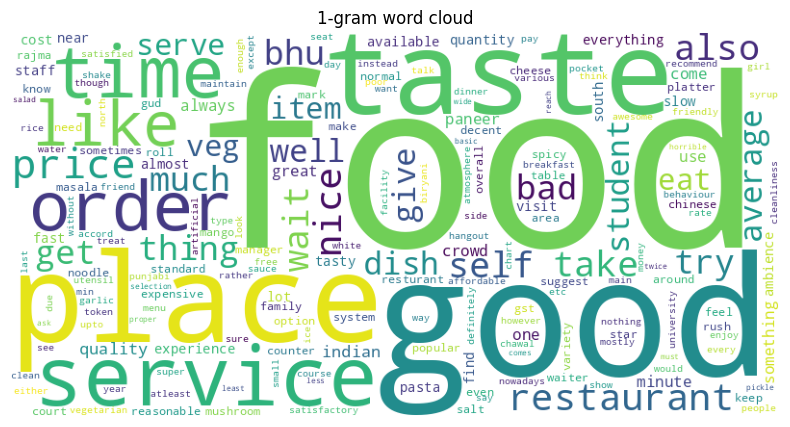

In [ ]:
create_wordcloud(unigram,'1-gram word cloud')

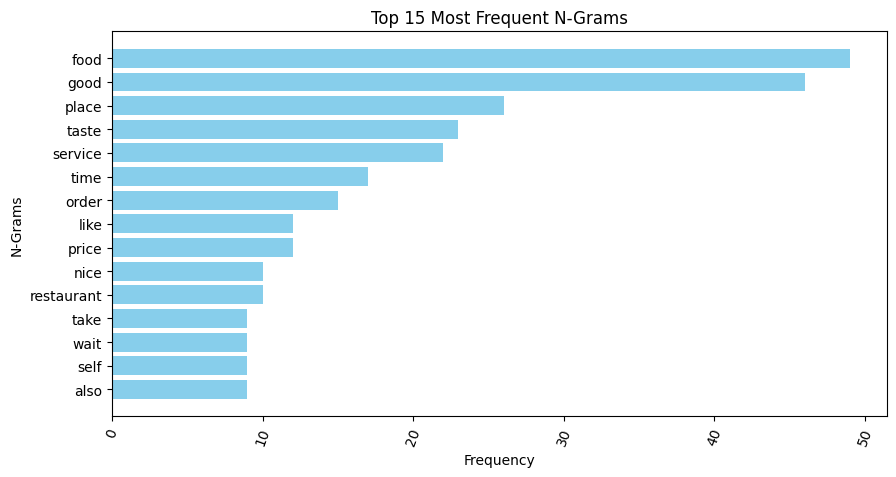

In [ ]:
frequency_plot(unigram,15)


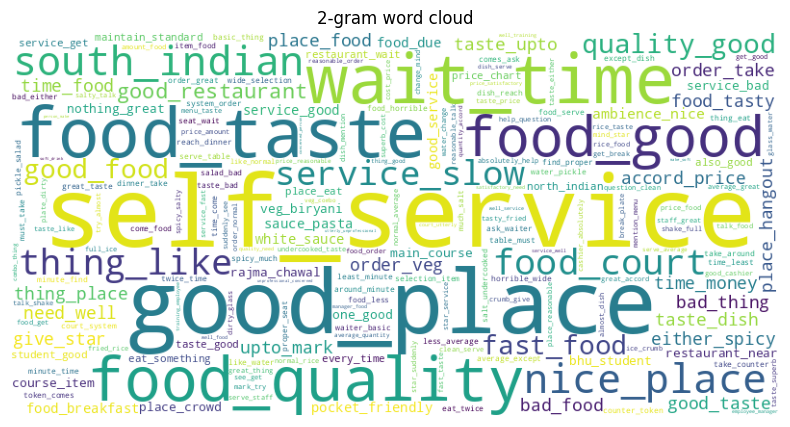

In [ ]:
create_wordcloud(bigram,'2-gram word cloud')

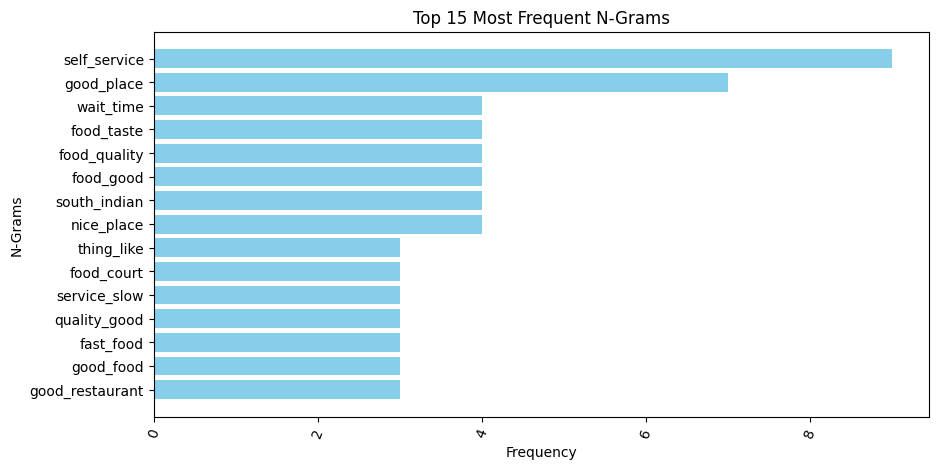

In [ ]:
frequency_plot(bigram,15)


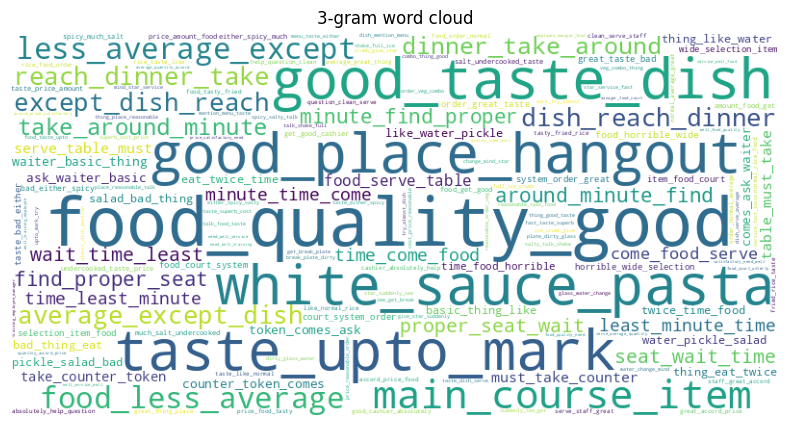

In [ ]:
create_wordcloud(trigram,'3-gram word cloud')

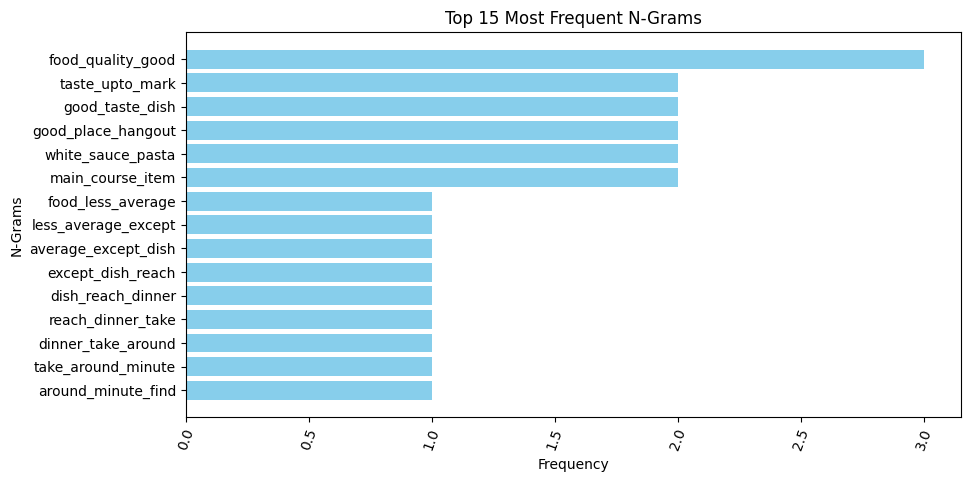

In [ ]:
frequency_plot(trigram,15)

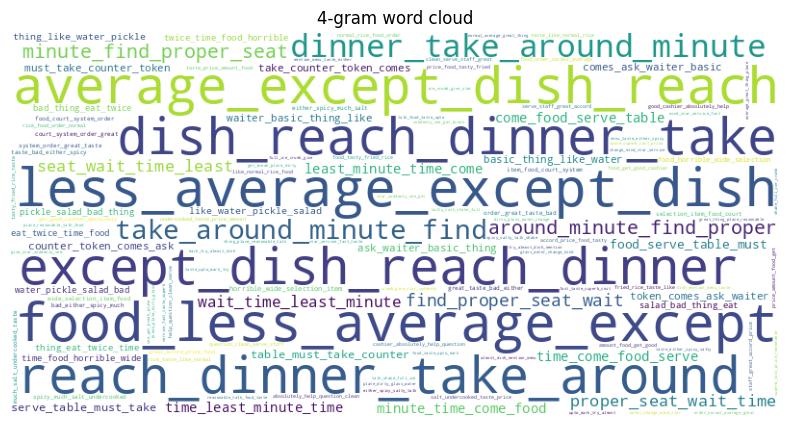

In [ ]:
create_wordcloud(fourgram,'4-gram word cloud')

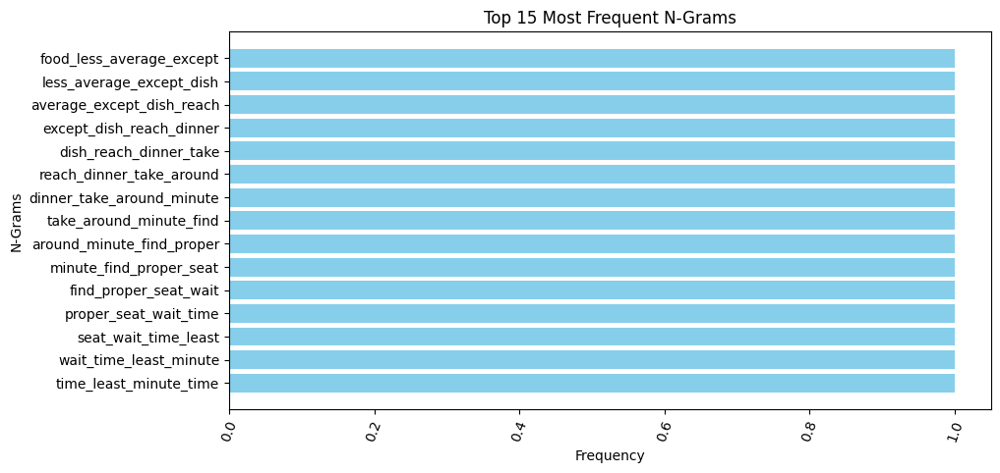

In [ ]:
frequency_plot(fourgram,15)

In [ ]:
allgram= unigram+bigram+trigram+fourgram

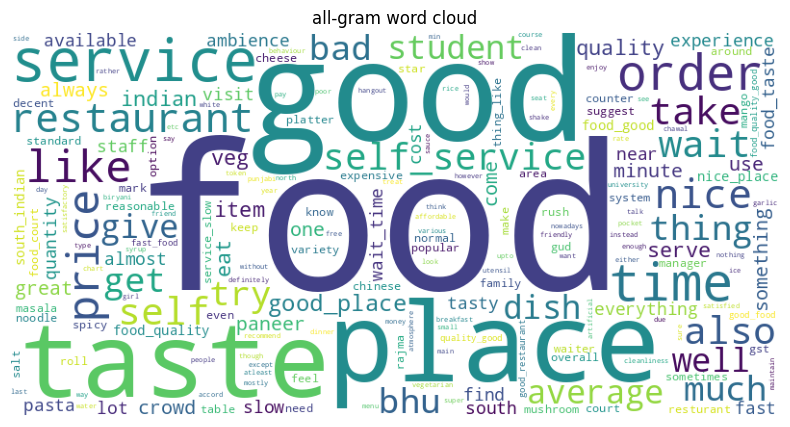

In [ ]:
create_wordcloud(allgram,'all-gram word cloud')

# LDA FOR 3 STAR

In [ ]:
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import  simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

In [ ]:

joined_text3

'food less   average except   dish reach   dinner   take around minute find proper seat wait time least minute    time   come   food   serve   table   must take    counter    token comes    ask   waiter   basic thing like water pickle   salad    bad thing eat twice     time   food   horrible   wide selection item    food court system order    great    taste bad either   spicy   much salt undercooked taste    price   amount food   get good   cashier absolutely help    question    clean serve staff   great accord price food    tasty fried rice taste   like normal rice    food order   normal   average   great thing    place reasonable   talk    food taste   upto   mark   try almost    dish mention menu taste   either   spicy   salty talk   shake full ice crumb   give star suddenly   see   get break plate   dirty glass water   change mind star   service    fast    taste   superb    cost price   reasonable   order veg combo   thing   good taste dish serve average   quantity accord price sat

In [ ]:
result = re.sub(r'\b\w\b', '', joined_text3)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result1 = re.sub(r'\s+', ' ', result).strip()


In [ ]:
#converting string into list
def convert(string):
    li = list(string.split(" "))
    return li

text_final=convert(result1)


In [ ]:
# Step 1: Import necessary libraries


import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text.lower()) for text in text_final]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]




[(0,
  '0.105*"soso" + 0.105*"mediam" + 0.045*"service" + 0.030*"time" + '
  '0.022*"order" + 0.020*"something" + 0.018*"wait" + 0.016*"much" + '
  '0.015*"give" + 0.014*"bad"'),
 (1,
  '0.121*"good" + 0.098*"mediam" + 0.098*"soso" + 0.036*"taste" + 0.030*"self" '
  '+ 0.026*"nice" + 0.022*"price" + 0.016*"ambience" + 0.012*"visit" + '
  '0.008*"expensive"'),
 (2,
  '0.098*"soso" + 0.097*"mediam" + 0.077*"food" + 0.061*"place" + 0.024*"get" '
  '+ 0.021*"also" + 0.018*"eat" + 0.016*"thing" + 0.015*"quality" + '
  '0.015*"crowd"'),
 (3,
  '0.105*"mediam" + 0.103*"soso" + 0.028*"restaurant" + 0.027*"like" + '
  '0.015*"available" + 0.015*"take" + 0.014*"tasty" + 0.012*"average" + '
  '0.011*"almost" + 0.011*"chinese"')]


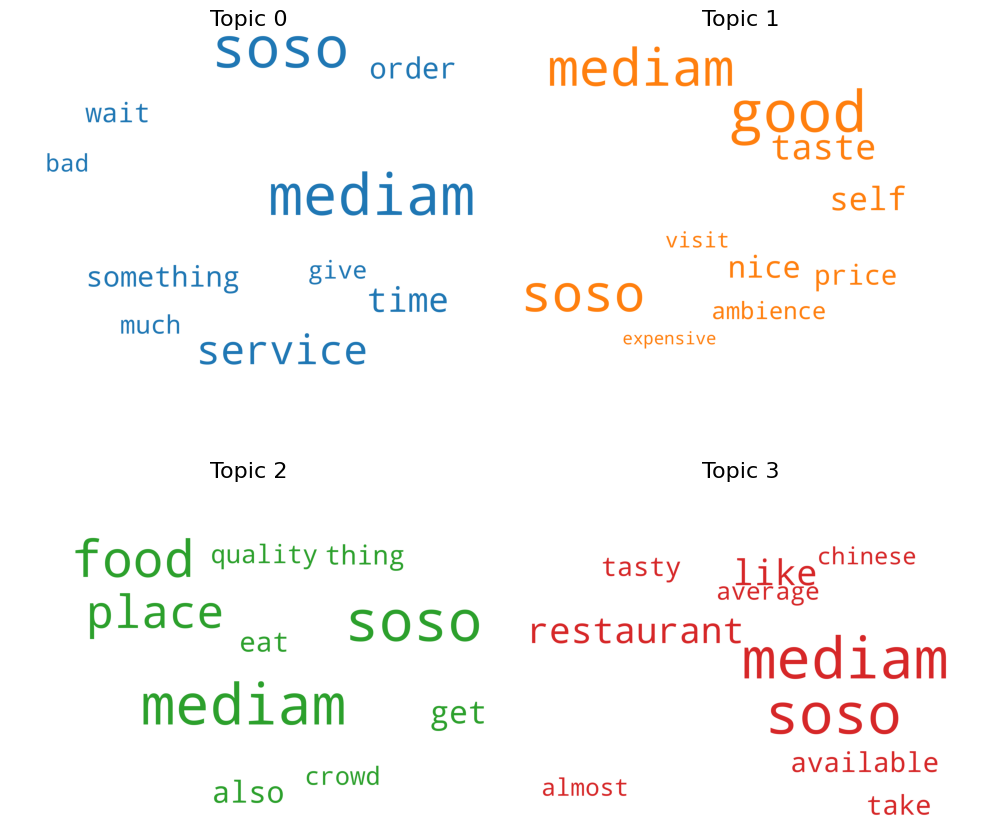

In [ ]:
  from matplotlib import pyplot as plt
  from wordcloud import WordCloud
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

In [ ]:
def generate_ngrams_lda(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return n_grams

In [ ]:
bigram_words_lda4=generate_ngrams_lda(result1,2)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in bigram_words_lda4]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_bigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_bigram.print_topics())
doc_lda_bigram = lda_model_bigram[corpus]


[(0,
  '0.144*"mediam_soso" + 0.017*"good_place" + 0.007*"food_taste" + '
  '0.005*"thing_like" + 0.003*"service_bad" + 0.003*"food_tasty" + '
  '0.003*"nice_place" + 0.003*"south_indian" + 0.003*"eat_something" + '
  '0.002*"place_hangout"'),
 (1,
  '0.162*"mediam_soso" + 0.007*"south_indian" + 0.005*"good_restaurant" + '
  '0.004*"good_taste" + 0.004*"nice_place" + 0.003*"give_star" + '
  '0.003*"taste_good" + 0.003*"service_get" + 0.003*"place_crowd" + '
  '0.003*"one_good"'),
 (2,
  '0.152*"mediam_soso" + 0.005*"food_quality" + 0.004*"sauce_pasta" + '
  '0.004*"white_sauce" + 0.004*"food_due" + 0.004*"taste_dish" + '
  '0.003*"south_indian" + 0.003*"good_food" + 0.003*"nice_place" + '
  '0.003*"fast_food"'),
 (3,
  '0.144*"mediam_soso" + 0.023*"self_service" + 0.007*"food_good" + '
  '0.006*"wait_time" + 0.006*"quality_good" + 0.004*"bad_food" + '
  '0.004*"order_take" + 0.003*"south_indian" + 0.003*"nice_place" + '
  '0.003*"ambience_nice"')]


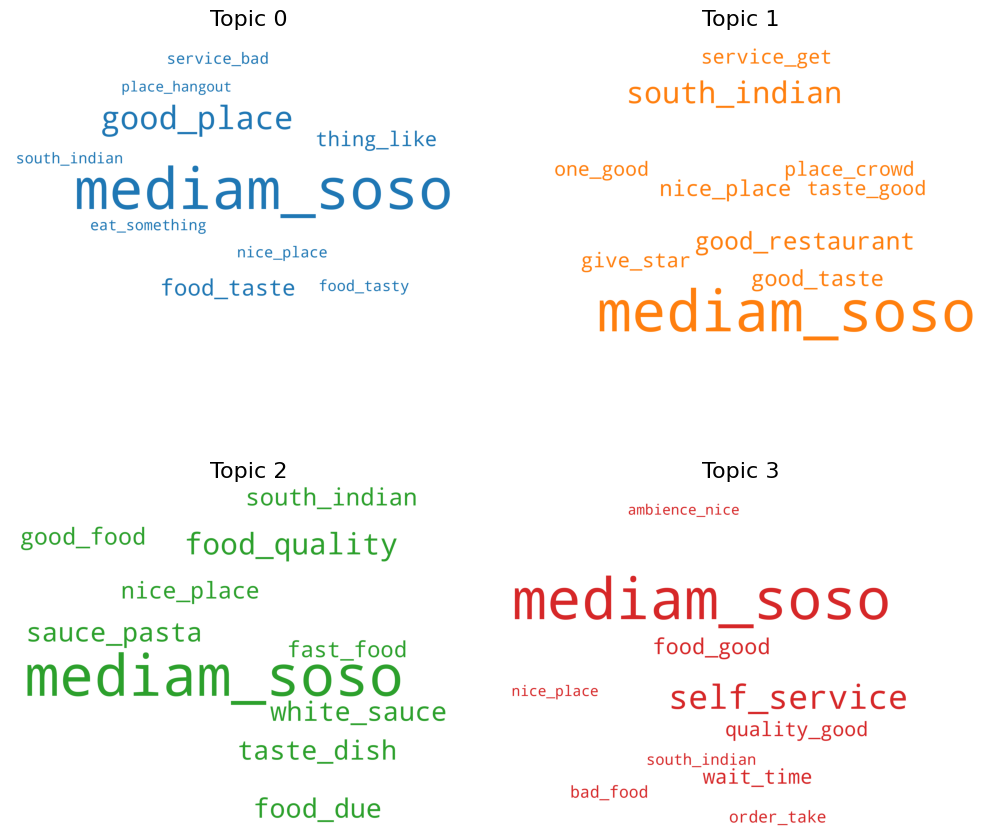

In [ ]:
  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_bigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()


In [ ]:
trigram_words_lda4=generate_ngrams_lda(result1,3)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in trigram_words_lda4]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_trigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_trigram.print_topics())
doc_lda_trigram = lda_model_trigram[corpus]


[(0,
  '0.003*"good_place_hangout" + 0.002*"good_awesome_gud" + '
  '0.002*"restaurant_wait_time" + 0.002*"sometimes_taste_awesome" + '
  '0.002*"thing_like_service" + 0.002*"visit_lot_free" + '
  '0.002*"skill_specially_crowd" + 0.002*"food_good_ambience" + '
  '0.002*"available_near_average" + 0.002*"counter_everytime_need"'),
 (1,
  '0.002*"taste_dish_good" + 0.002*"please_visit_lot" + '
  '0.002*"quality_good_lack" + 0.002*"good_cleaning_condition" + '
  '0.002*"good_ambience_afternoon" + 0.002*"sometimes_taste_awesome" + '
  '0.002*"thing_self_service" + 0.002*"hospitality_skill_specially" + '
  '0.002*"expensive_tasty_annoying" + 0.002*"place_nice_ambience"'),
 (2,
  '0.005*"white_sauce_pasta" + 0.005*"good_taste_dish" + '
  '0.002*"please_visit_lot" + 0.002*"south_indian_amazing" + '
  '0.002*"type_cuisine_available" + 0.002*"hospitality_skill_specially" + '
  '0.002*"cuisine_available_self" + 0.002*"time_much_please" + '
  '0.002*"crowd_sometimes_taste" + 0.002*"taste_good_clea

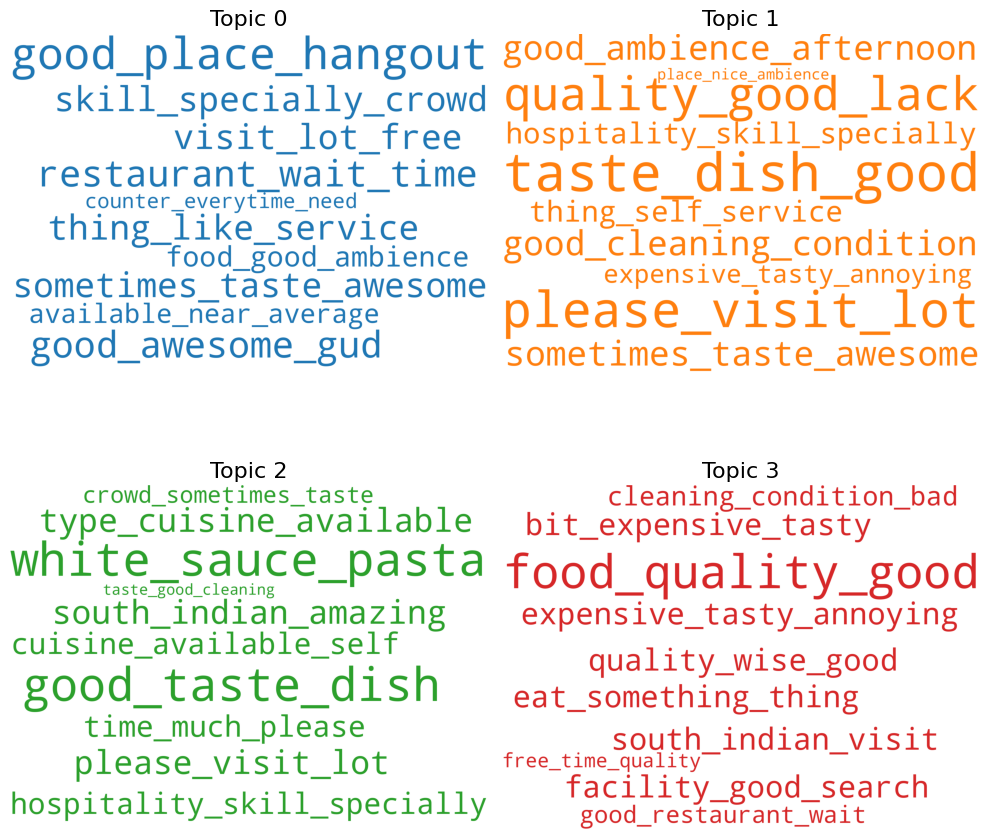

In [ ]:
  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_trigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()



In [ ]:
fourgram_words_lda4=generate_ngrams_lda(result1,4)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in fourgram_words_lda4]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_fourgram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_fourgram.print_topics())
doc_lda_fourgram = lda_model_fourgram[corpus]


[(0,
  '0.002*"like_good_restaurant_wait" + 0.002*"amazing_chinese_mark_facility" + '
  '0.002*"restaurant_wait_time_much" + 0.002*"good_lack_management_restaurant" '
  '+ 0.002*"facility_parking_available_near" + 0.002*"wait_time_much_please" + '
  '0.002*"good_search_south_indian" + 0.002*"something_thing_like_service" + '
  '0.002*"much_please_visit_lot" + 0.002*"gud_teste_mediam_soso"'),
 (1,
  '0.002*"good_restaurant_wait_time" + 0.002*"thing_self_service_food" + '
  '0.002*"something_like_good_restaurant" + '
  '0.002*"quality_good_lack_management" + 0.002*"good_cleaning_condition_bad" '
  '+ 0.002*"hospitality_skill_specially_crowd" + '
  '0.002*"recommend_area_good_taste" + 0.002*"annoying_thing_self_service" + '
  '0.002*"good_place_nice_ambience" + 0.002*"would_definitely_recommend_area"'),
 (2,
  '0.002*"management_restaurant_hospitality_skill" + '
  '0.002*"skill_specially_crowd_sometimes" + '
  '0.002*"crowd_sometimes_taste_awesome" + 0.002*"good_cleaning_condition_bad" '


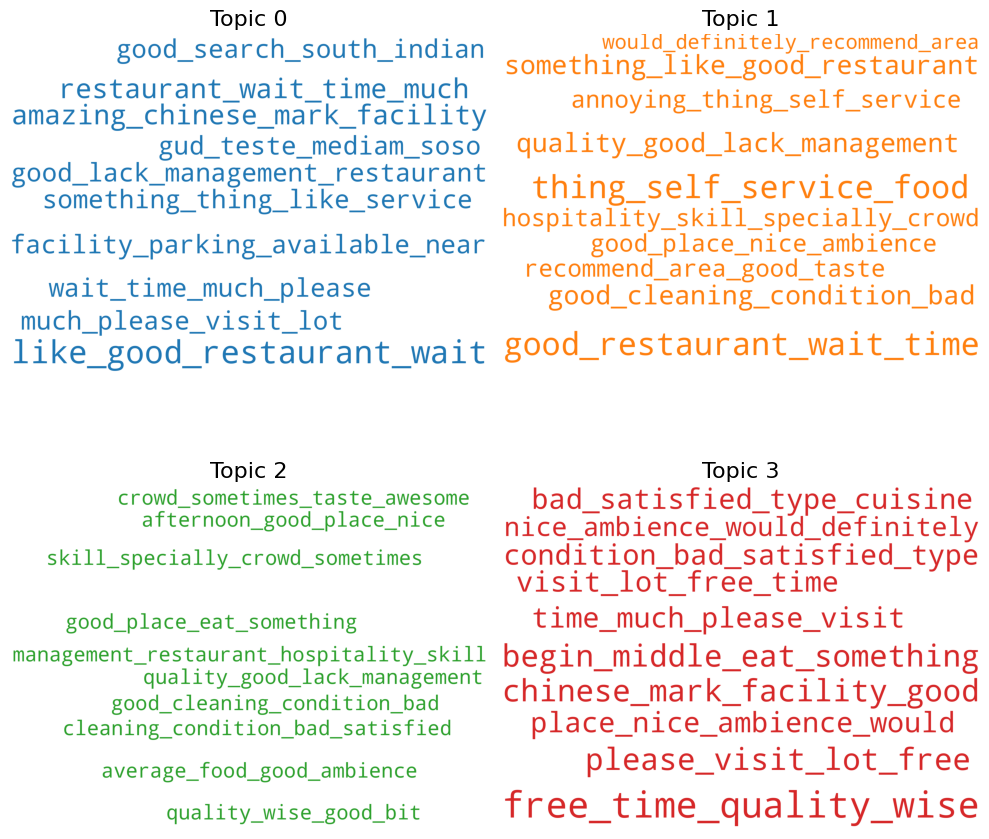

In [ ]:
  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_fourgram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()



# 2,1 ratings

In [ ]:
rate=[1,2]
mask1=df['rating'].isin(rate)
mask1

,rating
0,False
1,True
2,False
3,False
4,True
...,...
457,False
484,False
491,False
568,False


In [ ]:
mask2 =~df['user_text'].isnull()
mask2

,user_text
0,True
1,True
2,True
3,True
4,True
...,...
457,True
484,True
491,True
568,True


In [ ]:
joined_text2 =' '.join(df['cleaned1'][mask1 & mask2])

In [ ]:
joined_text2_normal =' '.join(df['cleaned'][mask1 & mask2])

In [ ]:
print(joined_text2_normal)

this place is just overhyped  nothing tastes  we ordered afghani momo bc it looked like it was served straight out of the freezer  menchurian is also no taste not baked properly  also  when you order rice  it looks like you have vegetable pulao there along with whole turmeric  709 rupee what splash in water   my time was wasted after waiting for 1 hour today i took chilli paneer and lacha paratha which made a dam of 3rd quality  gave it a test of chilli paneer and lacha paratha which made a dam which was very heavy worst restaurant one can ever go to  there is no sense of taste for any of the dishes here  overhyped  worst  very bad  do not visit ever how many good reviews are there are all fake    poor service hai brother and no one is listening  where is the new log and where is he going  we have to guess because first of all this payment is not available anywhere i ordered hot chocolate but this tastes like bournvita was mixed in milk same as we offer milk to our children   it was de

In [ ]:
joined_text2

'  place   overhype nothing taste order afghani momo look like   serve straight    freezer menchurian also taste   bake properly also    order rice look like    vegetable pulao   along   whole turmeric rupee   splash water time   waste   wait   hour today take chilli paneer   lacha paratha   make dam quality give test chilli paneer   lacha paratha   make dam     heavy bad restaurant one   ever   sense taste     dish   overhype worst   bad   visit ever   many good review      fake poor service hai brother   one listen    new log    go   guess   first    payment   available anywhere order hot chocolate    taste like bournvita   mixed milk   offer milk   child   decorate well     nothing like hot chocolate recommend   winter also   crowd normal    work food okay   summer specially weekend     get place sit nobody   come help     manage   experience    average   recommend roma cafe paprika food court lanka varanasi    spacious   service well   try   see brunch people around    food   horri

In [ ]:
len(joined_text2)

12224

In [ ]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

# Tokenizing the text
tokens = word_tokenize(joined_text2)
print(tokens)

['place', 'overhype', 'nothing', 'taste', 'order', 'afghani', 'momo', 'look', 'like', 'serve', 'straight', 'freezer', 'menchurian', 'also', 'taste', 'bake', 'properly', 'also', 'order', 'rice', 'look', 'like', 'vegetable', 'pulao', 'along', 'whole', 'turmeric', 'rupee', 'splash', 'water', 'time', 'waste', 'wait', 'hour', 'today', 'take', 'chilli', 'paneer', 'lacha', 'paratha', 'make', 'dam', 'quality', 'give', 'test', 'chilli', 'paneer', 'lacha', 'paratha', 'make', 'dam', 'heavy', 'bad', 'restaurant', 'one', 'ever', 'sense', 'taste', 'dish', 'overhype', 'worst', 'bad', 'visit', 'ever', 'many', 'good', 'review', 'fake', 'poor', 'service', 'hai', 'brother', 'one', 'listen', 'new', 'log', 'go', 'guess', 'first', 'payment', 'available', 'anywhere', 'order', 'hot', 'chocolate', 'taste', 'like', 'bournvita', 'mixed', 'milk', 'offer', 'milk', 'child', 'decorate', 'well', 'nothing', 'like', 'hot', 'chocolate', 'recommend', 'winter', 'also', 'crowd', 'normal', 'work', 'food', 'okay', 'summer', 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
freq=nltk.FreqDist(tokens)

In [ ]:
most_common=freq.most_common(100)

In [ ]:
most_common

[('bad', 55),
 ('food', 49),
 ('order', 45),
 ('service', 41),
 ('time', 32),
 ('restaurant', 26),
 ('good', 24),
 ('taste', 23),
 ('place', 21),
 ('wait', 21),
 ('experience', 20),
 ('staff', 18),
 ('give', 17),
 ('also', 16),
 ('paneer', 15),
 ('take', 13),
 ('minute', 13),
 ('money', 13),
 ('hour', 12),
 ('come', 12),
 ('customer', 12),
 ('never', 12),
 ('waste', 11),
 ('visit', 11),
 ('poor', 11),
 ('get', 11),
 ('eat', 11),
 ('like', 10),
 ('rice', 10),
 ('make', 10),
 ('dish', 10),
 ('manager', 10),
 ('even', 10),
 ('quality', 9),
 ('say', 9),
 ('capsicum', 9),
 ('serve', 8),
 ('one', 8),
 ('ever', 8),
 ('first', 8),
 ('please', 8),
 ('people', 7),
 ('behaviour', 7),
 ('min', 7),
 ('go', 6),
 ('well', 6),
 ('recommend', 6),
 ('know', 6),
 ('pizza', 6),
 ('rude', 6),
 ('provide', 6),
 ('chilli', 5),
 ('paratha', 5),
 ('without', 5),
 ('last', 5),
 ('totally', 5),
 ('pathetic', 5),
 ('still', 5),
 ('delay', 5),
 ('late', 5),
 ('much', 5),
 ('day', 5),
 ('kivi', 5),
 ('look', 4),
 (

In [ ]:
reg=re.compile(r'capsicum|varanasi|lanka')
working_text=reg.sub('',joined_text2)

print(working_text)

  place   overhype nothing taste order afghani momo look like   serve straight    freezer menchurian also taste   bake properly also    order rice look like    vegetable pulao   along   whole turmeric rupee   splash water time   waste   wait   hour today take chilli paneer   lacha paratha   make dam quality give test chilli paneer   lacha paratha   make dam     heavy bad restaurant one   ever   sense taste     dish   overhype worst   bad   visit ever   many good review      fake poor service hai brother   one listen    new log    go   guess   first    payment   available anywhere order hot chocolate    taste like bournvita   mixed milk   offer milk   child   decorate well     nothing like hot chocolate recommend   winter also   crowd normal    work food okay   summer specially weekend     get place sit nobody   come help     manage   experience    average   recommend roma cafe paprika food court      spacious   service well   try   see brunch people around    food   horrible   taste ba

In [ ]:
# Remove single-character words
result = re.sub(r'\b\w\b', '', working_text)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result = re.sub(r'\s+', ' ', result).strip()



print(result)

place overhype nothing taste order afghani momo look like serve straight freezer menchurian also taste bake properly also order rice look like vegetable pulao along whole turmeric rupee splash water time waste wait hour today take chilli paneer lacha paratha make dam quality give test chilli paneer lacha paratha make dam heavy bad restaurant one ever sense taste dish overhype worst bad visit ever many good review fake poor service hai brother one listen new log guess first payment available anywhere order hot chocolate taste like bournvita mixed milk offer milk child decorate well nothing like hot chocolate recommend winter also crowd normal work food okay summer specially weekend get place sit nobody come help manage experience average recommend roma cafe paprika food court spacious service well try see brunch people around food horrible taste bad contain sugar undercooked taste price amount food get good cleaning serve staff great one get customer feedback food quality food atmospher

In [ ]:
!pip install wordcloud
from wordcloud import WordCloud

In [ ]:
from collections import Counter
from nltk import ngrams
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [ ]:
def generate_ngrams(text, n):
    words = text.split()
    n_grams = ngrams(words, n)
    n_grams = ['_'.join(gram) for gram in n_grams]  # Convert tuples to strings
    return Counter(n_grams)

In [ ]:
def frequency_plot(ngram_freq,top_n):
    common_ngrams = ngram_freq.most_common(top_n)

    # Separate the n-grams and their frequencies for plotting
    ngrams, frequencies = zip(*common_ngrams)

    # Plotting the frequency graph
    plt.figure(figsize=(10, 5))
    plt.barh(ngrams, frequencies, color='skyblue')
    plt.xlabel('Frequency')
    plt.ylabel('N-Grams')
    plt.xticks(rotation=70)
    plt.title(f'Top {top_n} Most Frequent N-Grams')
    plt.gca().invert_yaxis()  # Invert y-axis to show the most frequent at the top
    plt.show()

In [ ]:
unigram=generate_ngrams(result,1)
for i,j in unigram.items():
    print(i,":",j)
    print("\n")

place : 21


overhype : 2


nothing : 3


taste : 23


order : 45


afghani : 1


momo : 1


look : 4


like : 10


serve : 8


straight : 1


freezer : 1


menchurian : 1


also : 16


bake : 2


properly : 1


rice : 10


vegetable : 2


pulao : 1


along : 1


whole : 1


turmeric : 1


rupee : 2


splash : 1


water : 1


time : 32


waste : 11


wait : 21


hour : 12


today : 4


take : 13


chilli : 5


paneer : 15


lacha : 2


paratha : 5


make : 10


dam : 2


quality : 9


give : 17


test : 3


heavy : 1


bad : 55


restaurant : 26


one : 8


ever : 8


sense : 2


dish : 10


worst : 1


visit : 11


many : 2


good : 24


review : 4


fake : 1


poor : 11


service : 41


hai : 2


brother : 1


listen : 3


new : 2


log : 1


guess : 3


first : 8


payment : 2


available : 2


anywhere : 1


hot : 2


chocolate : 2


bournvita : 1


mixed : 1


milk : 2


offer : 1


child : 1


decorate : 1


well : 6


recommend : 6


winter : 1


crowd : 3


normal : 2


work : 

In [ ]:
bigram=generate_ngrams(result,2)
for i,j in bigram.items():
    print(i,":",j)
    print("\n")

place_overhype : 1


overhype_nothing : 1


nothing_taste : 1


taste_order : 2


order_afghani : 1


afghani_momo : 1


momo_look : 1


look_like : 3


like_serve : 1


serve_straight : 1


straight_freezer : 1


freezer_menchurian : 1


menchurian_also : 1


also_taste : 1


taste_bake : 1


bake_properly : 1


properly_also : 1


also_order : 3


order_rice : 3


rice_look : 1


like_vegetable : 1


vegetable_pulao : 1


pulao_along : 1


along_whole : 1


whole_turmeric : 1


turmeric_rupee : 1


rupee_splash : 1


splash_water : 1


water_time : 1


time_waste : 1


waste_wait : 1


wait_hour : 4


hour_today : 1


today_take : 1


take_chilli : 1


chilli_paneer : 3


paneer_lacha : 2


lacha_paratha : 2


paratha_make : 2


make_dam : 2


dam_quality : 1


quality_give : 1


give_test : 1


test_chilli : 1


dam_heavy : 1


heavy_bad : 1


bad_restaurant : 4


restaurant_one : 1


one_ever : 1


ever_sense : 1


sense_taste : 1


taste_dish : 1


dish_overhype : 1


overhype_wor

In [ ]:
trigram=generate_ngrams(result,3)
for i,j in trigram.items():
    print(i,":",j)
    print("\n")

place_overhype_nothing : 1


overhype_nothing_taste : 1


nothing_taste_order : 1


taste_order_afghani : 1


order_afghani_momo : 1


afghani_momo_look : 1


momo_look_like : 1


look_like_serve : 1


like_serve_straight : 1


serve_straight_freezer : 1


straight_freezer_menchurian : 1


freezer_menchurian_also : 1


menchurian_also_taste : 1


also_taste_bake : 1


taste_bake_properly : 1


bake_properly_also : 1


properly_also_order : 1


also_order_rice : 1


order_rice_look : 1


rice_look_like : 1


look_like_vegetable : 1


like_vegetable_pulao : 1


vegetable_pulao_along : 1


pulao_along_whole : 1


along_whole_turmeric : 1


whole_turmeric_rupee : 1


turmeric_rupee_splash : 1


rupee_splash_water : 1


splash_water_time : 1


water_time_waste : 1


time_waste_wait : 1


waste_wait_hour : 1


wait_hour_today : 1


hour_today_take : 1


today_take_chilli : 1


take_chilli_paneer : 1


chilli_paneer_lacha : 2


paneer_lacha_paratha : 2


lacha_paratha_make : 2


paratha_make_

In [ ]:
fourgram=generate_ngrams(result,4)
for i,j in fourgram.items():
    print(i,":",j)
    print("\n")

place_overhype_nothing_taste : 1


overhype_nothing_taste_order : 1


nothing_taste_order_afghani : 1


taste_order_afghani_momo : 1


order_afghani_momo_look : 1


afghani_momo_look_like : 1


momo_look_like_serve : 1


look_like_serve_straight : 1


like_serve_straight_freezer : 1


serve_straight_freezer_menchurian : 1


straight_freezer_menchurian_also : 1


freezer_menchurian_also_taste : 1


menchurian_also_taste_bake : 1


also_taste_bake_properly : 1


taste_bake_properly_also : 1


bake_properly_also_order : 1


properly_also_order_rice : 1


also_order_rice_look : 1


order_rice_look_like : 1


rice_look_like_vegetable : 1


look_like_vegetable_pulao : 1


like_vegetable_pulao_along : 1


vegetable_pulao_along_whole : 1


pulao_along_whole_turmeric : 1


along_whole_turmeric_rupee : 1


whole_turmeric_rupee_splash : 1


turmeric_rupee_splash_water : 1


rupee_splash_water_time : 1


splash_water_time_waste : 1


water_time_waste_wait : 1


time_waste_wait_hour : 1


waste_wai

In [ ]:
def create_wordcloud(ngrams_counts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(ngrams_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(title)
    plt.show()

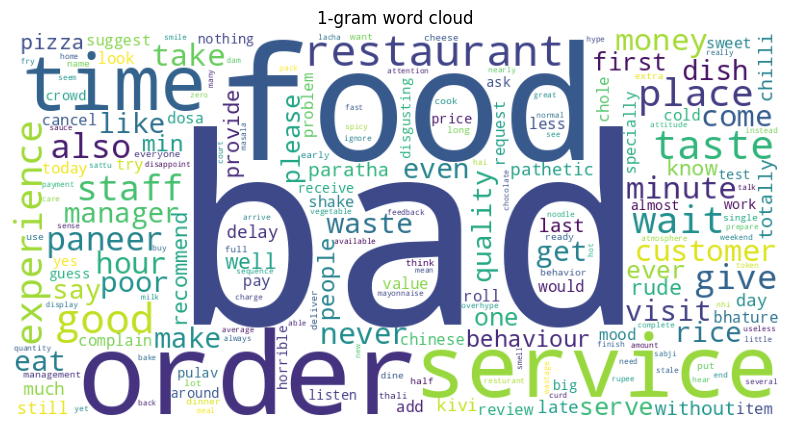

In [ ]:
create_wordcloud(unigram,'1-gram word cloud')

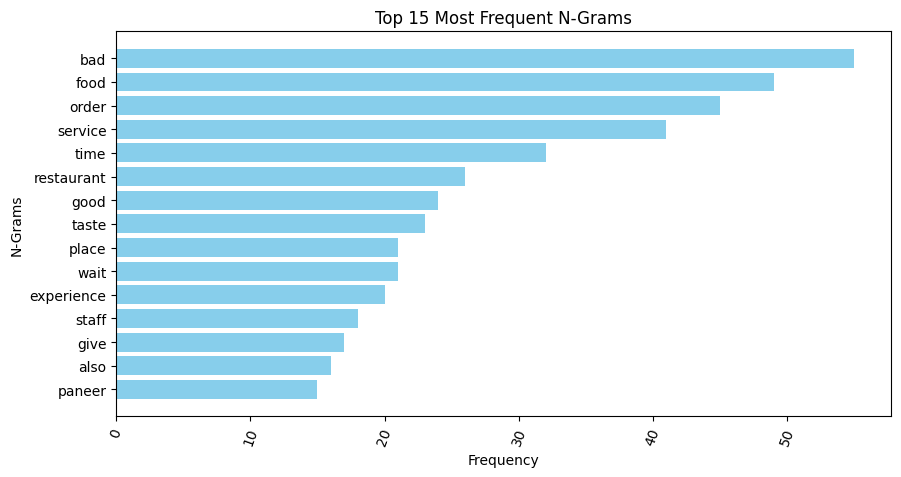

In [ ]:
frequency_plot(unigram,15)

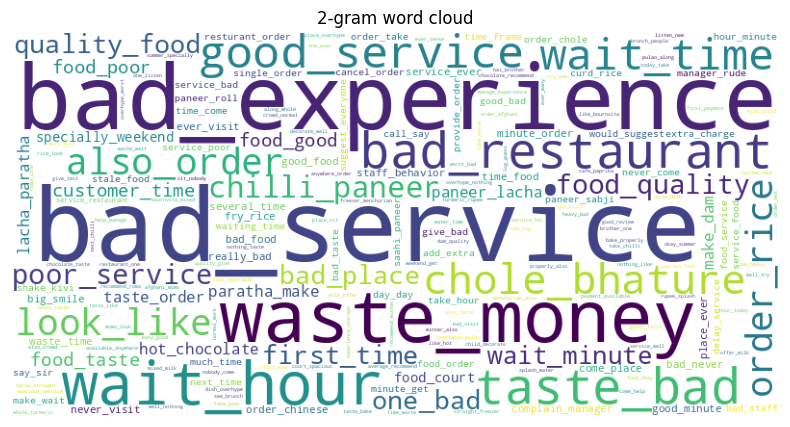

In [ ]:
create_wordcloud(bigram,'2-gram word cloud')

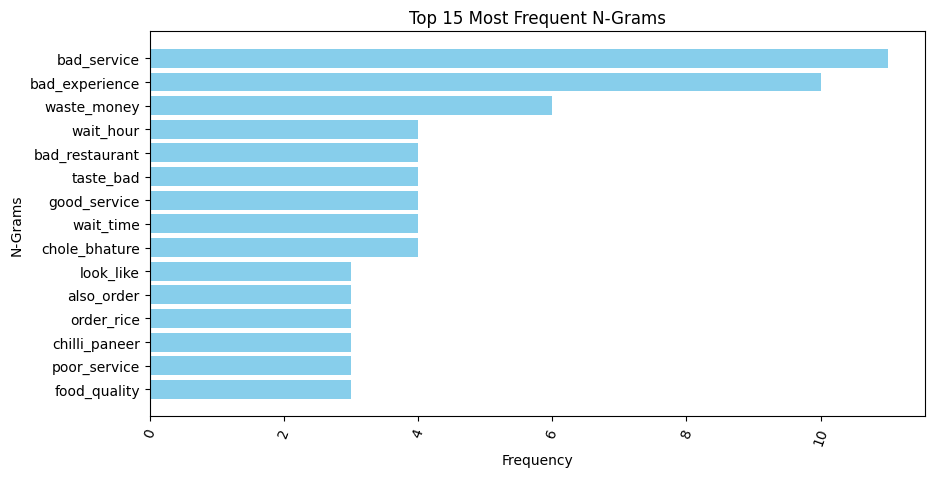

In [ ]:
frequency_plot(bigram,15)

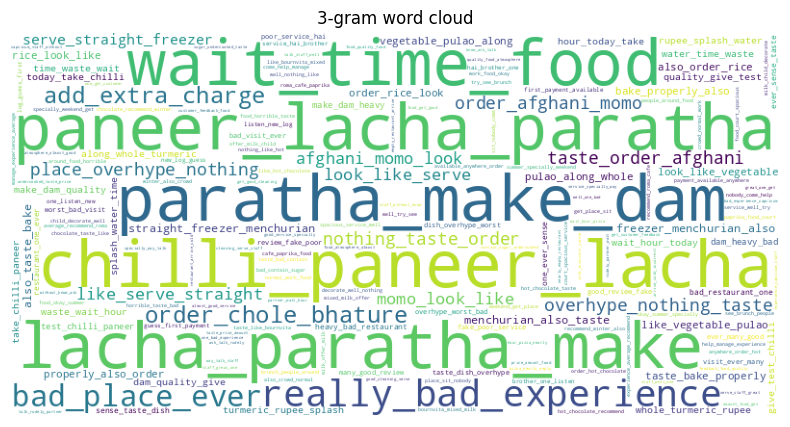

In [ ]:
create_wordcloud(trigram,'3-gram word cloud')

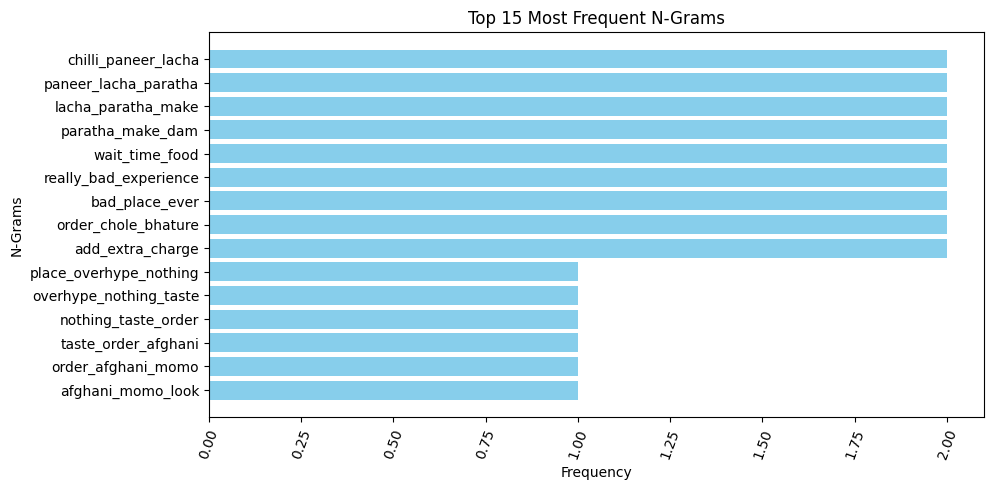

In [ ]:
frequency_plot(trigram,15)

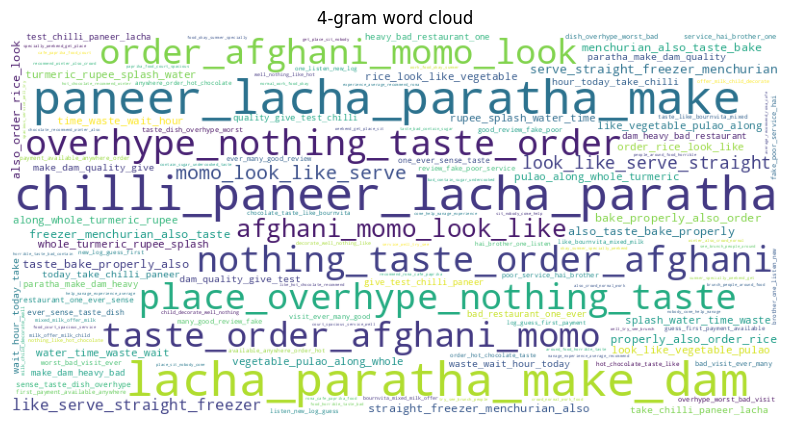

In [ ]:
create_wordcloud(fourgram,'4-gram word cloud')

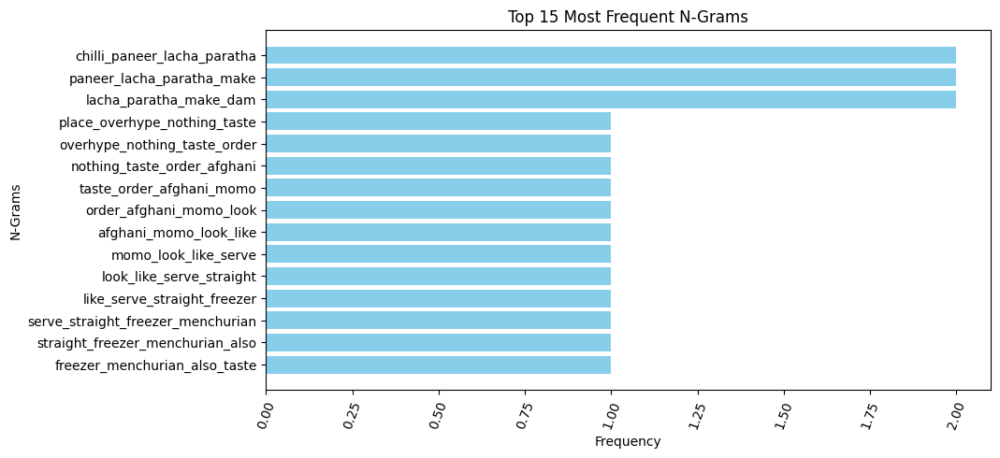

In [ ]:
frequency_plot(fourgram,15)

In [ ]:
allgram= unigram+bigram+trigram+fourgram

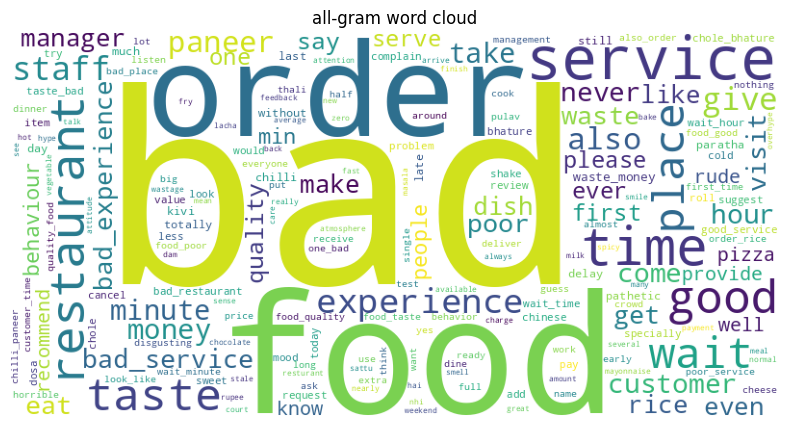

In [ ]:
create_wordcloud(allgram,'all-gram word cloud')

In [ ]:
joined_text2

'  place   overhype nothing taste order afghani momo look like   serve straight    freezer menchurian also taste   bake properly also    order rice look like    vegetable pulao   along   whole turmeric rupee   splash water time   waste   wait   hour today take chilli paneer   lacha paratha   make dam quality give test chilli paneer   lacha paratha   make dam     heavy bad restaurant one   ever   sense taste     dish   overhype worst   bad   visit ever   many good review      fake poor service hai brother   one listen    new log    go   guess   first    payment   available anywhere order hot chocolate    taste like bournvita   mixed milk   offer milk   child   decorate well     nothing like hot chocolate recommend   winter also   crowd normal    work food okay   summer specially weekend     get place sit nobody   come help     manage   experience    average   recommend roma cafe paprika food court lanka varanasi    spacious   service well   try   see brunch people around    food   horri

In [ ]:
result = re.sub(r'\b\w\b', '', joined_text2)
result = re.sub(r'\bs\b', '', result)

# removing 2 char  word also
result = re.sub(r'\b\w{2}\b', '', result)
# Remove extra spaces
result2 = re.sub(r'\s+', ' ', result).strip()



print(result2)

place overhype nothing taste order afghani momo look like serve straight freezer menchurian also taste bake properly also order rice look like vegetable pulao along whole turmeric rupee splash water time waste wait hour today take chilli paneer lacha paratha make dam quality give test chilli paneer lacha paratha make dam heavy bad restaurant one ever sense taste dish overhype worst bad visit ever many good review fake poor service hai brother one listen new log guess first payment available anywhere order hot chocolate taste like bournvita mixed milk offer milk child decorate well nothing like hot chocolate recommend winter also crowd normal work food okay summer specially weekend get place sit nobody come help manage experience average recommend roma cafe paprika food court lanka varanasi spacious service well try see brunch people around food horrible taste bad contain sugar undercooked taste price amount food get good cleaning serve staff great one get customer feedback food quality

In [ ]:
#converting string into list
def convert(string):
    li = list(string.split(" "))
    return li

text_final=convert(result2)

In [ ]:
# Step 1: Import necessary libraries


import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text.lower()) for text in text_final]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]


[(0,
  '0.072*"food" + 0.040*"staff" + 0.029*"good" + 0.028*"experience" + '
  '0.024*"come" + 0.023*"wait" + 0.023*"customer" + 0.022*"late" + '
  '0.018*"also" + 0.016*"never"'),
 (1,
  '0.087*"service" + 0.080*"order" + 0.065*"restaurant" + 0.053*"time" + '
  '0.025*"rice" + 0.020*"take" + 0.019*"even" + 0.015*"waste" + 0.014*"paneer" '
  '+ 0.012*"capsicum"'),
 (2,
  '0.091*"bad" + 0.036*"hour" + 0.035*"give" + 0.025*"please" + 0.024*"make" + '
  '0.024*"pathetic" + 0.021*"money" + 0.017*"serve" + 0.013*"bhature" + '
  '0.013*"chole"'),
 (3,
  '0.041*"place" + 0.033*"taste" + 0.027*"rude" + 0.023*"behaviour" + '
  '0.022*"eat" + 0.021*"visit" + 0.018*"first" + 0.017*"problem" + 0.014*"say" '
  '+ 0.013*"one"')]


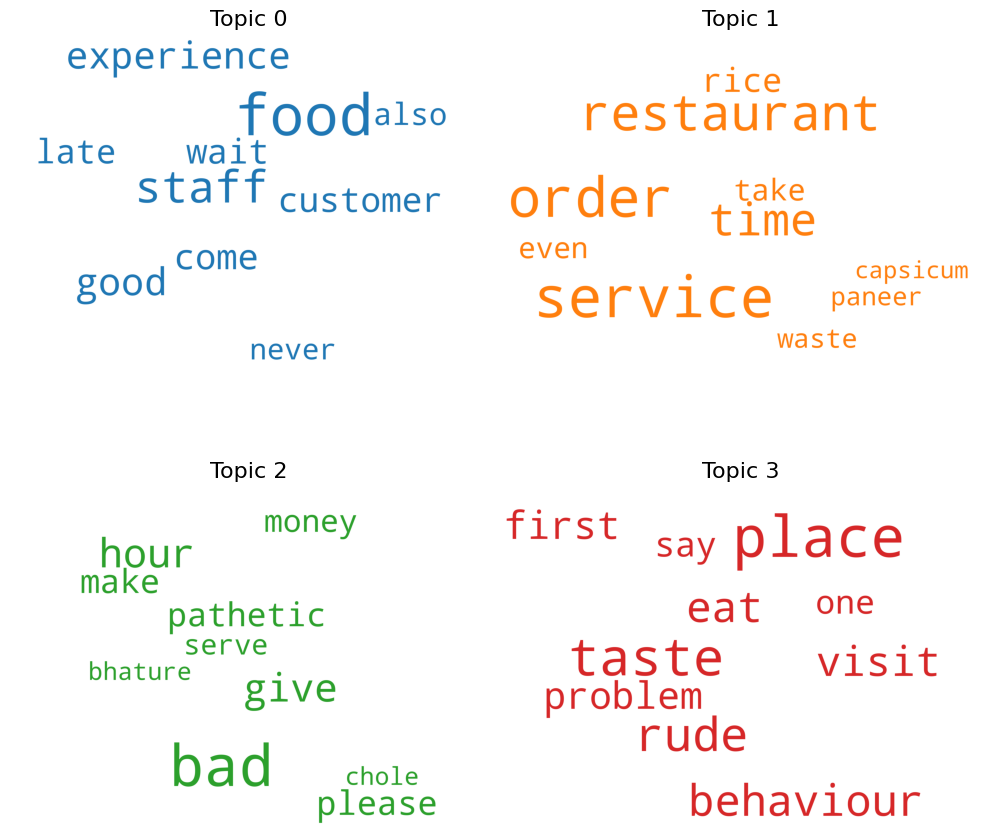

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

In [ ]:
bigram_words_lda3=generate_ngrams_lda(result2,2)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in bigram_words_lda3]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_bigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_bigram.print_topics())
doc_lda_bigram = lda_model_bigram[corpus]


[(0,
  '0.009*"chole_bhature" + 0.007*"waste_money" + 0.005*"wait_hour" + '
  '0.004*"wait_minute" + 0.003*"ever_visit" + 0.003*"bad_place" + '
  '0.002*"staff_behavior" + 0.002*"cancel_order" + 0.002*"face_give" + '
  '0.002*"know_make"'),
 (1,
  '0.020*"bad_service" + 0.003*"fry_rice" + 0.002*"cancel_order" + '
  '0.002*"vegetable_also" + 0.002*"plz_ask" + 0.002*"later_order" + '
  '0.002*"amount_vegetable" + 0.002*"bekar_food" + 0.002*"less_bad" + '
  '0.002*"order_pathetic"'),
 (2,
  '0.004*"time_come" + 0.002*"bad_never" + 0.002*"waste_time" + '
  '0.002*"rice_fully" + 0.002*"dry_rice" + 0.002*"make_payment" + '
  '0.002*"handling_chole" + 0.002*"rude_plz" + 0.002*"unprofessional_staff" + '
  '0.002*"behaviour_late"'),
 (3,
  '0.013*"bad_experience" + 0.004*"good_service" + 0.003*"food_good" + '
  '0.003*"bad_restaurant" + 0.003*"one_bad" + 0.003*"quality_food" + '
  '0.003*"cancel_order" + 0.003*"manager_rude" + 0.003*"waiting_time" + '
  '0.003*"food_order"')]


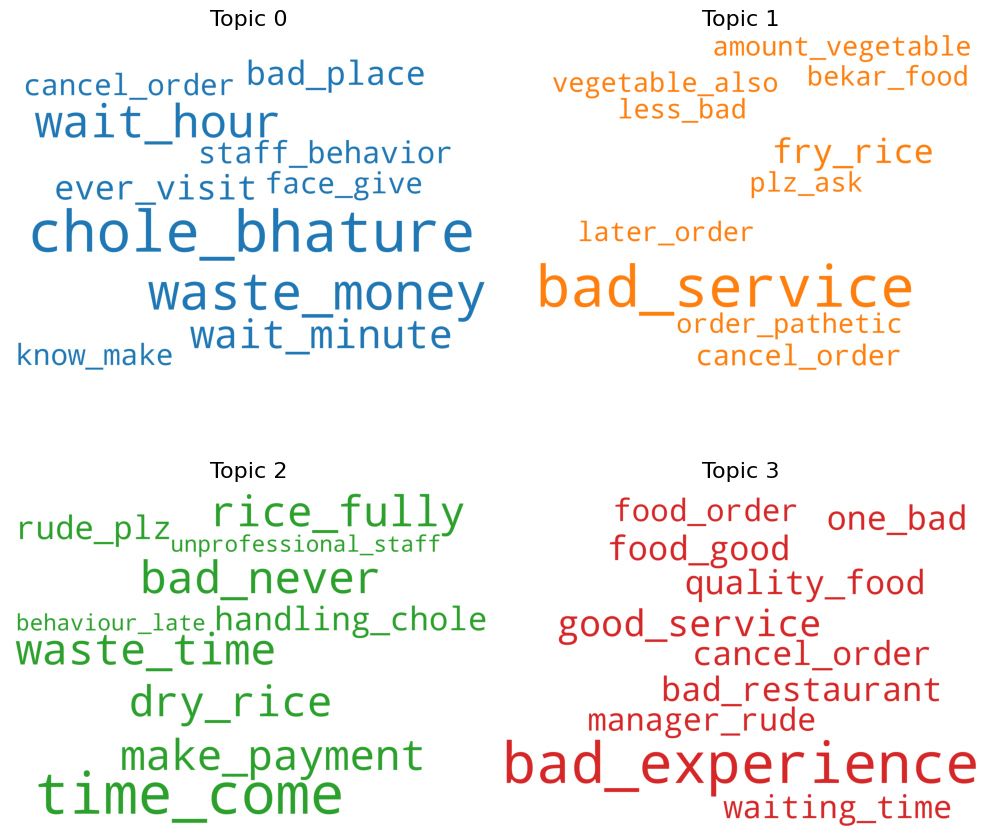

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_bigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

In [ ]:
trigram_words_lda3=generate_ngrams_lda(result2,3)

In [ ]:
# Step 1: Import necessary libraries
import gensim
from gensim import corpora
import pprint


# Example preprocessing (tokenization)

from nltk.tokenize import word_tokenize


# Tokenize words
tokenized_text = [word_tokenize(text) for text in trigram_words_lda3]


# Step 3: Create a dictionary and corpus
id2word = corpora.Dictionary(tokenized_text)
corpus = [id2word.doc2bow(doc) for doc in tokenized_text]

# Step 4: Train the LDA model
lda_model_trigram = gensim.models.LdaModel(corpus=corpus,
                   id2word=id2word,
                   num_topics=4,
                   random_state=100,
                   update_every=1,
                   chunksize=100,
                   alpha='auto',
                   per_word_topics=True)

# Step 5: Print the topics
pprint.pprint(lda_model_trigram.print_topics())
doc_lda_trigram = lda_model_trigram[corpus]


[(0,
  '0.002*"manager_rude_plz" + 0.002*"deliverig_token_order" + '
  '0.002*"order_later_order" + 0.002*"dhak_verg_bad" + '
  '0.002*"fully_cook_amount" + 0.002*"chole_bhature_average" + '
  '0.002*"restaurant_floor_manager" + 0.002*"people_first_experience" + '
  '0.002*"dhek_dhak_verg" + 0.002*"plz_ask_behaviour"'),
 (1,
  '0.002*"restaurant_worthless_hour" + 0.002*"value_time_customer" + '
  '0.002*"verg_bad_service" + 0.002*"dhak_verg_bad" + '
  '0.002*"staff_restaurant_floor" + 0.002*"rice_dry_rice" + '
  '0.002*"order_pathetic_service" + 0.002*"cook_amount_vegetable" + '
  '0.002*"give_value_time" + 0.002*"rude_unprofessional_staff"'),
 (2,
  '0.002*"cancel_order_eventually" + 0.002*"behaviour_late_serve" + '
  '0.002*"waiting_time_come" + 0.002*"customer_service_baasi" + '
  '0.002*"customer_pathetic_customer" + 0.002*"service_baasi_bekar" + '
  '0.002*"cook_amount_vegetable" + 0.002*"baasi_bekar_food" + '
  '0.002*"average_dhek_dhak" + 0.002*"token_order_later"'),
 (3,
  '0.0

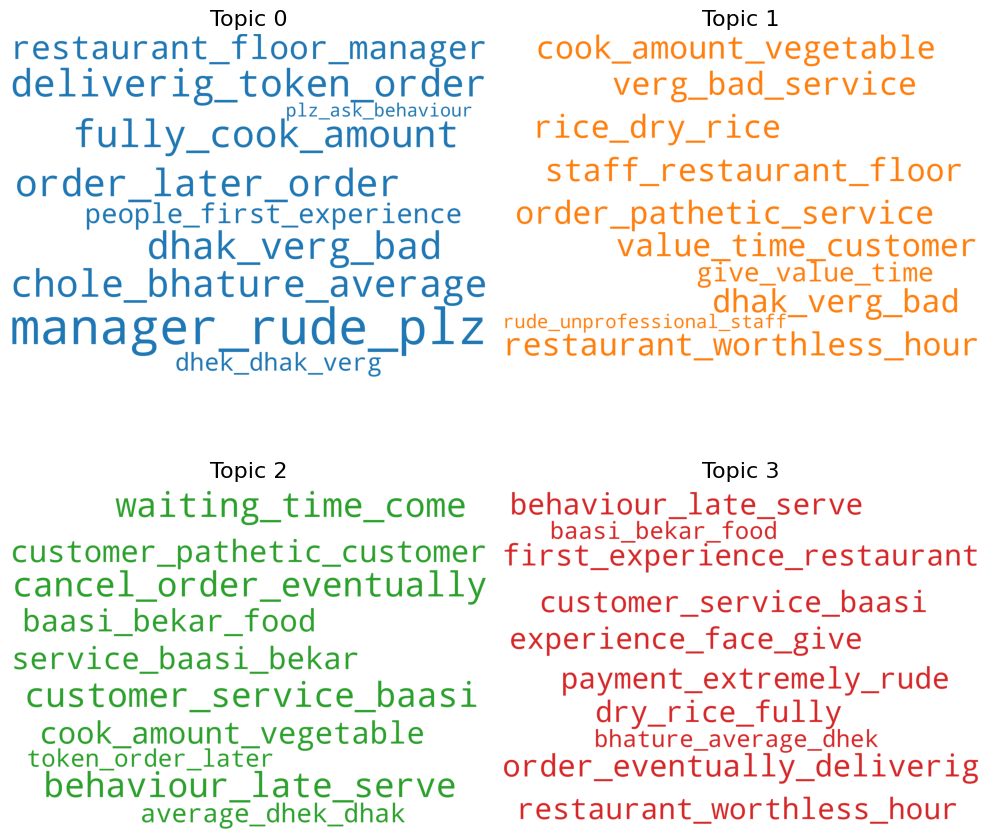

In [ ]:

  from matplotlib import pyplot as plt
  from wordcloud import WordCloud, STOPWORDS
  import matplotlib.colors as mcolors

  cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

  cloud = WordCloud(stopwords=None,
                    background_color='white',
                    width=2500,
                    height=1800,
                    max_words=10,
                    colormap='tab10',
                    color_func=lambda *args, **kwargs: cols[i],
                    prefer_horizontal=1.0)

  topics = lda_model_trigram.show_topics(formatted=False)

  fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(topics[i][1])
      cloud.generate_from_frequencies(topic_words, max_font_size=300)
      plt.gca().imshow(cloud)
      plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
      plt.gca().axis('off')


  plt.subplots_adjust(wspace=0, hspace=0)
  plt.axis('off')
  plt.margins(x=0, y=0)
  plt.tight_layout()
  plt.show()

In [ ]:
mask2 =~df['user_text'].isnull()
mask2

,user_text
0,True
1,True
2,True
3,True
4,True
...,...
457,True
484,True
491,True
568,True


In [ ]:
final_text =' '.join(df['cleaned'][ mask2])

In [ ]:
print(final_text)

capsicum   a must visit in varanasi  rating  5 5 review  tucked away in the heart of varanasi  capsicum is a hidden gem that will delight your taste buds and leave you craving for more  this casual dining outlet is a treasure trove of flavors  offering an extensive menu that spans across the globe  from indian to chinese  italian  mexican  and american cuisines  ambiance  the moment you step into capsicum  you will be enveloped in a warm and welcoming atmosphere that instantly puts you at ease  the comfortable seating and soothing decor create the perfect setting for a leisurely meal with friends and family  food  the menu is a masterclass in diversity  with dishes carefully crafted to cater to various tastes and dietary preferences  standout dishes like the maharaja platter  platters  paneer roll  veg roll  white sauce pasta  and crispy baby corn are a testament to the chef s creativity and expertise  the portions are generous  and the prices are incredibly reasonable  making it an ex